# Assignment 02 

-analysis and segmentation of dataset rotten_tomatoes_movies.csv. 

# DATA CLEANING

In [3]:
!pip install plotly


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib 
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")
import datetime

In [5]:
df=pd.read_csv("rotten_tomatoes_movies.csv")

In [6]:
df.head()

,id,title,audienceScore,tomatoMeter,rating,ratingContents,releaseDateTheaters,releaseDateStreaming,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix
0,space-zombie-bingo,Space Zombie Bingo!,50.0,NaN,NaN,NaN,NaN,2018-08-25,75.0,"Comedy, Horror, Sci-fi",English,George Ormrod,"George Ormrod,John Sabotta",NaN,NaN,NaN
1,the_green_grass,The Green Grass,NaN,NaN,NaN,NaN,NaN,2020-02-11,114.0,Drama,English,Tiffany Edwards,Tiffany Edwards,NaN,NaN,NaN
2,love_lies,"Love, Lies",43.0,NaN,NaN,NaN,NaN,NaN,120.0,Drama,Korean,"Park Heung-Sik,Heung-Sik Park","Ha Young-Joon,Jeon Yun-su,Song Hye-jin",NaN,NaN,NaN
3,the_sore_losers_1997,Sore Losers,60.0,NaN,NaN,NaN,NaN,2020-10-23,90.0,"Action, Mystery & thriller",English,John Michael McCarthy,John Michael McCarthy,NaN,NaN,NaN
4,dinosaur_island_2002,Dinosaur Island,70.0,NaN,NaN,NaN,NaN,2017-03-27,80.0,"Fantasy, Adventure, Animation",English,Will Meugniot,John Loy,NaN,NaN,NaN


In [7]:
df.tail()

,id,title,audienceScore,tomatoMeter,rating,ratingContents,releaseDateTheaters,releaseDateStreaming,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix
143253,nadia_the_secret_of_blue_water_the_motion_pict...,Nadia: The Secret of Blue Water: The Motion Pi...,14.0,NaN,NaN,NaN,2002-08-27,NaN,90.0,"Action, Adventure, Anime",Japanese,Sho Aono,Kaoru Umeno,NaN,ADV Films,NaN
143254,everyone_i_knew_and_loved,Everyone I Knew and Loved,NaN,NaN,NaN,NaN,NaN,NaN,99.0,Drama,English,Andrew Behringer,Erika Heidewald,NaN,NaN,NaN
143255,the-human-body,The Human Body,71.0,89.0,NaN,NaN,NaN,NaN,43.0,Documentary,English,Peter Georgi,Richard Dale,NaN,NaN,NaN
143256,flying_fists,Flying Fists,NaN,NaN,NaN,NaN,NaN,2006-11-21,63.0,Drama,English,Robert F. Hill,"Robert F. Hill,Basil Dickey",NaN,NaN,NaN
143257,awakening-2005,Awakening,NaN,NaN,NaN,NaN,NaN,NaN,90.0,Horror,English,David J. Francis,"David J. Francis,Mike Masters",NaN,NaN,NaN


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 143258 entries, 0 to 143257
Data columns (total 16 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    143258 non-null  object 
 1   title                 142891 non-null  object 
 2   audienceScore         73248 non-null   float64
 3   tomatoMeter           33877 non-null   float64
 4   rating                13991 non-null   object 
 5   ratingContents        13991 non-null   object 
 6   releaseDateTheaters   30773 non-null   object 
 7   releaseDateStreaming  79420 non-null   object 
 8   runtimeMinutes        129431 non-null  float64
 9   genre                 132175 non-null  object 
 10  originalLanguage      129400 non-null  object 
 11  director              139041 non-null  object 
 12  writer                90116 non-null   object 
 13  boxOffice             14743 non-null   object 
 14  distributor           23001 non-null   object 
 15  

In [9]:
df.dtypes

id                       object
title                    object
audienceScore           float64
tomatoMeter             float64
rating                   object
ratingContents           object
releaseDateTheaters      object
releaseDateStreaming     object
runtimeMinutes          float64
genre                    object
originalLanguage         object
director                 object
writer                   object
boxOffice                object
distributor              object
soundMix                 object
dtype: object

In [10]:
df.shape

(143258, 16)

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
audienceScore,73248.0,55.674967,24.553648,0.0,37.0,57.0,76.0,100.0
tomatoMeter,33877.0,65.770346,28.023203,0.0,45.0,73.0,89.0,100.0
runtimeMinutes,129431.0,93.708578,28.129175,1.0,84.0,92.0,103.0,2700.0


In [12]:
df=df.drop(["id"], axis=1)

In [13]:
df.shape

(143258, 15)

In [14]:
print(df.duplicated().any())

True


In [15]:
num_duplicates=df.duplicated().sum()
print(num_duplicates)

1562


In [16]:
df.drop_duplicates(inplace=True)
print(df.shape)

(141696, 15)


In [17]:
#num_duplicates = len(df2) - len(df2.drop_duplicates())
percentage_dropped = (num_duplicates / (len(df) + num_duplicates)) * 100
print(f"{percentage_dropped:.2f}% of duplicates were dropped from the data.")

1.09% of duplicates were dropped from the data.


In [18]:
df.shape

(141696, 15)

In [19]:
df.isnull()

,title,audienceScore,tomatoMeter,rating,ratingContents,releaseDateTheaters,releaseDateStreaming,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix
0,False,False,True,True,True,True,False,False,False,False,False,False,True,True,True
1,False,True,True,True,True,True,False,False,False,False,False,False,True,True,True
2,False,False,True,True,True,True,True,False,False,False,False,False,True,True,True
3,False,False,True,True,True,True,False,False,False,False,False,False,True,True,True
4,False,False,True,True,True,True,False,False,False,False,False,False,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143253,False,False,True,True,True,False,True,False,False,False,False,False,True,False,True
143254,False,True,True,True,True,True,True,False,False,False,False,False,True,True,True
143255,False,False,False,True,True,True,True,False,False,False,False,False,True,True,True
143256,False,True,True,True,True,True,False,False,False,False,False,False,True,True,True


In [20]:
df.isnull().sum()

title                       73
audienceScore            69068
tomatoMeter             108122
rating                  127840
ratingContents          127840
releaseDateTheaters     111184
releaseDateStreaming     62966
runtimeMinutes           13374
genre                    10658
originalLanguage         13406
director                  3889
writer                   52340
boxOffice               127080
distributor             118897
soundMix                125911
dtype: int64

In [21]:
null_percentages = df.isnull().mean() * 100
print("Null percentages:\n\n", null_percentages)

Null percentages:

 title                    0.051519
audienceScore           48.743790
tomatoMeter             76.305612
rating                  90.221319
ratingContents          90.221319
releaseDateTheaters     78.466576
releaseDateStreaming    44.437387
runtimeMinutes           9.438516
genre                    7.521737
originalLanguage         9.461100
director                 2.744608
writer                  36.938234
boxOffice               89.684959
distributor             83.909920
soundMix                88.859954
dtype: float64


In [22]:
df.dropna(inplace=True)

In [23]:
df.isnull().sum()

title                   0
audienceScore           0
tomatoMeter             0
rating                  0
ratingContents          0
releaseDateTheaters     0
releaseDateStreaming    0
runtimeMinutes          0
genre                   0
originalLanguage        0
director                0
writer                  0
boxOffice               0
distributor             0
soundMix                0
dtype: int64

In [24]:
df.shape

(3104, 15)

In [25]:
df.head()

,title,audienceScore,tomatoMeter,rating,ratingContents,releaseDateTheaters,releaseDateStreaming,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix
88,Monsoon Wedding,87.0,95.0,R,"['Some Sex Related Dialogue', 'Language']",2002-02-22,2002-09-24,100.0,"Comedy, Drama",English,Mira Nair,Sabrina Dhawan,$13.9M,USA Films,"Dolby Stereo, Dolby Digital, Dolby A, Surround..."
146,Robin Hood,40.0,15.0,PG-13,"['Extended Sequences of Violence', 'Action', '...",2018-11-21,2019-02-19,118.0,"Action, Adventure",English,Otto Bathurst,"Ben Chandler,David James Kelly",$30.8M,Lionsgate Films,Dolby Atmos
151,My Giant,25.0,21.0,PG,"['Violence', 'Language', 'Brief Crude Humor']",1998-04-10,1998-09-29,103.0,"Comedy, Drama",English,Michael Lehmann,"Billy Crystal,David Seltzer,David Seltzer",$8.0M,Columbia Pictures,"SDDS, Dolby SR, Dolby Digital, Surround, Dolby..."
273,West Side Story,93.0,91.0,PG-13,"['Some Strong Violence', 'Brief Smoking', 'Str...",2021-12-10,2022-03-02,156.0,"Musical, Romance",English,Steven Spielberg,Tony Kushner,$38.5M,20th Century Studios,"Dolby Digital, Dolby Atmos"
308,Youth,69.0,71.0,R,"['Language', 'Graphic Nudity', 'Some Sexuality']",2015-12-04,2016-03-01,118.0,Drama,English,Paolo Sorrentino,Paolo Sorrentino,$2.7M,Fox Searchlight,Dolby Atmos


In [26]:
unique_rating = df['rating'].unique()
print(unique_rating)

rating_counts = df['rating'].value_counts()
print(rating_counts)

['R' 'PG-13' 'PG' 'NC-17' 'TVPG']
rating
R        1451
PG-13    1204
PG        444
NC-17       4
TVPG        1
Name: count, dtype: int64


In [27]:
#overview of the distribution of movies across different ratingContents in the dataset
unique_ratingContents = df['ratingContents'].unique()
#print(unique_ratingContents)

ratingContents_counts = df['ratingContents'].value_counts()
print(ratingContents_counts)

ratingContents
['Language']                                                                                              66
['Sexual Content', 'Language']                                                                            41
['Violence', 'Language']                                                                                  29
['Brief Strong Language']                                                                                 19
['Some Language']                                                                                         15
                                                                                                          ..
['Some Rude Humor', 'Mild Action/Violence']                                                                1
['Drug Material', 'Domestic Abuse', 'Some Violence', 'Language', 'Mature Thematic Content', 'Smoking']     1
['Partying', 'Brief Language', 'Sexual Content', 'Smoking', 'Some Violent Images']                         1
['Pe

In [28]:
unique_ratingContents = df['ratingContents'].unique()
term_counts = {}

for rating in unique_ratingContents:
    terms = [term.strip("' ") for term in rating.strip('][').split(',')] # Extract all terms for this rating
    for term in terms:
        if term not in term_counts:
            term_counts[term] = 0
        term_counts[term] += 1

print("Counts for each descriptive term in the 'ratingContents' column, across all ratings:\n")
for term, count in term_counts.items():
    print(term, count)

Counts for each descriptive term in the 'ratingContents' column, across all ratings:

Some Sex Related Dialogue 1
Language 1054
Extended Sequences of Violence 2
Action 53
Some Suggestive References 9
Violence 331
Brief Crude Humor 1
Some Strong Violence 8
Brief Smoking 8
Strong Language 55
Suggestive Material 19
Thematic Content 7
Graphic Nudity 44
Some Sexuality 91
Sexual Dialogue 8
Intense Sequences of Action 28
Some Violence 124
Fantasy Horror Violence/Gore 1
Brief Sexuality/Nudity 3
Mature Thematic Material 18
Sexual Content 230
Sensuality 43
Accident Scenes 1
Sex References 4
Gore 33
Rape 7
Strong Gruesome Violence 4
Sequences of Strong Violence 13
Intense Action 9
Some Language 137
Violent Imagery 2
Intense Thematic Material 3
Crude Humor 56
Strong Sexual Content 61
Language Throughout 88
Drug Content 93
Sexual References 55
Nudity 175
Drug Use 127
Pervasive Language 98
Sexuality 146
Strong Brutal Violence 14
Crude Dialogue 1
Some Drug Use 79
Disturbing Images 84
A Rape 2
Strong 

In [29]:
#descending order
unique_ratingContents = df['ratingContents'].unique()
term_counts = {}

for rating in unique_ratingContents:
    terms = [term.strip("' ") for term in rating.strip('][').split(',')] 
    for term in terms:
        if term not in term_counts:
            term_counts[term] = 0
        term_counts[term] += 1

print("Counts for each descriptive term in the 'ratingContents' column, across all ratings, sorted by count in descending order:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    print(term, count)

Counts for each descriptive term in the 'ratingContents' column, across all ratings, sorted by count in descending order:

Language 1054
Violence 331
Sexual Content 230
Nudity 175
Sexuality 146
Thematic Elements 139
Some Language 137
Drug Use 127
Some Violence 124
Pervasive Language 98
Drug Content 93
Some Sexuality 91
Strong Violence 91
Language Throughout 88
Brief Strong Language 85
Disturbing Images 84
Brief Language 82
Some Drug Use 79
Some Sexual Content 68
Brief Nudity 66
Strong Sexual Content 61
Thematic Material 61
Crude Humor 56
Strong Language 55
Sexual References 55
Action 53
Some Nudity 50
Graphic Nudity 44
Sensuality 43
Some Sensuality 41
Some Disturbing Images 41
Terror 41
Mild Language 41
Some Sexual References 40
Partial Nudity 40
Strong Bloody Violence 39
Brief Drug Use 39
Strong Sexuality 39
Brief Violence 37
Gore 33
Smoking 32
Intense Sequences of Violence 32
Drug Material 30
Drug References 30
Sexual Humor 30
Bloody Images 30
Action/Violence 30
Rude Humor 29
Brief S

In [30]:
unique_genre = df['genre'].unique()
#aprint(unique_genre)

genre_counts = df['genre'].value_counts()
print(genre_counts)

genre
Drama                                                  360
Comedy                                                 331
Comedy, Drama                                          184
Romance, Comedy                                        152
Horror, Mystery & thriller                             114
                                                      ... 
Drama, Biography, War                                    1
Action, Mystery & thriller, Sci-fi, Fantasy              1
Action, Adventure, Crime                                 1
Comedy, Action, Adventure, Western                       1
Kids & family, Adventure, Comedy, Sci-fi, Animation      1
Name: count, Length: 493, dtype: int64


In [31]:
unique_genre = df['genre'].unique()
term_counts = {}

for rating in unique_genre:
    terms = [term.strip("' ") for term in rating.strip('][').split(',')]
    for term in terms:
        if term not in term_counts:
            term_counts[term] = 0
        term_counts[term] += 1

print("Counts for each descriptive term in the 'genre' column, across all ratings, sorted by count in descending order:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    print(term, count)

Counts for each descriptive term in the 'genre' column, across all ratings, sorted by count in descending order:

Drama 206
Adventure 184
Comedy 165
Action 154
Fantasy 132
Mystery & thriller 121
Sci-fi 96
Kids & family 85
Romance 66
Horror 62
Animation 48
Biography 43
History 40
Musical 37
War 30
Crime 29
Holiday 23
Lgbtq+ 18
Music 13
Western 13
Documentary 7
Anime 6


In [32]:
unique_originalLanguage = df['originalLanguage'].unique()
#print(unique_originalLanguage)

originalLanguage_counts = df['originalLanguage'].value_counts()
print(originalLanguage_counts)

originalLanguage
English                     2894
French (Canada)               23
Chinese                       22
French (France)               20
English (United Kingdom)      15
Spanish (Spain)               15
Japanese                      14
German                        11
Spanish                       10
Korean                         7
Italian                        7
Swedish                        6
Czech                          6
Portuguese (Brazil)            6
Hindi                          6
Norwegian                      5
Arabic                         4
Dutch                          4
Danish                         4
English (Australia)            3
Thai                           3
Finnish                        2
Icelandic                      2
Persian                        2
Romanian                       1
Polish                         1
Unknown language               1
Turkish                        1
Tamil                          1
Catalan                   

In [33]:
df['originalLanguage'].str.count(",").sum()

0

In [34]:
unique_director = df['director'].unique()
#print(unique_director)

director_counts = df['director'].value_counts()
print(director_counts)

director
Steven Spielberg         18
Ridley Scott             16
Steven Soderbergh        12
M. Night Shyamalan       12
Lasse Hallström          10
                         ..
William Riead             1
Reggie Rock Bythewood     1
John Hoffman              1
Jamie Blanks              1
Josh Schwartz             1
Name: count, Length: 1615, dtype: int64


In [35]:
unique_director = df['director'].unique()
term_counts = {}

for rating in unique_director:
    terms = [term.strip("' ") for term in rating.strip('][').split(',')] 
    for term in terms:
        if term not in term_counts:
            term_counts[term] = 0
        term_counts[term] += 1

print("Counts for each descriptive term in the 'director' column, across all ratings, sorted by count in descending order:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    print(term, count)

Counts for each descriptive term in the 'director' column, across all ratings, sorted by count in descending order:

Robert Rodriguez 4
Peter Farrelly 4
Allen Hughes 4
Mike Mitchell 3
Chris Weitz 3
Lana Wachowski 3
Don Hall 3
Tim Johnson 3
Paul Weitz 3
Wayne Wang 3
Albert Hughes 3
Andrew Adamson 3
Byron Howard 3
Tim Burton 2
Mark Neveldine 2
Lasse Hallström 2
Jon Erwin 2
Andrew Erwin 2
Robert Farrelly 2
David Bowers 2
Bibo Bergeron 2
David Silverman 2
Jonathan Dayton 2
Valerie Faris 2
Rob Letterman 2
Joel Coen 2
James Gunn 2
Joe Johnston 2
Michael Apted 2
John Landis 2
Oxide Chun Pang 2
Danny Pang 2
Karey Kirkpatrick 2
Kyle Balda 2
Steven Brill 2
Brett Ratner 2
Rob Minkoff 2
Chris Renaud 2
Pierre Coffin 2
Anna Boden 2
Ryan Fleck 2
Chris Kentis 2
Nicholas Stoller 2
Lilly Wachowski 2
Nanette Burstein 2
Dan Kwan 2
Daniel Scheinert 2
Rich Moore 2
Tim Story 2
Vicky Jenson 2
Kelly Asbury 2
Curtis Hanson 2
Steve Carr 2
Robert Ben Garant 2
Dinesh D'Souza 2
Dean DeBlois 2
Tom Tykwer 2
Chris Mil

In [36]:
unique_writer = df['writer'].unique()
#print(unique_writer)

writer_counts = df['writer'].value_counts()
print(writer_counts)

writer
M. Night Shyamalan                          10
Woody Allen                                  9
Tyler Perry                                  9
Luc Besson,Robert Mark Kamen                 8
Steven Knight                                7
                                            ..
Matthew Cook                                 1
Bill Dubuque                                 1
Nicole Holofcener,Ben Affleck,Matt Damon     1
Clairre Cook,Gary David Goldberg             1
Max Werner                                   1
Name: count, Length: 2598, dtype: int64


In [37]:
unique_writer = df['writer'].unique()
term_counts = {}

for rating in unique_writer:
    terms = [term.strip("' ") for term in rating.strip('][').split(',')] # Extract all terms for this rating
    for term in terms:
        if term not in term_counts:
            term_counts[term] = 0
        term_counts[term] += 1

print("Counts for each descriptive term in the 'writer' column, across all ratings, sorted by count in descending order:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    print(term, count)

Counts for each descriptive term in the 'writer' column, across all ratings, sorted by count in descending order:

Peter Tolan 11
Akiva Goldsman 11
John Logan 9
David Koepp 9
Billy Ray 8
Neal Purvis 8
Robert Wade 8
Nicholas Stoller 8
Tony Gilroy 8
Jay Scherick 8
David Ronn 8
Peter Farrelly 7
David S. Goyer 7
Guillermo del Toro 7
Joel Coen 7
Ethan Coen 7
Edgar Wright 7
Leslie Dixon 7
Zak Penn 7
James V. Hart 7
Chris Weitz 7
Luc Besson 7
Michael McCullers 7
Todd Phillips 7
Scot Armstrong 6
Christopher Landon 6
Ehren Kruger 6
Allan Loeb 6
Lawrence Konner 6
James Vanderbilt 6
Stuart Beattie 6
Danny McBride 6
Robert Farrelly 6
Christopher McQuarrie 6
Jez Butterworth 6
Ice Cube 6
Evan Goldberg 6
Simon Kinberg 6
Kurt Wimmer 6
Scott Frank 6
Craig Mazin 6
James Gunn 6
Hossein Amini 6
Charles Leavitt 6
Eric Roth 6
Peter Jackson 6
Roberto Orci 6
Michael Crichton 6
Cormac Wibberley 6
George Gallo 6
M. Night Shyamalan 5
Shane Salerno 5
Michael Green 5
Stephen King 5
Robert Nelson Jacobs 5
Alexander

In [38]:
unique_distributor = df['distributor'].unique()
#print(unique_distributor)

distributor_counts= df['distributor'].value_counts()
print(distributor_counts)

distributor
Warner Bros. Pictures                                   276
Universal Pictures                                      264
Paramount Pictures                                      232
20th Century Fox                                        228
Sony Pictures Entertainment                             157
                                                       ... 
Amazon Studios, Lionsgate Films                           1
Chicago Releasing                                         1
Summit Entertainment, Artisan Entertainment               1
Icon Entertainment International, Paramount Pictures      1
United Artists, IFC Films                                 1
Name: count, Length: 350, dtype: int64


In [39]:
unique_distributor = df['distributor'].unique()
term_counts = {}

for rating in unique_distributor:
    terms = [term.strip("' ") for term in rating.strip('][').split(',')] 
    for term in terms:
        if term not in term_counts:
            term_counts[term] = 0
        term_counts[term] += 1

print("Counts for each descriptive term in the 'distributor' column, across all ratings, sorted by count in descending order:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    print(term, count)

Counts for each descriptive term in the 'distributor' column, across all ratings, sorted by count in descending order:

Lionsgate Films 20
Sony Pictures Entertainment 20
Universal Pictures 18
Miramax Films 16
Buena Vista Pictures 15
Paramount Pictures 14
20th Century Fox 14
DreamWorks SKG 13
New Line Cinema 11
Columbia Pictures 10
Columbia TriStar Home Video 10
Warner Bros. 9
Screen Gems 9
Columbia Tristar 9
Sony Pictures Classics 8
Metro-Goldwyn-Mayer 8
Warner Bros. Pictures 7
Focus Features 7
Touchstone Pictures 7
IFC Films 7
United Artists 6
Roadside Attractions 6
Artisan Entertainment 6
Amazon Studios 6
TriStar Pictures 6
Warner Home Vídeo 6
Criterion Collection 6
USA Films 5
Samuel Goldwyn Company 5
Summit Entertainment 5
Fox 4
Fine Line Features 4
Walt Disney Pictures 4
here! Films 4
Gativideo 4
Argentina Video Home 4
Alliance Atlantis Communications Inc. 4
Metro-Goldwyn-Mayer Distributing Corp. 3
Bleecker Street Media 3
IDP Distribution 3
Buena Vista International [us] 3
Medusa 

In [40]:
unique_sound_mix = df['soundMix'].unique()
#print(unique_sound_mix)

sound_mix_counts= df['soundMix'].value_counts()
print(sound_mix_counts)

soundMix
Dolby Digital                                                          432
Dolby SRD, DTS, SDDS                                                   227
Surround                                                               168
Dolby SR, DTS, Dolby Stereo, Surround, SDDS, Dolby A, Dolby Digital    163
Dolby Atmos                                                            135
                                                                      ... 
Dolby Digital, Dolby SR, DTS-ES, Dolby Stereo, Surround, DTS             1
Dolby Atmos, SDDS, Dolby Digital                                         1
Dolby Stereo, Dolby Digital, Surround                                    1
DTS, SDDS, Dolby Atmos                                                   1
CDS                                                                      1
Name: count, Length: 341, dtype: int64


In [41]:
unique_soundMix = df['soundMix'].unique()
term_counts = {}

for rating in unique_soundMix:
    terms = [term.strip("' ") for term in rating.strip('][').split(',')] 
    for term in terms:
        if term not in term_counts:
            term_counts[term] = 0
        term_counts[term] += 1

print("Counts for each descriptive term in the 'soundMix' column, across all ratings, sorted by count in descending order:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    print(term, count)

Counts for each descriptive term in the 'soundMix' column, across all ratings, sorted by count in descending order:

Dolby Digital 209
DTS 176
SDDS 175
Surround 174
Dolby SR 127
Dolby Stereo 103
Dolby A 69
Dolby Atmos 59
Datasat 50
Dolby SRD 49
Stereo 34
Dolby 31
Dolby EX 16
DTS-ES 12
Mono 5
Magnetic Stereo 6 Track 3
Digital 5.1 1
Ultra-Stereo 1
CDS 1


In [42]:
#df["boxOffice"]=df["boxOffice"].str.replace("$","")

def box_office_new(value):
    value = value.replace('$','')
    
    if 'M' in value:
        value = value.replace('M', '')
        return float(value) * 1000000
    elif 'K' in value:
        value = value.replace('K', '')
        return float(value) * 1000
    else:
        return float(value)

df['boxOffice'] = df['boxOffice'].apply(box_office_new)

In [43]:
print(df.boxOffice.head(5))
print(df['boxOffice'].dtype)

88     13900000.0
146    30800000.0
151     8000000.0
273    38500000.0
308     2700000.0
Name: boxOffice, dtype: float64
float64


In [44]:
df['boxOffice'] = pd.to_numeric(df['boxOffice'], errors='coerce')
#coerce parameter is used to handle any values that cannot be converted to numeric.

In [45]:
df.head(2)

,title,audienceScore,tomatoMeter,rating,ratingContents,releaseDateTheaters,releaseDateStreaming,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix
88,Monsoon Wedding,87.0,95.0,R,"['Some Sex Related Dialogue', 'Language']",2002-02-22,2002-09-24,100.0,"Comedy, Drama",English,Mira Nair,Sabrina Dhawan,13900000.0,USA Films,"Dolby Stereo, Dolby Digital, Dolby A, Surround..."
146,Robin Hood,40.0,15.0,PG-13,"['Extended Sequences of Violence', 'Action', '...",2018-11-21,2019-02-19,118.0,"Action, Adventure",English,Otto Bathurst,"Ben Chandler,David James Kelly",30800000.0,Lionsgate Films,Dolby Atmos


In [46]:
df_numeric=df.select_dtypes(include="float")
df_numeric

,audienceScore,tomatoMeter,runtimeMinutes,boxOffice
88,87.0,95.0,100.0,13900000.0
146,40.0,15.0,118.0,30800000.0
151,25.0,21.0,103.0,8000000.0
273,93.0,91.0,156.0,38500000.0
308,69.0,71.0,118.0,2700000.0
...,...,...,...,...
143000,58.0,6.0,100.0,16200000.0
143008,77.0,49.0,145.0,152600000.0
143012,81.0,50.0,125.0,4900000.0
143025,44.0,22.0,92.0,55400.0


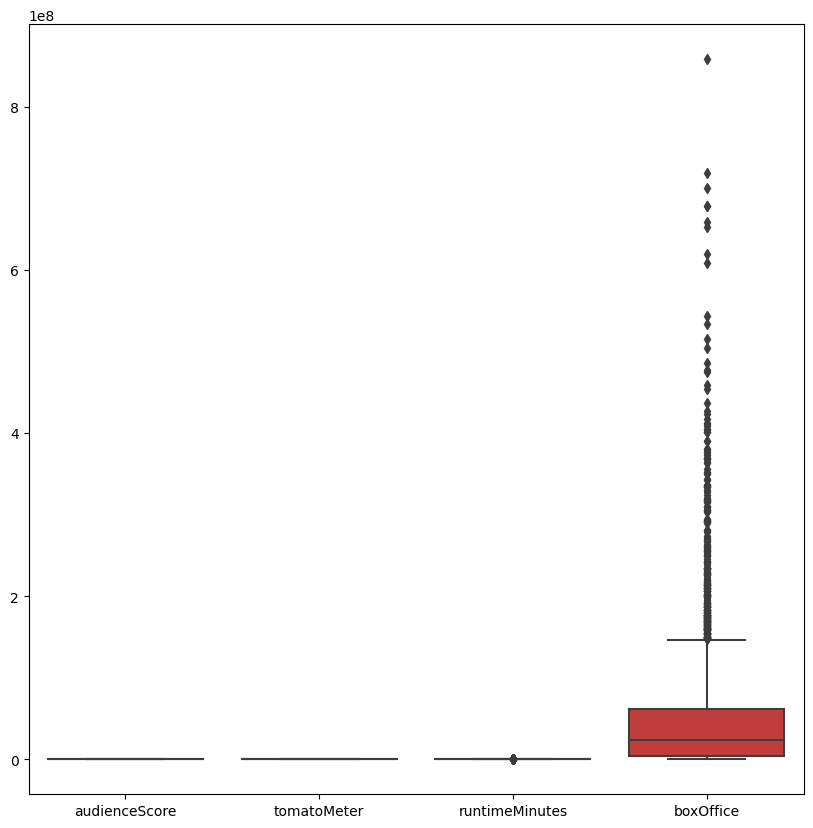

In [47]:
plt.figure(figsize=(10,10))
sns.boxplot(data=df_numeric)
plt.show()

<AxesSubplot: xlabel='audienceScore'>

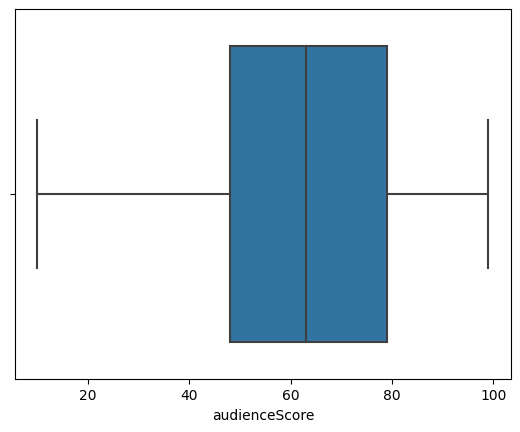

In [48]:
sns.boxplot(x=df['audienceScore'])

<AxesSubplot: xlabel='tomatoMeter'>

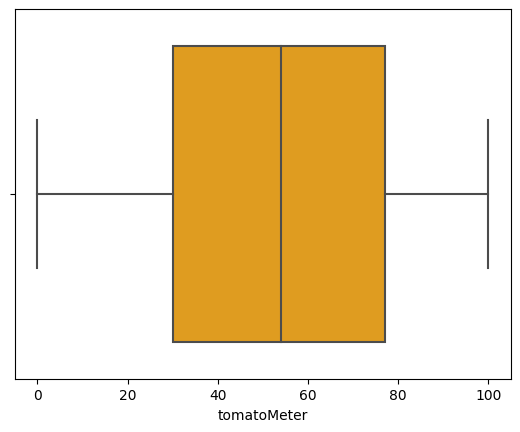

In [49]:
sns.boxplot(x=df['tomatoMeter'], color='orange')

<AxesSubplot: xlabel='runtimeMinutes'>

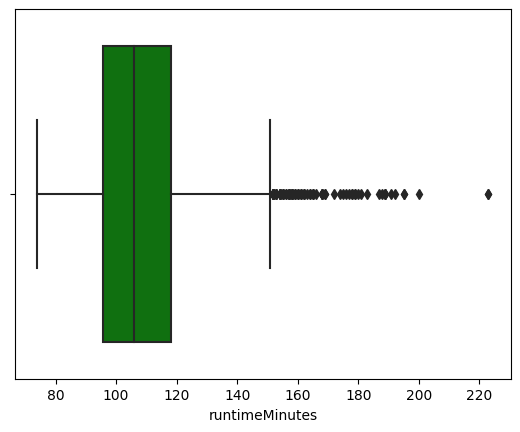

In [50]:
sns.boxplot(x=df['runtimeMinutes'],color='green')

In [51]:
max_runtime = df['runtimeMinutes'].max()
print(max_runtime)

223.0


In [52]:
max_index = df['runtimeMinutes'].idxmax()
max_row = df.loc[max_index]
print(max_row)

title                                                   Gods and Generals
audienceScore                                                        64.0
tomatoMeter                                                           8.0
rating                                                              PG-13
ratingContents                             ['Sustained Battle Sequences']
releaseDateTheaters                                            2003-02-21
releaseDateStreaming                                           2004-08-31
runtimeMinutes                                                      223.0
genre                                                 War, History, Drama
originalLanguage                                                  English
director                                                Ronald F. Maxwell
writer                                      Ronald F. Maxwell,Jeff Shaara
boxOffice                                                      12900000.0
distributor                           

<AxesSubplot: xlabel='boxOffice'>

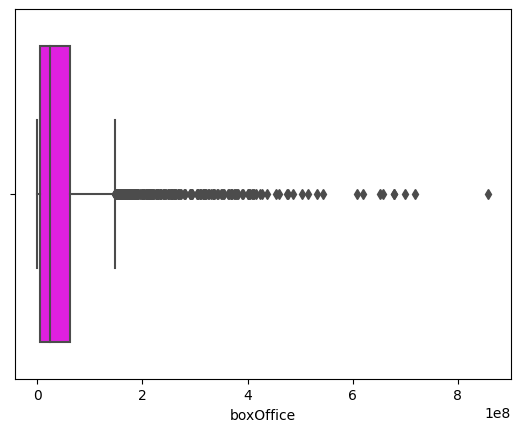

In [53]:
sns.boxplot(data=df, x='boxOffice', color='magenta')

In [54]:
max_boxOffice = df['boxOffice'].max()
print(max_boxOffice)

858400000.0


In [55]:
max_index = df['boxOffice'].idxmax()
max_row = df.loc[max_index]
print(max_row)

title                                                   Avengers: Endgame
audienceScore                                                        90.0
tomatoMeter                                                          94.0
rating                                                              PG-13
ratingContents          ['Sequences of Sci-Fi Violence', 'Action', 'So...
releaseDateTheaters                                            2019-04-26
releaseDateStreaming                                           2019-07-30
runtimeMinutes                                                      181.0
genre                                  Action, Adventure, Fantasy, Sci-fi
originalLanguage                                                  English
director                                          Anthony Russo,Joe Russo
writer                                 Christopher Markus,Stephen McFeely
boxOffice                                                     858400000.0
distributor                           

In [56]:
#selected_rows = df[df['runtimeMinutes'] == 223.0]
#df = df.drop(max_index)

In [57]:
# Convert the 'date' column to datetime format
df['releaseDateTheaters'] = pd.to_datetime(df['releaseDateTheaters'])
print(df.iloc[0])

title                                                     Monsoon Wedding
audienceScore                                                        87.0
tomatoMeter                                                          95.0
rating                                                                  R
ratingContents                  ['Some Sex Related Dialogue', 'Language']
releaseDateTheaters                                   2002-02-22 00:00:00
releaseDateStreaming                                           2002-09-24
runtimeMinutes                                                      100.0
genre                                                       Comedy, Drama
originalLanguage                                                  English
director                                                        Mira Nair
writer                                                     Sabrina Dhawan
boxOffice                                                      13900000.0
distributor                           

In [58]:
# Convert the 'date' column to datetime format
df['releaseDateStreaming'] = pd.to_datetime(df['releaseDateStreaming'])
print(df.iloc[0])

title                                                     Monsoon Wedding
audienceScore                                                        87.0
tomatoMeter                                                          95.0
rating                                                                  R
ratingContents                  ['Some Sex Related Dialogue', 'Language']
releaseDateTheaters                                   2002-02-22 00:00:00
releaseDateStreaming                                  2002-09-24 00:00:00
runtimeMinutes                                                      100.0
genre                                                       Comedy, Drama
originalLanguage                                                  English
director                                                        Mira Nair
writer                                                     Sabrina Dhawan
boxOffice                                                      13900000.0
distributor                           

In [59]:
# Remove the time part
df['releaseDateTheaters'] = df['releaseDateTheaters'].dt.date
df['releaseDateStreaming'] = df['releaseDateStreaming'].dt.date

print(df.iloc[0])

title                                                     Monsoon Wedding
audienceScore                                                        87.0
tomatoMeter                                                          95.0
rating                                                                  R
ratingContents                  ['Some Sex Related Dialogue', 'Language']
releaseDateTheaters                                            2002-02-22
releaseDateStreaming                                           2002-09-24
runtimeMinutes                                                      100.0
genre                                                       Comedy, Drama
originalLanguage                                                  English
director                                                        Mira Nair
writer                                                     Sabrina Dhawan
boxOffice                                                      13900000.0
distributor                           

In [60]:
df['releaseDateTheaters'] = pd.to_datetime(df['releaseDateTheaters'])
df['releaseDateStreaming'] = pd.to_datetime(df['releaseDateStreaming'])

df['daysBetween'] = (df['releaseDateStreaming'] - df['releaseDateTheaters']).dt.days

In [61]:
df.head(2)

,title,audienceScore,tomatoMeter,rating,ratingContents,releaseDateTheaters,releaseDateStreaming,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix,daysBetween
88,Monsoon Wedding,87.0,95.0,R,"['Some Sex Related Dialogue', 'Language']",2002-02-22,2002-09-24,100.0,"Comedy, Drama",English,Mira Nair,Sabrina Dhawan,13900000.0,USA Films,"Dolby Stereo, Dolby Digital, Dolby A, Surround...",214
146,Robin Hood,40.0,15.0,PG-13,"['Extended Sequences of Violence', 'Action', '...",2018-11-21,2019-02-19,118.0,"Action, Adventure",English,Otto Bathurst,"Ben Chandler,David James Kelly",30800000.0,Lionsgate Films,Dolby Atmos,90


In [62]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
audienceScore,3104.0,62.33183,10.0,48.0,63.0,79.0,99.0,19.274182
tomatoMeter,3104.0,53.274162,0.0,30.0,54.0,77.0,100.0,27.202228
releaseDateTheaters,3104,2008-04-14 23:54:25.979381248,1970-03-29 00:00:00,2002-10-11 00:00:00,2006-12-08 00:00:00,2014-01-18 18:00:00,2023-02-03 00:00:00,NaN
releaseDateStreaming,3104,2009-09-18 17:06:38.969072128,1970-04-26 00:00:00,2004-09-19 06:00:00,2008-03-04 00:00:00,2014-11-18 00:00:00,2023-03-28 00:00:00,NaN
runtimeMinutes,3104.0,108.897552,74.0,95.75,106.0,118.0,223.0,18.22164
boxOffice,3104.0,51115509.092139,0.0,4275000.0,24250000.0,61300000.0,858400000.0,79480863.198996
daysBetween,3104.0,521.716817,-12619.0,102.0,130.0,228.0,15689.0,1195.077679


In [63]:
# Define a lambda function to extract the year from a date string
extract_year = lambda x:x.year
# Apply the lambda function to the 'releaseDateTheaters' column and create a new column
df['releaseStreamingYears'] = df['releaseDateStreaming'].apply(extract_year)

In [64]:
print(df.releaseStreamingYears.head(5))

88     2002
146    2019
151    1998
273    2022
308    2016
Name: releaseStreamingYears, dtype: int64


In [65]:
extract_year = lambda x:x.year

df['releaseTheatersYears'] = df['releaseDateTheaters'].apply(extract_year)

In [66]:
print(df.releaseTheatersYears.head(5))

88     2002
146    2018
151    1998
273    2021
308    2015
Name: releaseTheatersYears, dtype: int64


In [67]:
num_missing = df.isna().sum().sum()

print(num_missing)

0


In [68]:
# Remove the time
df['releaseDateTheaters'] = df['releaseDateTheaters'].dt.date
df['releaseDateStreaming'] = df['releaseDateStreaming'].dt.date

print(df.iloc[0])

title                                                      Monsoon Wedding
audienceScore                                                         87.0
tomatoMeter                                                           95.0
rating                                                                   R
ratingContents                   ['Some Sex Related Dialogue', 'Language']
releaseDateTheaters                                             2002-02-22
releaseDateStreaming                                            2002-09-24
runtimeMinutes                                                       100.0
genre                                                        Comedy, Drama
originalLanguage                                                   English
director                                                         Mira Nair
writer                                                      Sabrina Dhawan
boxOffice                                                       13900000.0
distributor              

In [69]:
df.head(2)

,title,audienceScore,tomatoMeter,rating,ratingContents,releaseDateTheaters,releaseDateStreaming,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix,daysBetween,releaseStreamingYears,releaseTheatersYears
88,Monsoon Wedding,87.0,95.0,R,"['Some Sex Related Dialogue', 'Language']",2002-02-22,2002-09-24,100.0,"Comedy, Drama",English,Mira Nair,Sabrina Dhawan,13900000.0,USA Films,"Dolby Stereo, Dolby Digital, Dolby A, Surround...",214,2002,2002
146,Robin Hood,40.0,15.0,PG-13,"['Extended Sequences of Violence', 'Action', '...",2018-11-21,2019-02-19,118.0,"Action, Adventure",English,Otto Bathurst,"Ben Chandler,David James Kelly",30800000.0,Lionsgate Films,Dolby Atmos,90,2019,2018


In [70]:
# Define a custom function to split a string by commas and return a list of strings
def split_string(value):
    if isinstance(value, str):
        return [x.strip() for x in value.split(',')]
    else:
        return []

# Apply the custom function to the 'director' column and create a new column
df['soundMix'] = df['soundMix'].apply(split_string)

In [71]:
def split_string(value):
    if isinstance(value, str):
        return [x.strip() for x in value.split(',')]
    else:
        return []

df['distributor'] = df['distributor'].apply(split_string)

In [72]:
def split_string(value):
    if isinstance(value, str):
        return [x.strip() for x in value.split(',')]
    else:
        return []

df['director'] = df['director'].apply(split_string)

print(df.head())

               title  audienceScore  tomatoMeter rating   
88   Monsoon Wedding           87.0         95.0      R  \
146       Robin Hood           40.0         15.0  PG-13   
151         My Giant           25.0         21.0     PG   
273  West Side Story           93.0         91.0  PG-13   
308            Youth           69.0         71.0      R   

                                        ratingContents releaseDateTheaters   
88           ['Some Sex Related Dialogue', 'Language']          2002-02-22  \
146  ['Extended Sequences of Violence', 'Action', '...          2018-11-21   
151      ['Violence', 'Language', 'Brief Crude Humor']          1998-04-10   
273  ['Some Strong Violence', 'Brief Smoking', 'Str...          2021-12-10   
308   ['Language', 'Graphic Nudity', 'Some Sexuality']          2015-12-04   

    releaseDateStreaming  runtimeMinutes              genre originalLanguage   
88            2002-09-24           100.0      Comedy, Drama          English  \
146           20

In [73]:
def split_string(value):
    if isinstance(value, str):
        return [x.strip() for x in value.split(',')]
    else:
        return []

df['writer'] = df['writer'].apply(split_string)

In [74]:
def split_string(value):
    if isinstance(value, str):
        return [x.strip() for x in value.split(',')]
    else:
        return []

# create a new column
df['genre'] = df['genre'].apply(split_string)

In [75]:
df.head(2)

,title,audienceScore,tomatoMeter,rating,ratingContents,releaseDateTheaters,releaseDateStreaming,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix,daysBetween,releaseStreamingYears,releaseTheatersYears
88,Monsoon Wedding,87.0,95.0,R,"['Some Sex Related Dialogue', 'Language']",2002-02-22,2002-09-24,100.0,"[Comedy, Drama]",English,[Mira Nair],[Sabrina Dhawan],13900000.0,[USA Films],"[Dolby Stereo, Dolby Digital, Dolby A, Surroun...",214,2002,2002
146,Robin Hood,40.0,15.0,PG-13,"['Extended Sequences of Violence', 'Action', '...",2018-11-21,2019-02-19,118.0,"[Action, Adventure]",English,[Otto Bathurst],"[Ben Chandler, David James Kelly]",30800000.0,[Lionsgate Films],[Dolby Atmos],90,2019,2018


In [76]:
df.to_csv('cleaned_rotten_tomatoes_movies2.csv', index=False)

In [77]:
df.to_excel('cleaned_rotten_tomatoes_movies2.xlsx', index=False)

In [ ]:
import psycopg2
from psycopg2 import sql
import pandas as pd

# establish connection
conn = psycopg2.connect(
    host="172.17.0.3",
    port="5432",
    database="sibin",
    user="sibinuser",
    password="sib123"
)

# create cursor object
cur = conn.cursor()

# create table query
create_table_query = '''CREATE TABLE IF NOT EXISTS RottenTomatoes (
                        ID SERIAL PRIMARY KEY,
                        title TEXT NOT NULL,
                        audienceScore NUMERIC NOT NULL,
                        tomatoMeter NUMERIC NOT NULL,
                        rating TEXT NOT NULL,
                        ratingContents TEXT NOT NULL,
                        releaseDateTheaters DATE NOT NULL,
                        releaseDateStreaming DATE NOT NULL,
                        runtimeMinutes NUMERIC NOT NULL,
                        genre TEXT NOT NULL,
                        originalLanguage TEXT NOT NULL,
                        director TEXT NOT NULL,
                        writer TEXT NOT NULL,
                        boxOffice NUMERIC NOT NULL,
                        distributor TEXT NOT NULL,
                        soundMix TEXT NOT NULL,
                        daysBetween NUMERIC NOT NULL,
                        releaseStreamingYears NUMERIC NOT NULL,
                        releaseTheatersYears NUMERIC NOT NULL
                        )'''

# execute create table query
cur.execute(create_table_query)

# read csv file
data = pd.read_csv('cleaned_rotten_tomatoes_movies2.csv')

# loop through each row of the csv file and insert into the database
for i, row in data.iterrows():
    # extract values from the row
    title = row['title']
    audienceScore = row['audienceScore']
    tomatoMeter = row['tomatoMeter']
    rating = row['rating']
    ratingContents = row['ratingContents']
    releaseDateTheaters = pd.to_datetime(row['releaseDateTheaters'], format='%Y-%m-%d')
    releaseDateStreaming = pd.to_datetime(row['releaseDateStreaming'], format='%Y-%m-%d')
    runtimeMinutes = row['runtimeMinutes']
    genre = row['genre']
    originalLanguage = row['originalLanguage']
    director = row['director']
    writer = row['writer']
    boxOffice = row['boxOffice']
    distributor = row['distributor']
    soundMix = row['soundMix']
    daysBetween = row['daysBetween']
    releaseStreamingYears = row['releaseStreamingYears']
    releaseTheatersYears = row['releaseTheatersYears']
    
    # define the insert query
    insert_query = """
    INSERT INTO RottenTomatoes (
        title, audienceScore, tomatoMeter, rating, ratingContents, releaseDateTheaters, 
        releaseDateStreaming, runtimeMinutes, genre, originalLanguage, director, writer, 
        boxOffice, distributor, soundMix, daysBetween, releaseStreamingYears, releaseTheatersYears) 
    VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
    """
    
    # Define the values to be inserted as a tuple
    values = (title, audienceScore, tomatoMeter, rating, ratingContents, releaseDateTheaters, 
        releaseDateStreaming, runtimeMinutes, genre, originalLanguage, director, writer, 
        boxOffice, distributor, soundMix, daysBetween, releaseStreamingYears, releaseTheatersYears)

    # execute the insert query with values
    cur.execute(insert_query, values)
    
# commit changes and close the connection
conn.commit()
conn.close()


# DATA ANALYSIS

In [79]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
import sys
if not sys.warnoptions:
    warnings.simplefilter("ignore")
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from mpl_toolkits.mplot3d import Axes3D
from sklearn.linear_model import LinearRegression

In [80]:
data = pd.read_csv("cleaned_rotten_tomatoes_movies2.csv")

In [81]:
data.head(2)

,title,audienceScore,tomatoMeter,rating,ratingContents,releaseDateTheaters,releaseDateStreaming,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix,daysBetween,releaseStreamingYears,releaseTheatersYears
0,Monsoon Wedding,87.0,95.0,R,"['Some Sex Related Dialogue', 'Language']",2002-02-22,2002-09-24,100.0,"['Comedy', 'Drama']",English,['Mira Nair'],['Sabrina Dhawan'],13900000.0,['USA Films'],"['Dolby Stereo', 'Dolby Digital', 'Dolby A', '...",214,2002,2002
1,Robin Hood,40.0,15.0,PG-13,"['Extended Sequences of Violence', 'Action', '...",2018-11-21,2019-02-19,118.0,"['Action', 'Adventure']",English,['Otto Bathurst'],"['Ben Chandler', 'David James Kelly']",30800000.0,['Lionsgate Films'],['Dolby Atmos'],90,2019,2018


In [82]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3104 entries, 0 to 3103
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   title                  3104 non-null   object 
 1   audienceScore          3104 non-null   float64
 2   tomatoMeter            3104 non-null   float64
 3   rating                 3104 non-null   object 
 4   ratingContents         3104 non-null   object 
 5   releaseDateTheaters    3104 non-null   object 
 6   releaseDateStreaming   3104 non-null   object 
 7   runtimeMinutes         3104 non-null   float64
 8   genre                  3104 non-null   object 
 9   originalLanguage       3104 non-null   object 
 10  director               3104 non-null   object 
 11  writer                 3104 non-null   object 
 12  boxOffice              3104 non-null   float64
 13  distributor            3104 non-null   object 
 14  soundMix               3104 non-null   object 
 15  days

In [83]:
data.columns

Index(['title', 'audienceScore', 'tomatoMeter', 'rating', 'ratingContents',
       'releaseDateTheaters', 'releaseDateStreaming', 'runtimeMinutes',
       'genre', 'originalLanguage', 'director', 'writer', 'boxOffice',
       'distributor', 'soundMix', 'daysBetween', 'releaseStreamingYears',
       'releaseTheatersYears'],
      dtype='object')

In [84]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
audienceScore,3104.0,6.233183e+01,1.927418e+01,10.0,48.00,63.0,79.0,99.0
tomatoMeter,3104.0,5.327416e+01,2.720223e+01,0.0,30.00,54.0,77.0,100.0
runtimeMinutes,3104.0,1.088976e+02,1.822164e+01,74.0,95.75,106.0,118.0,223.0
boxOffice,3104.0,5.111551e+07,7.948086e+07,0.0,4275000.00,24250000.0,61300000.0,858400000.0
daysBetween,3104.0,5.217168e+02,1.195078e+03,-12619.0,102.00,130.0,228.0,15689.0
releaseStreamingYears,3104.0,2.009228e+03,6.156228e+00,1970.0,2004.00,2008.0,2014.0,2023.0
releaseTheatersYears,3104.0,2.007773e+03,6.942523e+00,1970.0,2002.00,2006.0,2014.0,2023.0


In [85]:
null = data.isnull().sum()
print(null)

title                    0
audienceScore            0
tomatoMeter              0
rating                   0
ratingContents           0
releaseDateTheaters      0
releaseDateStreaming     0
runtimeMinutes           0
genre                    0
originalLanguage         0
director                 0
writer                   0
boxOffice                0
distributor              0
soundMix                 0
daysBetween              0
releaseStreamingYears    0
releaseTheatersYears     0
dtype: int64


In [86]:
data.nunique()

title                    3091
audienceScore              89
tomatoMeter               101
rating                      5
ratingContents           2405
releaseDateTheaters      1467
releaseDateStreaming     1237
runtimeMinutes            112
genre                     493
originalLanguage           37
director                 1615
writer                   2598
boxOffice                1630
distributor               350
soundMix                  341
daysBetween               744
releaseStreamingYears      29
releaseTheatersYears       40
dtype: int64

In [87]:
print("Total categories in the  title:\n", data["title"].value_counts(), "\n")
print("Total categories in the  rating:\n", data["rating"].value_counts())
print("Total categories in the  ratingContents:\n", data["ratingContents"].value_counts())
print("Total categories in the  genre:\n", data["genre"].value_counts())
print("Total categories in the  originalLanguage:\n", data["originalLanguage"].value_counts())
print("Total categories in the  director:\n", data["director"].value_counts())
print("Total categories in the  writer:\n", data["writer"].value_counts())
print("Total categories in the  boxOffice:\n", data["boxOffice"].value_counts())
print("Total categories in the  distributor:\n", data["distributor"].value_counts())
print("Total categories in the  soundMix:\n", data["soundMix"].value_counts())
print("Total categories in the  daysBetween:\n", data["daysBetween"].value_counts())
print("Total categories in the  releaseStreamingYears:\n", data["releaseStreamingYears"].value_counts())
print("Total categories in the  releaseTheatersYears:\n", data["releaseTheatersYears"].value_counts())

Total categories in the  title:
 title
Beautiful Creatures    2
Fantastic Four         2
Beast                  2
Brothers               2
Halloween              2
                      ..
Crossover              1
22 Jump Street         1
Little Man             1
The Weight of Water    1
Fun Size               1
Name: count, Length: 3091, dtype: int64 

Total categories in the  rating:
 rating
R        1451
PG-13    1204
PG        444
NC-17       4
TVPG        1
Name: count, dtype: int64
Total categories in the  ratingContents:
 ratingContents
['Language']                                                                                              66
['Sexual Content', 'Language']                                                                            41
['Violence', 'Language']                                                                                  29
['Brief Strong Language']                                                                                 19
['Some Languag

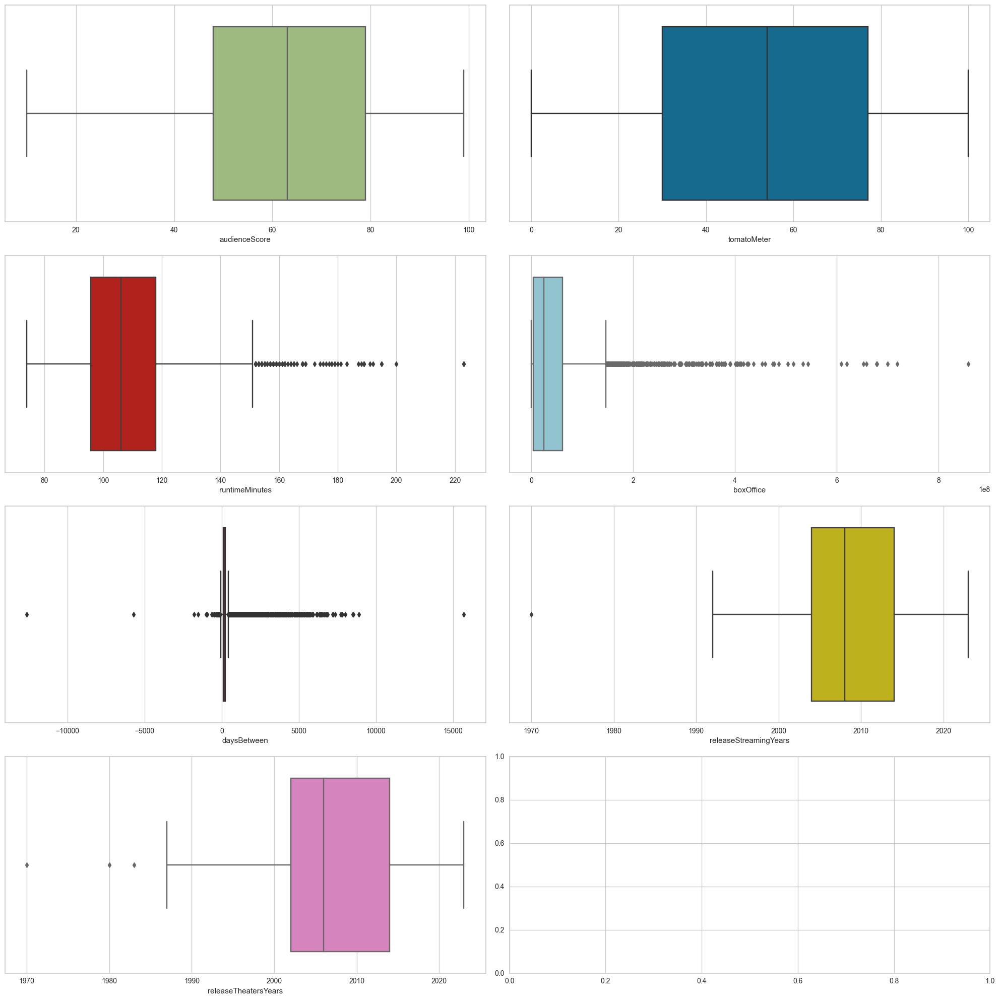

In [88]:
numerical_columns = ['audienceScore', 'tomatoMeter', 'runtimeMinutes', 'boxOffice', 'daysBetween','releaseStreamingYears','releaseTheatersYears']

colors = ['g', 'b', 'r', 'c', 'm', 'y', '#e377c2']
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(20,20))

for i, var in enumerate(numerical_columns):
    sns.boxplot(x=var, data=data, color=colors[i % len(colors)], ax=axs[i // 2, i % 2])

fig.tight_layout()
plt.show()

In [89]:
# Use describe() method to get summary statistics column
desc = data['audienceScore'].describe()

print(desc)

count    3104.000000
mean       62.331830
std        19.274182
min        10.000000
25%        48.000000
50%        63.000000
75%        79.000000
max        99.000000
Name: audienceScore, dtype: float64


In [90]:
# Compute summary statistics of column
audienceScore_stats = data['audienceScore'].describe()

# Get the lower and upper quartiles and the interquartile range (IQR)
Q1 = audienceScore_stats['25%']
Q3 = audienceScore_stats['75%']
IQR = Q3 - Q1

upper_whisker = Q3 + 1.5 * IQR

print("Upper whisker: ", upper_whisker)

Upper whisker:  125.5


Text(0.5, 1.0, 'Histogram of audience Score')

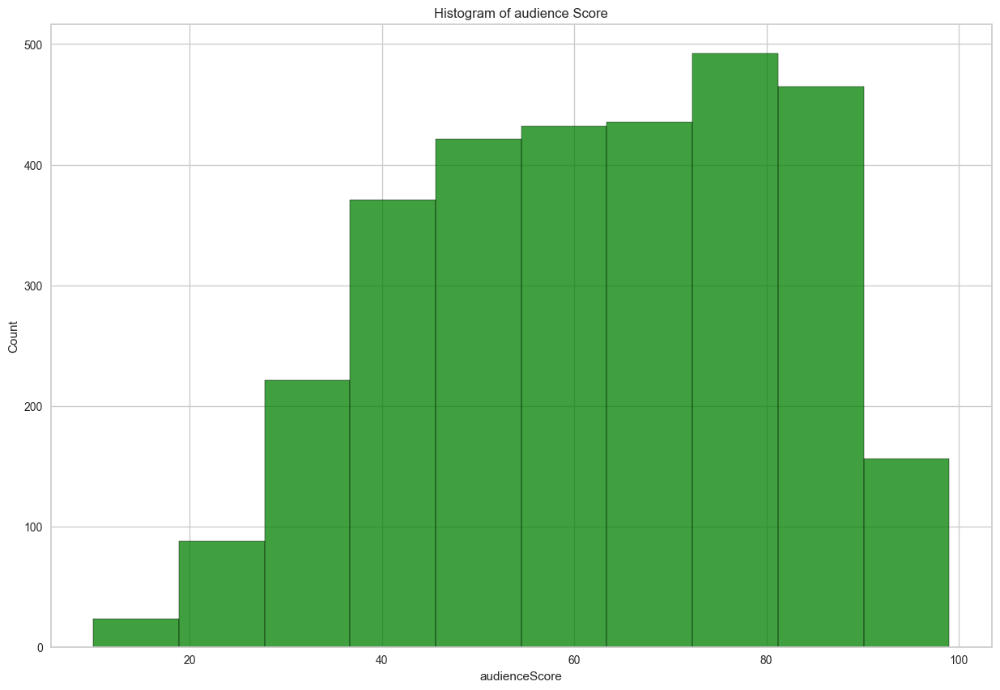

In [91]:
plt.figure(figsize=(15,10))
sns.histplot(data=data, x=data['audienceScore']
              , bins=10
             , palette='Greens', color='green')
plt.title('Histogram of audience Score')

<AxesSubplot: xlabel='audienceScore', ylabel='Density'>

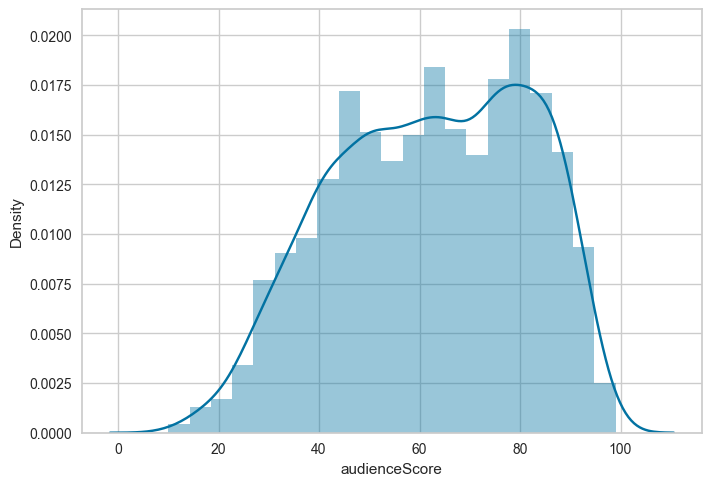

In [92]:
sns.distplot(data['audienceScore'])

In [93]:
desc = data['tomatoMeter'].describe()
print(desc)

count    3104.000000
mean       53.274162
std        27.202228
min         0.000000
25%        30.000000
50%        54.000000
75%        77.000000
max       100.000000
Name: tomatoMeter, dtype: float64


In [94]:
# Compute summary statistics of column
tomatoMeter_stats = data['tomatoMeter'].describe()

# Get the lower and upper quartiles and the interquartile range (IQR)
Q1 = tomatoMeter_stats['25%']
Q3 = tomatoMeter_stats['75%']
IQR = Q3 - Q1

upper_whisker = Q3 + 1.5 * IQR

print("Upper whisker: ", upper_whisker)

Upper whisker:  147.5


Text(0.5, 1.0, 'Histogram of tomato Meter')

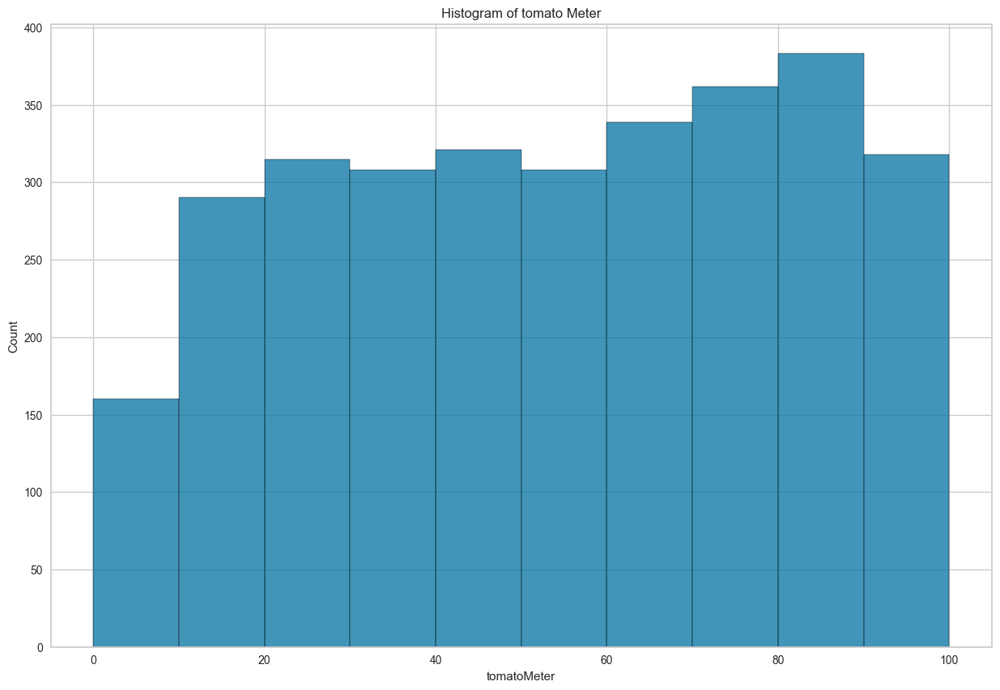

In [95]:
plt.figure(figsize=(15,10))
sns.histplot(data=data, x=data['tomatoMeter']
             , bins=10
             , palette='Blues')
plt.title('Histogram of tomato Meter')

<AxesSubplot: xlabel='tomatoMeter', ylabel='Density'>

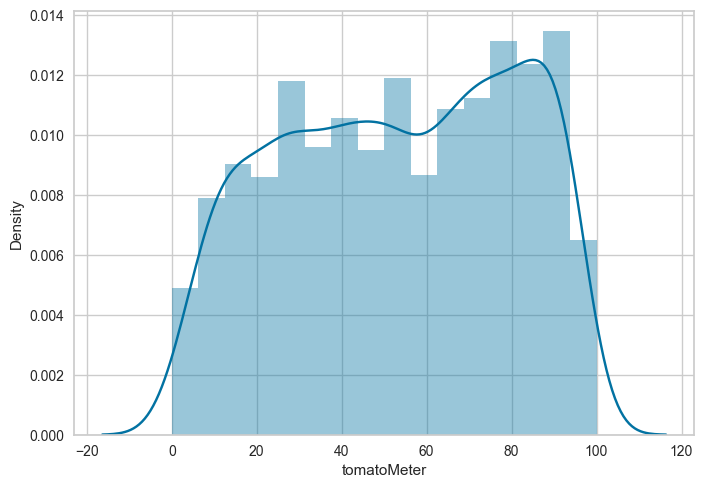

In [96]:
sns.distplot(data['tomatoMeter'])

In [97]:
desc = data['runtimeMinutes'].describe()
print(desc)

count    3104.000000
mean      108.897552
std        18.221640
min        74.000000
25%        95.750000
50%       106.000000
75%       118.000000
max       223.000000
Name: runtimeMinutes, dtype: float64


In [98]:
# Compute summary statistics of column
runtimeMinutes_stats = data['runtimeMinutes'].describe()

# Get the lower and upper quartiles and the interquartile range (IQR)
Q1 = runtimeMinutes_stats['25%']
Q3 = runtimeMinutes_stats['75%']
IQR = Q3 - Q1

upper_whisker = Q3 + 1.5 * IQR

print("Upper whisker: ", upper_whisker)

Upper whisker:  151.375


Text(0.5, 1.0, 'Histogram of run time Minutes')

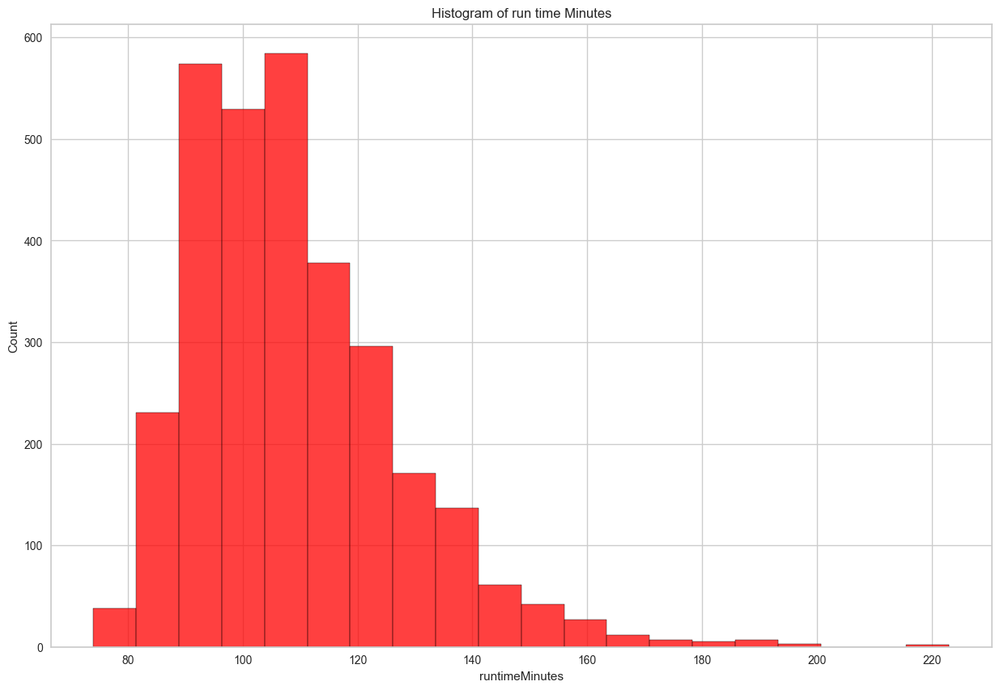

In [99]:
plt.figure(figsize=(15,10))
sns.histplot(data=data, x=data['runtimeMinutes']
             , bins=20
             , palette='Reds'
            ,color='red')
plt.title('Histogram of run time Minutes')

<AxesSubplot: xlabel='runtimeMinutes', ylabel='Density'>

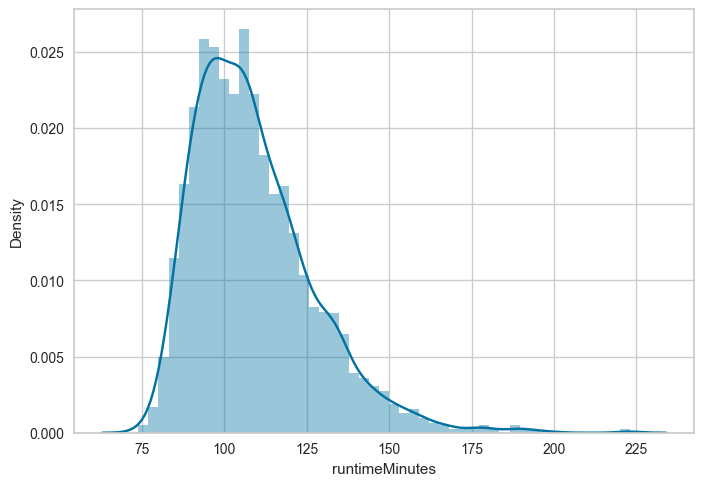

In [100]:
sns.distplot(data['runtimeMinutes'])

In [101]:
desc = data['boxOffice'].describe()
print(desc)

count    3.104000e+03
mean     5.111551e+07
std      7.948086e+07
min      0.000000e+00
25%      4.275000e+06
50%      2.425000e+07
75%      6.130000e+07
max      8.584000e+08
Name: boxOffice, dtype: float64


In [102]:
# Compute summary statistics of column
boxOffice_stats = data['boxOffice'].describe()

# Get the lower and upper quartiles and the interquartile range (IQR)
Q1 = boxOffice_stats['25%']
Q3 = boxOffice_stats['75%']
IQR = Q3 - Q1

upper_whisker = Q3 + 1.5 * IQR

print("Upper whisker: ", upper_whisker)

Upper whisker:  146837500.0


Text(0.5, 1.0, 'Histogram of box Office')

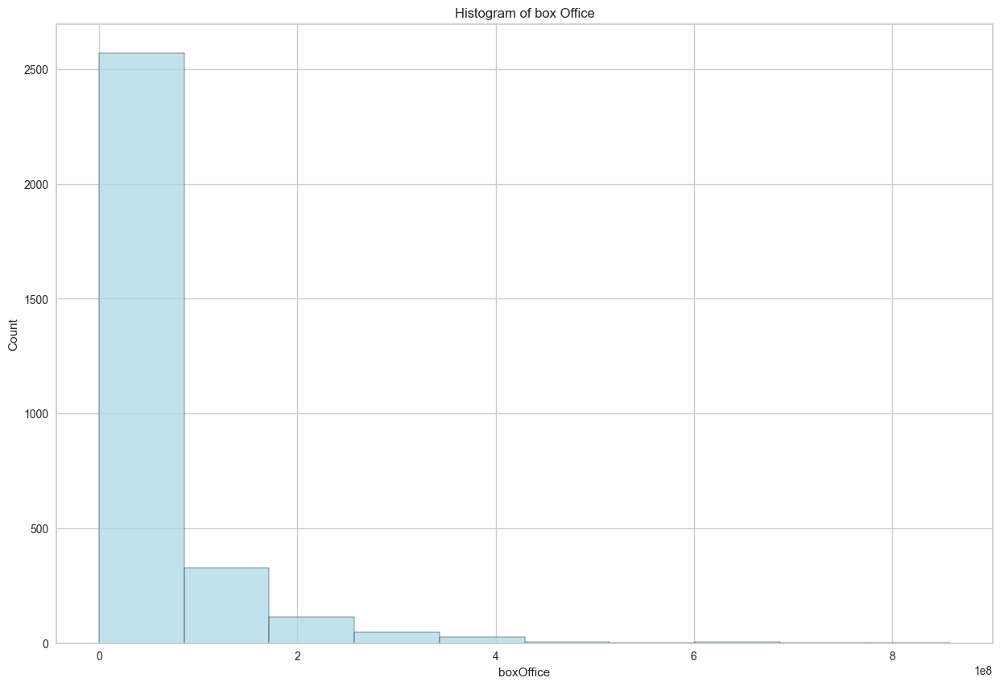

In [103]:
plt.figure(figsize=(15,10))
sns.histplot(data=data, x=data['boxOffice']
             , bins=10
             , palette='Purples'
            , color='lightblue')
plt.title('Histogram of box Office')

<AxesSubplot: xlabel='boxOffice', ylabel='Density'>

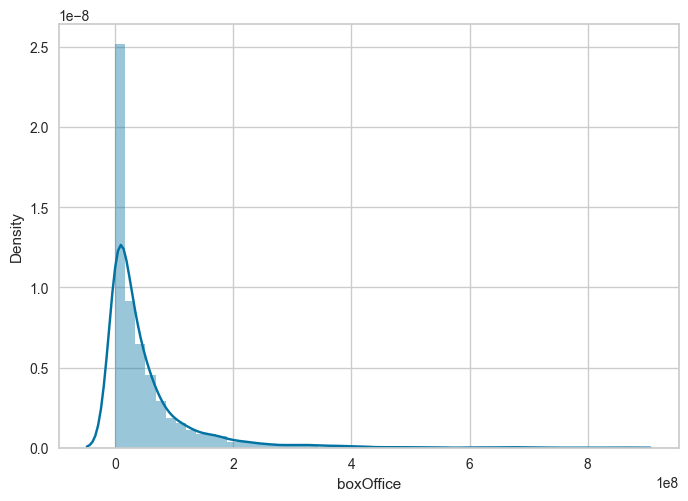

In [104]:
sns.distplot(data['boxOffice'])

In [105]:
desc = data['daysBetween'].describe()
print(desc)

count     3104.000000
mean       521.716817
std       1195.077679
min     -12619.000000
25%        102.000000
50%        130.000000
75%        228.000000
max      15689.000000
Name: daysBetween, dtype: float64


In [106]:
# Compute summary statistics of column
daysBetween_stats = data['daysBetween'].describe()

# Get the lower and upper quartiles and the interquartile range (IQR)
Q1 = daysBetween_stats['25%']
Q3 = daysBetween_stats['75%']
IQR = Q3 - Q1

lower_whisker = Q1 - 1.5 * IQR
upper_whisker = Q3 + 1.5 * IQR

print("Lower whisker: ", lower_whisker)
print("Upper whisker: ", upper_whisker)


Lower whisker:  -87.0
Upper whisker:  417.0


Text(0.5, 1.0, 'Histogram of daysBetween')

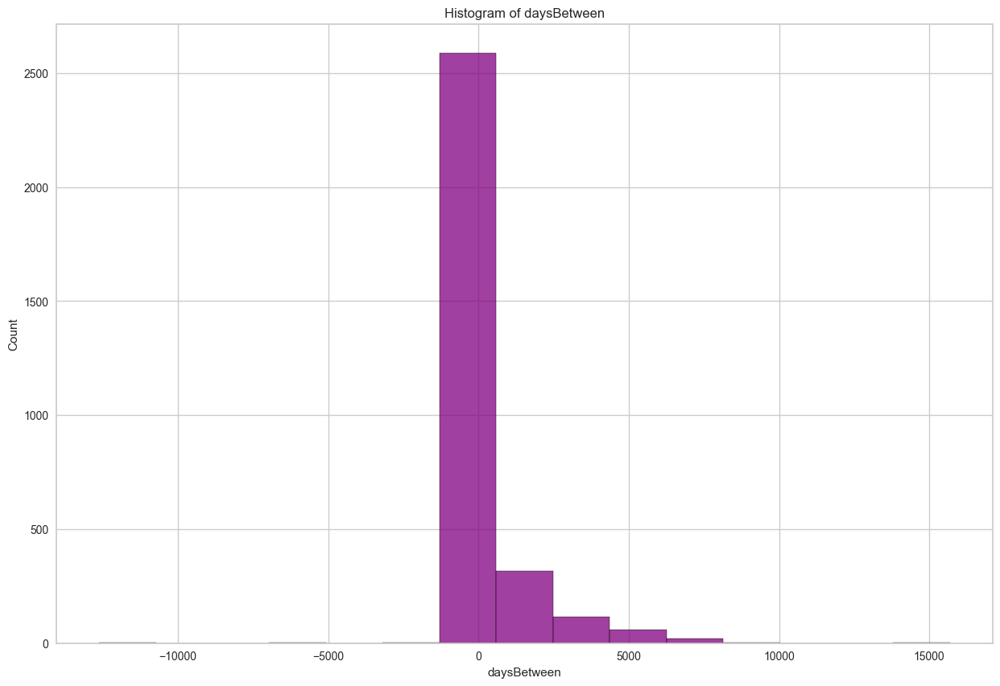

In [107]:
plt.figure(figsize=(15,10))
sns.histplot(data=data, x=data['daysBetween']
             , bins=15
             , palette='Purples'
            ,color='purple')
plt.title('Histogram of daysBetween')

<AxesSubplot: xlabel='daysBetween', ylabel='Density'>

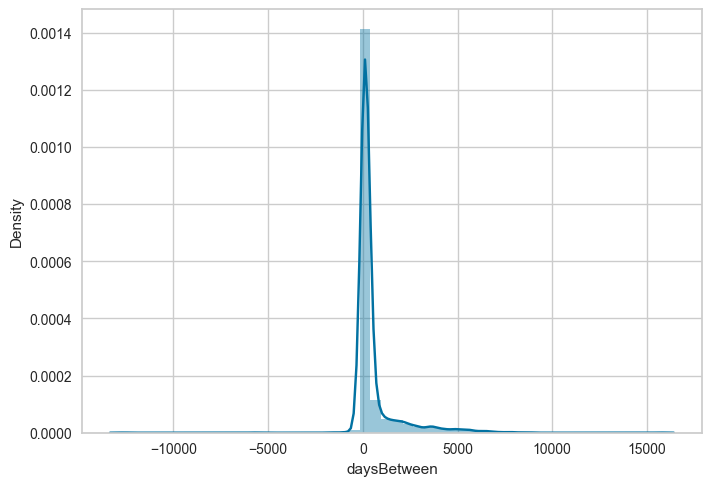

In [108]:
sns.distplot(data['daysBetween'])

In [109]:
desc = data['releaseStreamingYears'].describe()
print(desc)

count    3104.000000
mean     2009.228415
std         6.156228
min      1970.000000
25%      2004.000000
50%      2008.000000
75%      2014.000000
max      2023.000000
Name: releaseStreamingYears, dtype: float64


In [110]:
# Compute summary statistics of column
releaseStreamingYears_stats = data['releaseStreamingYears'].describe()

# Get the lower and upper quartiles and the interquartile range (IQR)
Q1 = releaseStreamingYears_stats['25%']
Q3 = releaseStreamingYears_stats['75%']
IQR = Q3 - Q1

lower_whisker = Q1 - 1.5 * IQR
upper_whisker = Q3 + 1.5 * IQR

print("Lower whisker: ", lower_whisker)
print("Upper whisker: ", upper_whisker)

Lower whisker:  1989.0
Upper whisker:  2029.0


Text(0.5, 1.0, 'Histogram of release Streaming Years')

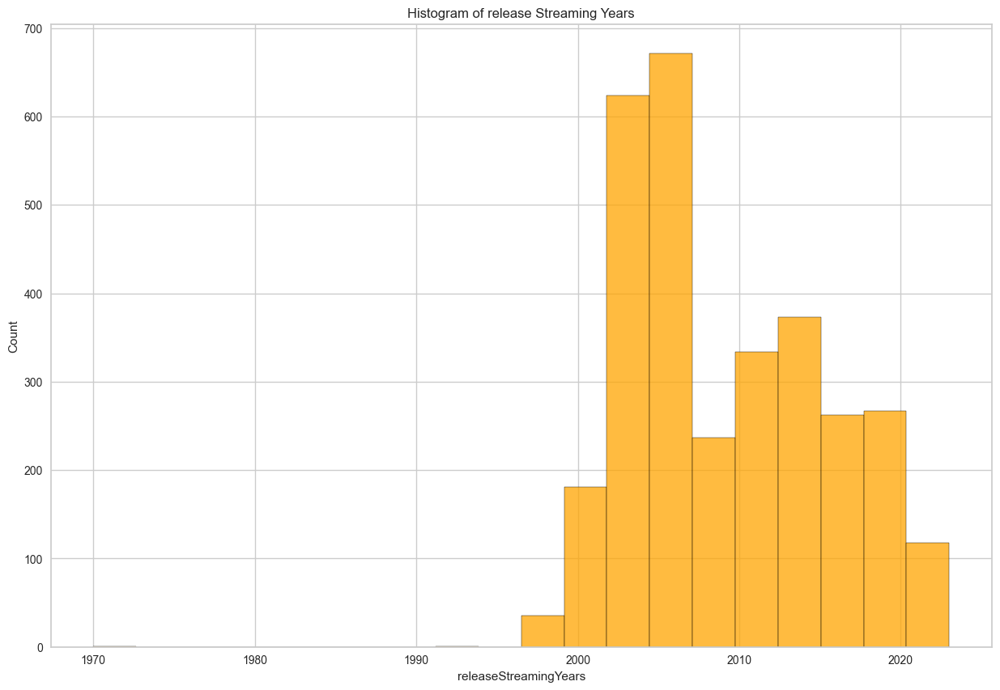

In [111]:
plt.figure(figsize=(15,10))
sns.histplot(data=data, x=data['releaseStreamingYears']
             , bins=20
            ,color='orange')
plt.title('Histogram of release Streaming Years')

<AxesSubplot: xlabel='releaseStreamingYears', ylabel='Density'>

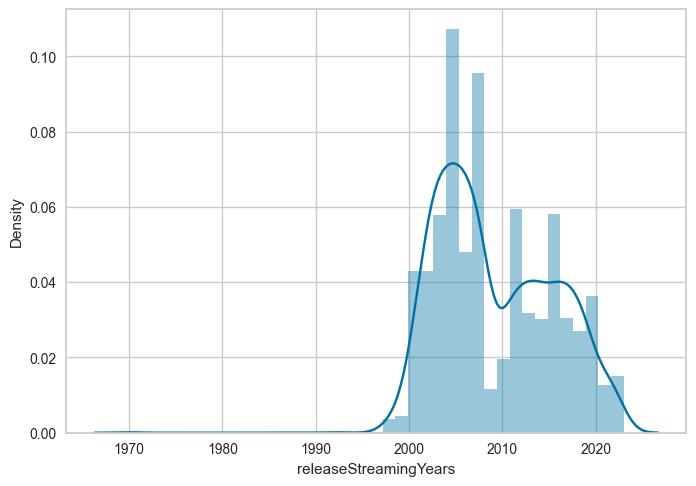

In [112]:
sns.distplot(data['releaseStreamingYears'])

In [113]:
desc = data['releaseTheatersYears'].describe()
print(desc)

count    3104.000000
mean     2007.773196
std         6.942523
min      1970.000000
25%      2002.000000
50%      2006.000000
75%      2014.000000
max      2023.000000
Name: releaseTheatersYears, dtype: float64


In [114]:
# Compute summary statistics of column
releaseTheatersYears_stats = data['releaseTheatersYears'].describe()

# Get the lower and upper quartiles and the interquartile range (IQR)
Q1 = releaseTheatersYears_stats['25%']
Q3 = releaseTheatersYears_stats['75%']
IQR = Q3 - Q1

lower_whisker = Q1 - 1.5 * IQR
upper_whisker = Q3 + 1.5 * IQR

print("Lower whisker: ", lower_whisker)
print("Upper whisker: ", upper_whisker)

Lower whisker:  1984.0
Upper whisker:  2032.0


Text(0.5, 1.0, 'Histogram of release Theaters Years')

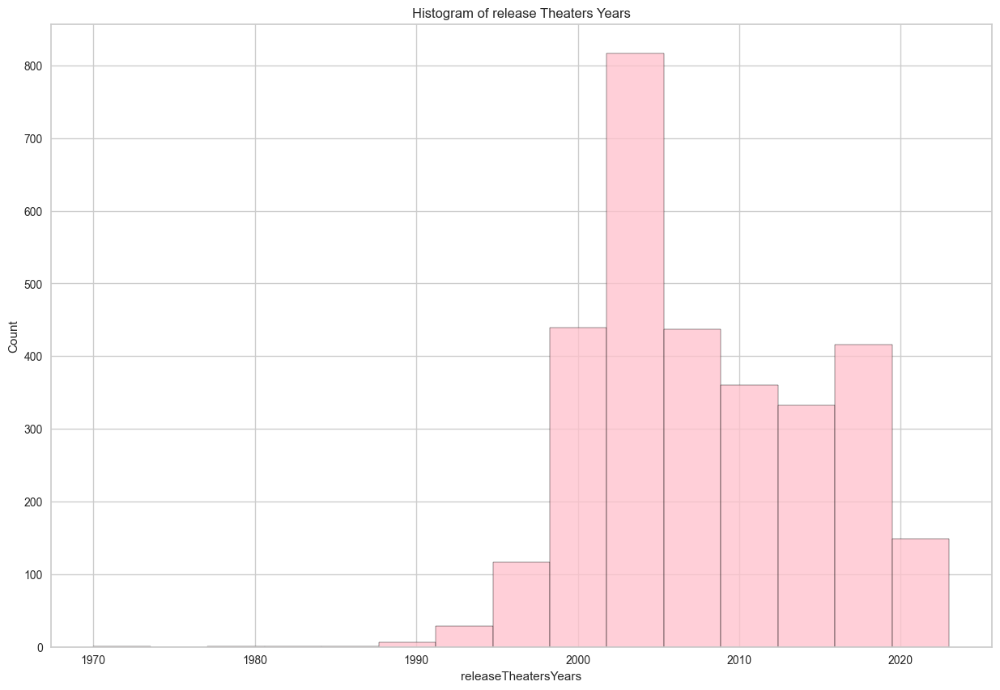

In [115]:
plt.figure(figsize=(15,10))
sns.histplot(data=data, x=data['releaseTheatersYears']
             , bins=15
            ,color='pink')
plt.title('Histogram of release Theaters Years')

<AxesSubplot: xlabel='releaseTheatersYears', ylabel='Density'>

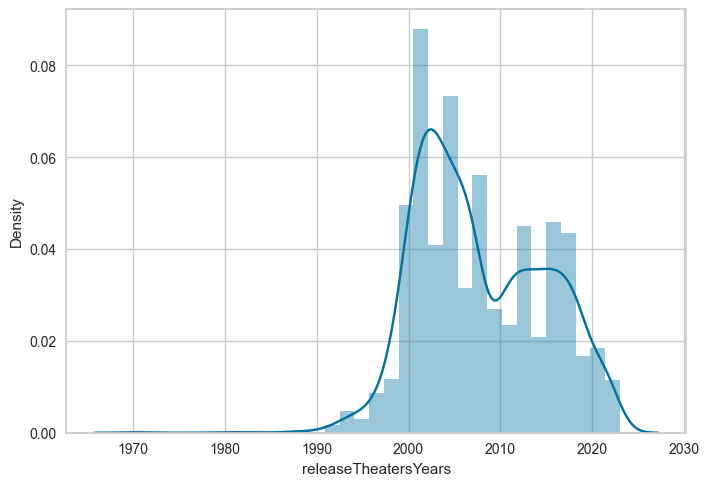

In [116]:
sns.distplot(data['releaseTheatersYears'])

In [117]:
numerical_columns = ['audienceScore', 'tomatoMeter', 'runtimeMinutes', 'boxOffice', 'daysBetween','releaseStreamingYears','releaseTheatersYears']
correlation_matrix = data[numerical_columns].corr()

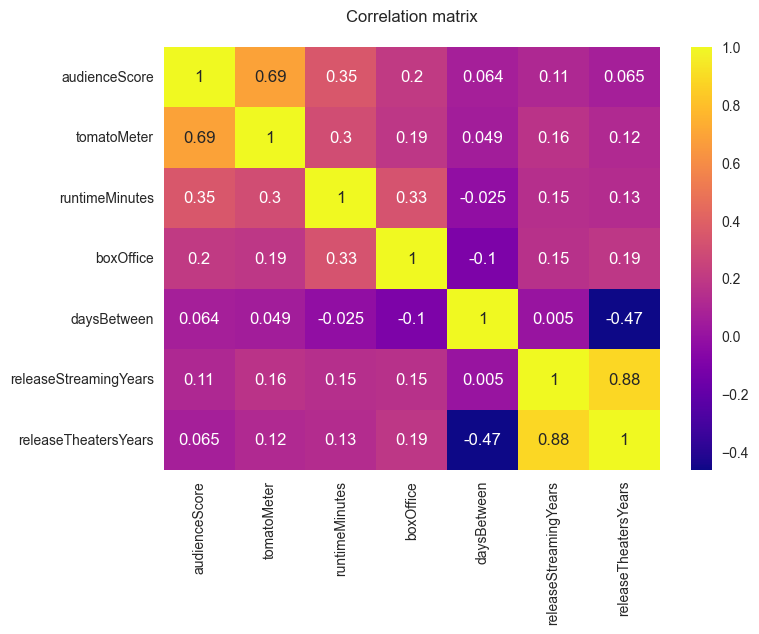

In [118]:
sns.heatmap(correlation_matrix, annot=True, cmap='plasma')
plt.title("Correlation matrix\n")
plt.show()

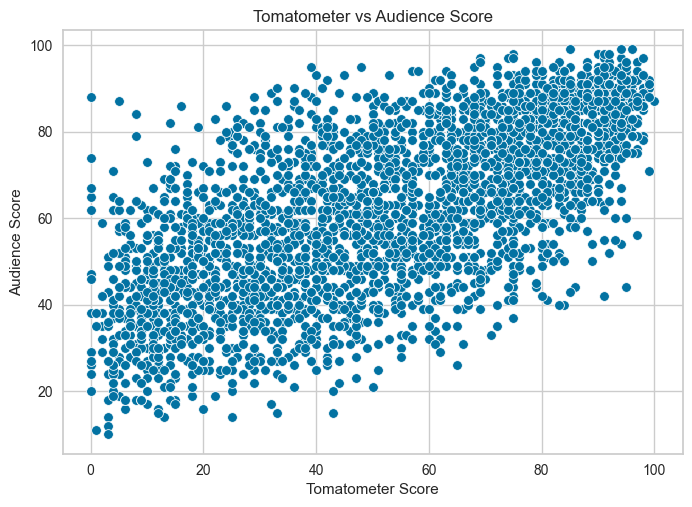

In [119]:
sns.scatterplot(data=data, x='tomatoMeter', y='audienceScore')

plt.title('Tomatometer vs Audience Score')
plt.xlabel('Tomatometer Score')
plt.ylabel('Audience Score')

plt.show()

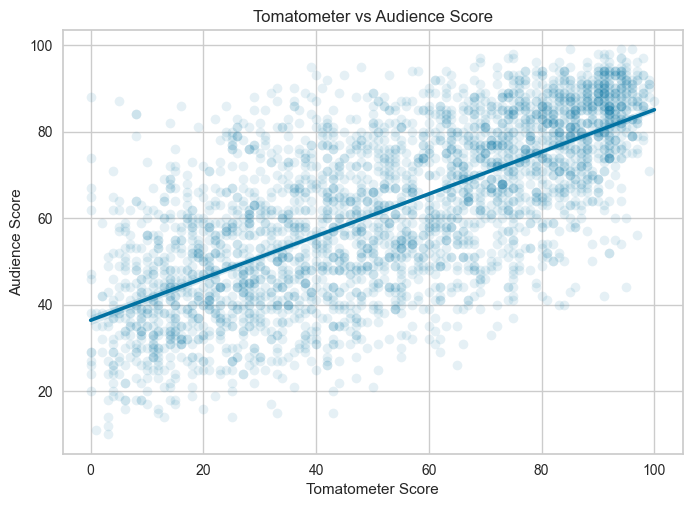

In [120]:
#regplot function, creates a scatterplot and fits a linear regression model to the data (alpha-transparency of the scatterplot points). 

sns.regplot(data=data, x='tomatoMeter', y='audienceScore', scatter_kws={'alpha': 0.1})

plt.title('Tomatometer vs Audience Score')
plt.xlabel('Tomatometer Score')
plt.ylabel('Audience Score')

plt.show()

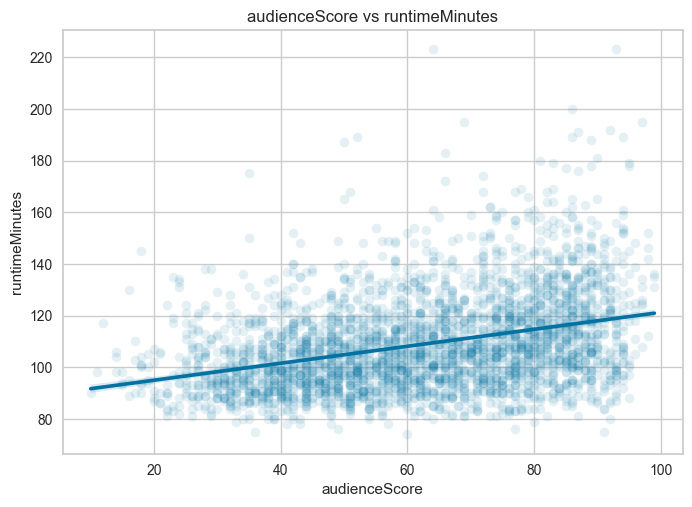

In [121]:
sns.regplot(data=data, x='audienceScore', y='runtimeMinutes', scatter_kws={'alpha': 0.1})

plt.title('audienceScore vs runtimeMinutes')
plt.xlabel('audienceScore')
plt.ylabel('runtimeMinutes')

plt.show()

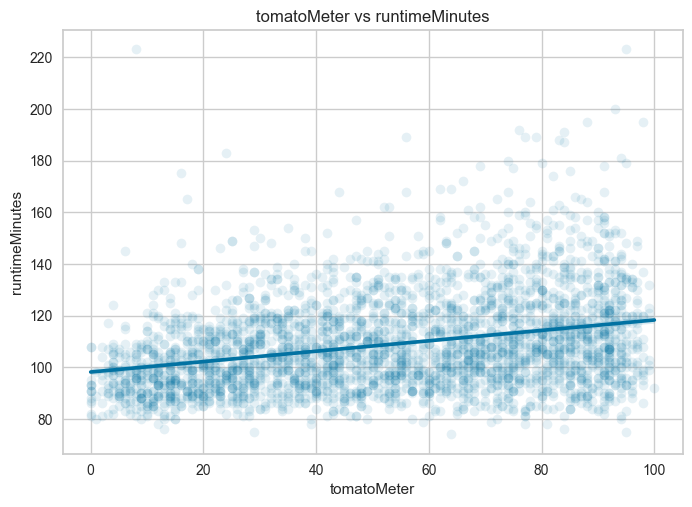

In [122]:
sns.regplot(data=data, x='tomatoMeter', y='runtimeMinutes', scatter_kws={'alpha': 0.1})

plt.title('tomatoMeter vs runtimeMinutes')
plt.xlabel('tomatoMeter')
plt.ylabel('runtimeMinutes')

plt.show()

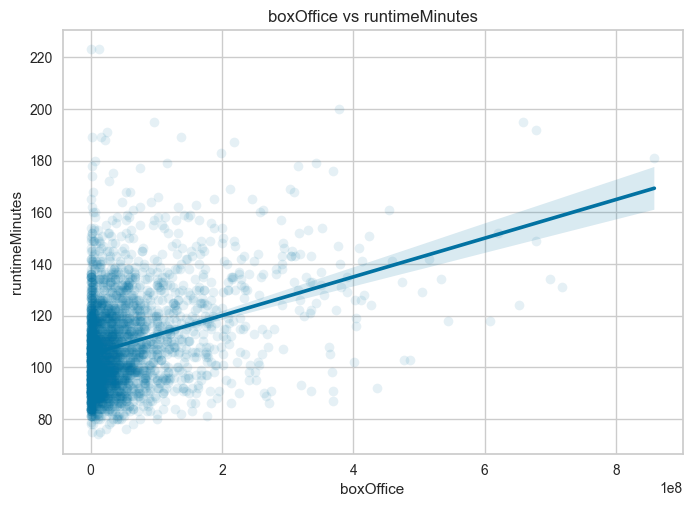

In [123]:
sns.regplot(data=data, x='boxOffice', y='runtimeMinutes', scatter_kws={'alpha': 0.1})

plt.title('boxOffice vs runtimeMinutes')
plt.xlabel('boxOffice')
plt.ylabel('runtimeMinutes')

plt.show()

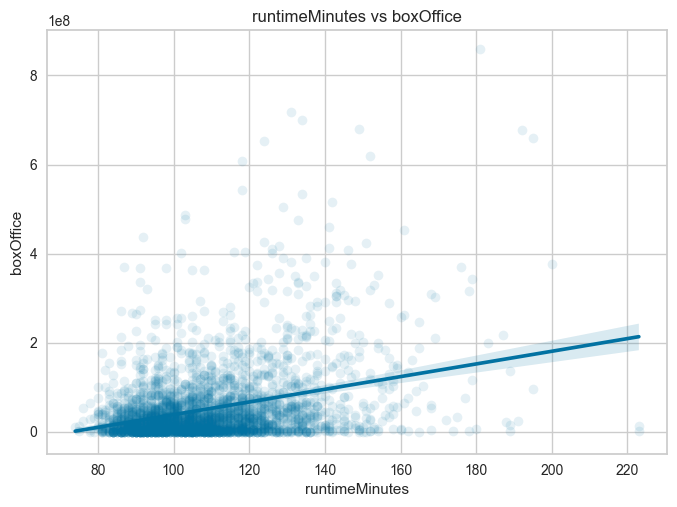

In [124]:
sns.regplot(data=data, x='runtimeMinutes', y='boxOffice', scatter_kws={'alpha': 0.1})

plt.title('runtimeMinutes vs boxOffice')
plt.xlabel('runtimeMinutes')
plt.ylabel('boxOffice')

plt.show()

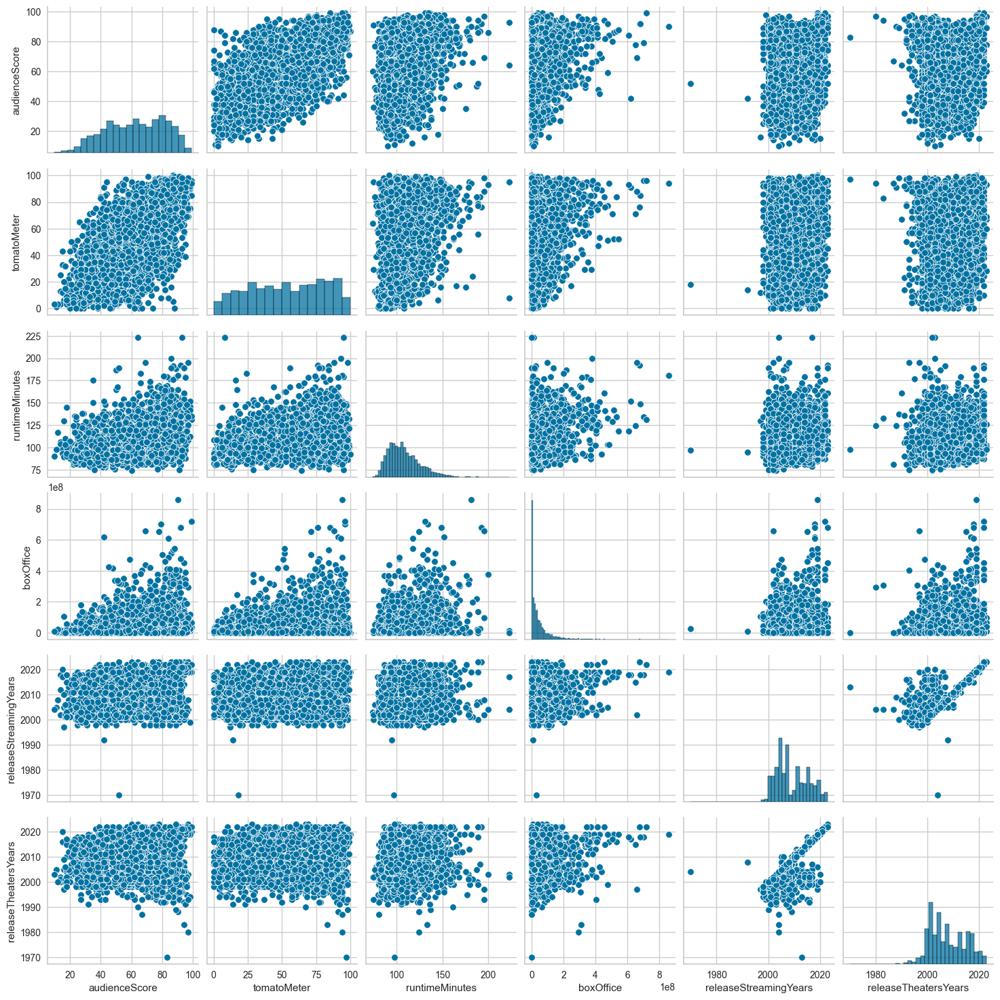

In [125]:
To_Plot = ["audienceScore", "tomatoMeter", "runtimeMinutes", "boxOffice",'releaseStreamingYears','releaseTheatersYears']

sns.pairplot(data[To_Plot])
plt.show()

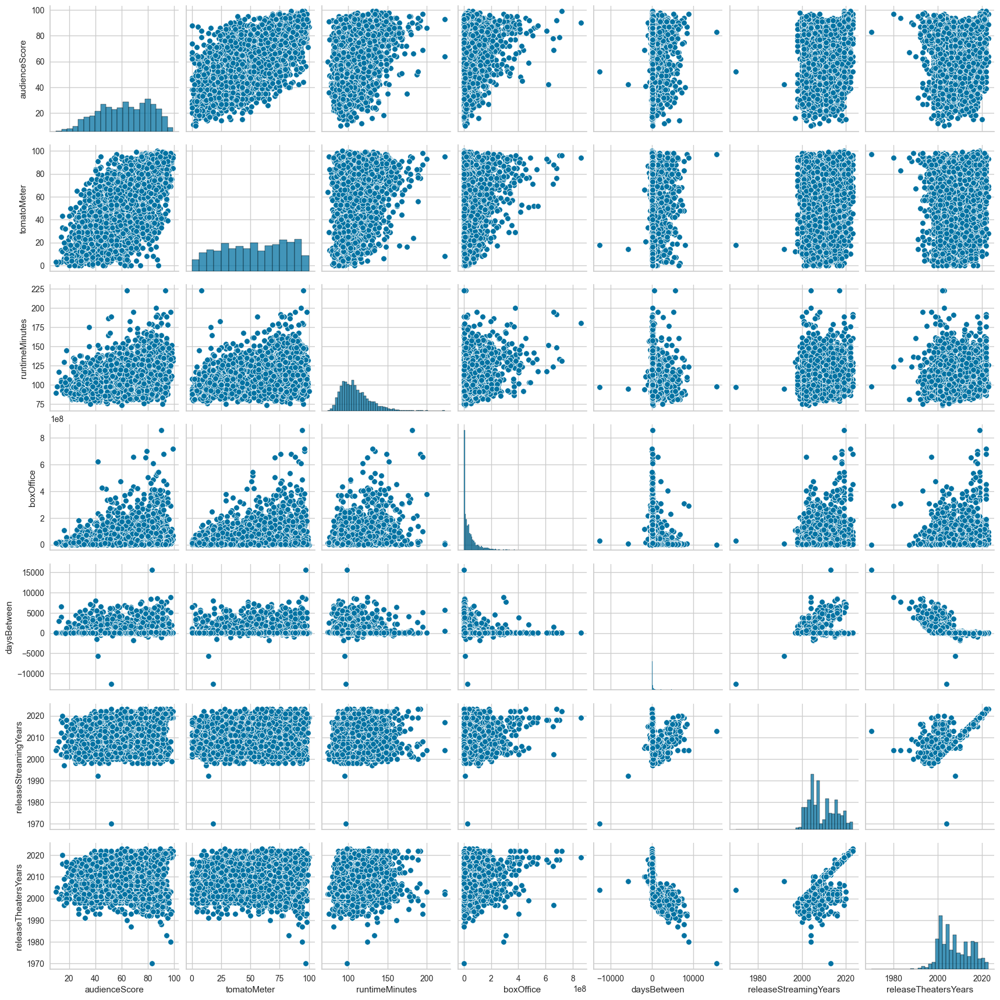

In [126]:
sns.pairplot(data)

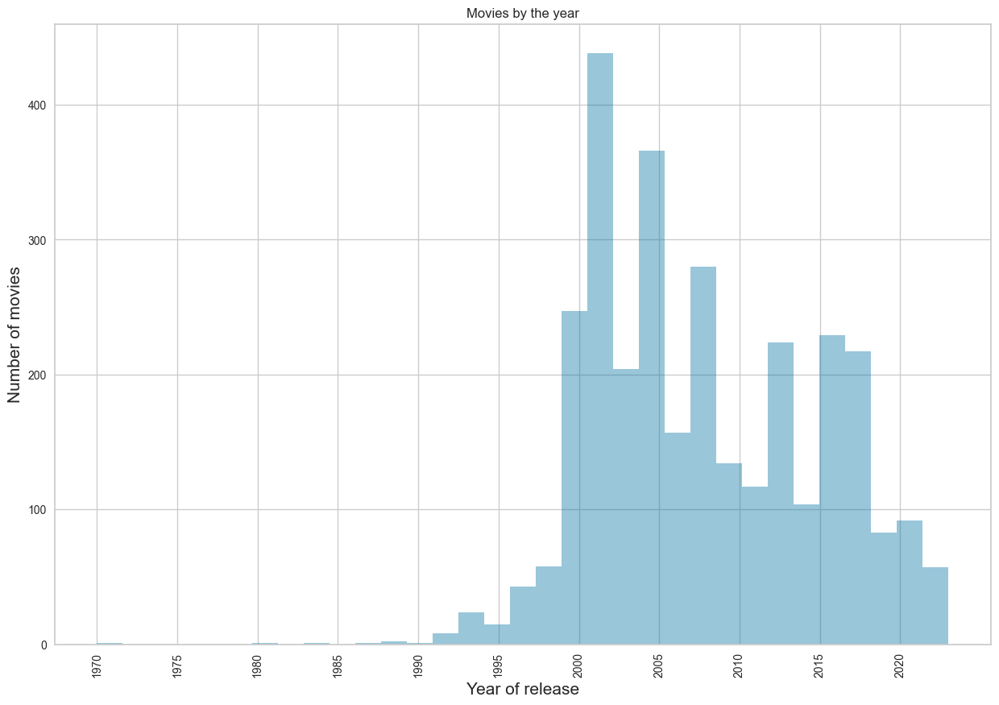

In [127]:
df['releaseDateTheaters'] = pd.to_datetime(df['releaseDateTheaters'])
df['year'] = df['releaseDateTheaters'].apply(lambda x: x.year)

plt.figure(figsize=(15,10))

plt.title('Movies by the year')
sns.distplot(df.year, kde=False)
plt.ylabel('Number of movies', size=15)
plt.xlabel('Year of release',size=15)

plt.xticks(np.arange(1970, 2023, step=5),rotation=90)
plt.show()

In [128]:
# oldest and newest release dates
#oldest_release = pd.to_datetime(data['releaseStreamingYears'].min(), format='%Y')
#newest_release = pd.to_datetime(data['releaseStreamingYears'].max(), format='%Y')

data['releaseStreamingYears'] = pd.to_datetime(data['releaseStreamingYears'], format='%Y')
oldest_release = data['releaseStreamingYears'].min()
newest_release = data['releaseStreamingYears'].max()

# Format the dates without time
oldest_release_str = oldest_release.strftime("%Y")
newest_release_str = newest_release.strftime("%Y")

print(f"Oldest movie release date (Streaming):\n",oldest_release_str)
print(f"Newest movie release date (Streaming):\n",newest_release_str)

Oldest movie release date (Streaming):
 1970
Newest movie release date (Streaming):
 2023


In [129]:
# Filter the DataFrame to only include the rows with the oldest and newest release dates
oldest_movie = data[data['releaseStreamingYears'] == oldest_release]['title'].iloc[0]
newest_movie = data[data['releaseStreamingYears'] == newest_release]['title'].iloc[0]

print(f"Oldest movie release  (Streaming):\n{oldest_release_str} ({oldest_movie})")
print(f"Newest movie release  (Streaming):\n{newest_release_str} ({newest_movie})")

Oldest movie release  (Streaming):
1970 (After the Sunset)
Newest movie release  (Streaming):
2023 (The Menu)


In [130]:
data['releaseTheatersYears'] = pd.to_datetime(data['releaseTheatersYears'], format='%Y')
oldest_release = data['releaseTheatersYears'].min()
newest_release = data['releaseTheatersYears'].max()

# Format the dates without time
oldest_release_str = oldest_release.strftime("%Y")
newest_release_str = newest_release.strftime("%Y")

print(f"Oldest movie release date (Theaters):\n",oldest_release_str)
print(f"Newest movie release date (Theaters):\n",newest_release_str)

Oldest movie release date (Theaters):
 1970
Newest movie release date (Theaters):
 2023


In [131]:
# Filter the DataFrame to only include the rows with the oldest and newest release dates
oldest_movie = data[data['releaseTheatersYears'] == oldest_release]['title'].iloc[0]
newest_movie = data[data['releaseTheatersYears'] == newest_release]['title'].iloc[0]

print(f"Oldest movie release (Theaters):\n{oldest_release_str} ({oldest_movie})")
print(f"Newest movie release (Theaters):\n{newest_release_str} ({newest_movie})")

Oldest movie release (Theaters):
1970 (Tristana)
Newest movie release (Theaters):
2023 (Knock at the Cabin)


In [132]:
max_aud_idx = data['audienceScore'].idxmax()
min_aud_score_idx = data['audienceScore'].idxmin()

# Get the maximum and minimum audienceScore values and the corresponding movie titles
max_aud_score = data.loc[max_aud_idx, 'audienceScore']
max_aud_score_title = data.loc[max_aud_idx, 'title']

min_aud_score = data.loc[min_aud_score_idx, 'audienceScore']
min_aud_score_title = data.loc[min_aud_score_idx, 'title']

print(f"Maximum Audience Score:\t {max_aud_score} \t {max_aud_score_title}\n")
print(f"Minimum Audience Score:\t {min_aud_score} \t {min_aud_score_title}")

Maximum Audience Score:	 99.0 	 Just Mercy

Minimum Audience Score:	 10.0 	 House of the Dead


In [133]:
avg_audienceScore = data['audienceScore'].mean()

print(f"Audience Score average:\t {avg_audienceScore:.2f}\n")

Audience Score average:	 62.33



In [134]:
max_tom_idx = data['tomatoMeter'].idxmax()
min_tom_score_idx = data['tomatoMeter'].idxmin()

# Get the maximum and minimum audienceScore values and the corresponding movie titles
max_tom_score = data.loc[max_tom_idx, 'tomatoMeter']
max_tom_score_title = data.loc[max_tom_idx, 'title']

min_tom_score = data.loc[min_tom_score_idx, 'tomatoMeter']
min_tom_score_title = data.loc[min_tom_score_idx, 'title']

print(f"Maximum Tomatometer Score:\t {max_tom_score} \t {max_tom_score_title}\n")
print(f"Minimum Tomatometer Score:\t {min_tom_score} \t {min_tom_score_title}")

Maximum Tomatometer Score:	 100.0 	 Charlotte Has Fun

Minimum Tomatometer Score:	 0.0 	 Ballistic: Ecks vs. Sever


In [135]:
# average
avg_tomatoMeter = data['tomatoMeter'].mean()

print(f"Tomato Meter Score average:\t {avg_tomatoMeter:.2f}\n")

Tomato Meter Score average:	 53.27



In [136]:
# Calculate a combined score 
data['averageScore'] = (data['audienceScore'] + data['tomatoMeter']) / 2

# combined score in descending order
data_sorted = data.sort_values(by='averageScore', ascending=False)

# Get the top 5 movies
top_5_movies = data_sorted.head(5)

print(top_5_movies[['title', 'audienceScore', 'tomatoMeter', 'averageScore']])

                    title  audienceScore  tomatoMeter  averageScore
1523    Top Gun: Maverick           99.0         96.0          97.5
2632     Schindler's List           97.0         98.0          97.5
1163        Spirited Away           96.0         97.0          96.5
2319       The Woman King           99.0         94.0          96.5
2583  All About My Mother           93.0         98.0          95.5


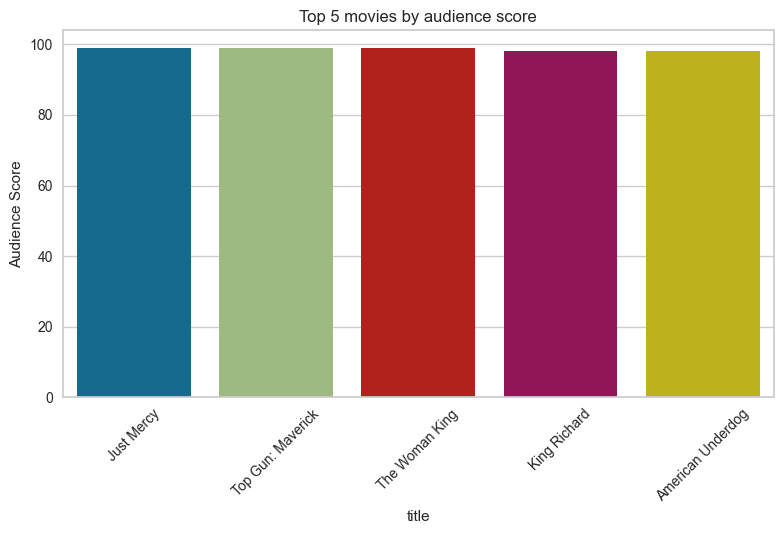

In [137]:
top5_audience = data.nlargest(5, 'audienceScore')[['title', 'audienceScore']]

sns.barplot(x='title', y='audienceScore', data=top5_audience)

plt.title('Top 5 movies by audience score')
#plt.xlabel('Title')
plt.ylabel('Audience Score')

plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [138]:
# top 5 movies by audience score
top5_audience = data.nlargest(5, 'audienceScore')[['title', 'audienceScore']]

# percentage of total counts
counts = top5_audience['title'].value_counts()
movie_perc = (counts / counts.sum()) * 100

print(top5_audience)

                  title  audienceScore
622          Just Mercy           99.0
1523  Top Gun: Maverick           99.0
2319     The Woman King           99.0
279        King Richard           98.0
924   American Underdog           98.0


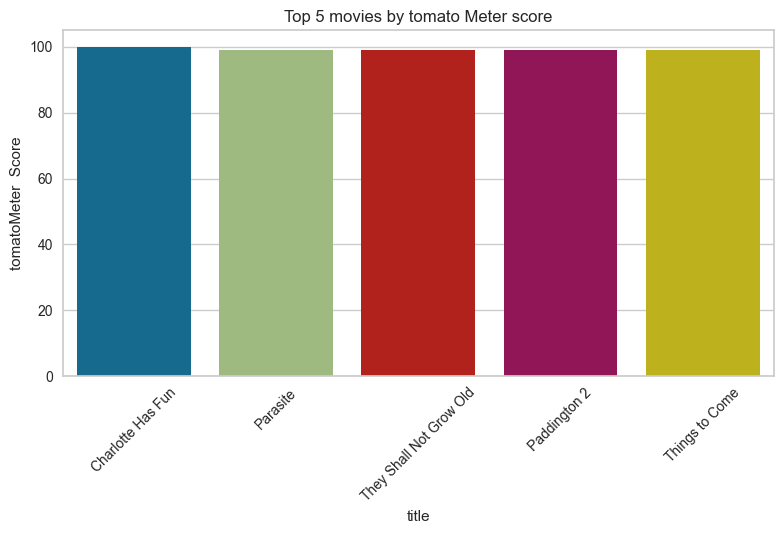

In [139]:
top5_tomatoMeter = data.nlargest(5, 'tomatoMeter')[['title', 'tomatoMeter']]

sns.barplot(x='title', y='tomatoMeter', data=top5_tomatoMeter)

plt.title('Top 5 movies by tomato Meter score')
#plt.xlabel('Title')
plt.ylabel('tomatoMeter  Score')

plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [140]:
#top 5 movies by tomatoMeter
top5_tomatoMeter = data.nlargest(5, 'tomatoMeter')[['title', 'tomatoMeter']]

counts = top5_tomatoMeter ['title'].value_counts()
movie_perc = (counts / counts.sum()) * 100

print(top5_tomatoMeter)

                        title  tomatoMeter
1712        Charlotte Has Fun        100.0
1063                 Parasite         99.0
1984  They Shall Not Grow Old         99.0
2078             Paddington 2         99.0
2342           Things to Come         99.0


In [141]:
# maximum and minimum runtimeMinutes
max_minutes_idx = data['runtimeMinutes'].idxmax()
min_minutes_score_idx = data['runtimeMinutes'].idxmin()

max_minutes_score = data.loc[max_minutes_idx, 'runtimeMinutes']
max_minutes_score_title = data.loc[max_minutes_idx, 'title']

min_minutes_score = data.loc[min_minutes_score_idx, 'runtimeMinutes']
min_minutes_score_title = data.loc[min_minutes_score_idx, 'title']

print(f"Maximum run time minutes:\t {max_minutes_score} \t {max_minutes_score_title}\n")
print(f"Minimum run time minutes:\t {min_minutes_score} \t {min_minutes_score_title}")

Maximum run time minutes:	 223.0 	 Gods and Generals

Minimum run time minutes:	 74.0 	 The Powerpuff Girls Movie


In [142]:
# average
avg_minutes_score = data['runtimeMinutes'].mean()

print(f"Average run time minutes:\t {avg_minutes_score:.2f}\n")

Average run time minutes:	 108.90



In [143]:
#top 5 movies by box office
top5_boxOffice = data.nlargest(5, 'boxOffice')[['title', 'boxOffice']]

counts = top5_boxOffice ['title'].value_counts()
movie_perc = (counts / counts.sum()) * 100

print(top5_boxOffice)

                         title    boxOffice
2309         Avengers: Endgame  858400000.0
1523         Top Gun: Maverick  718500000.0
851              Black Panther  700200000.0
2226    Avengers: Infinity War  678800000.0
1800  Avatar: The Way of Water  678300000.0


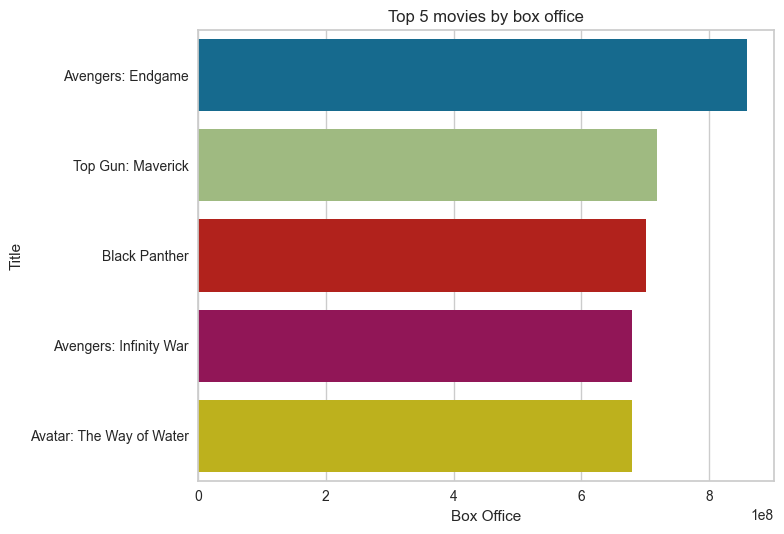

In [144]:
# top 5 movies by box office
top5_boxOffice = data.nlargest(5, 'boxOffice')[['title', 'boxOffice']]

# vertical bar plot showing the top 5 movies
sns.barplot(x='boxOffice', y='title', data=top5_boxOffice)

plt.title('Top 5 movies by box office')
plt.xlabel('Box Office')
plt.ylabel('Title')

#plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [145]:
max_boxOffice = df['boxOffice'].max()
print(max_boxOffice)

max_index = df['boxOffice'].idxmax()
max_row = df.loc[max_index]
print(max_row)

858400000.0
title                                                    Avengers: Endgame
audienceScore                                                         90.0
tomatoMeter                                                           94.0
rating                                                               PG-13
ratingContents           ['Sequences of Sci-Fi Violence', 'Action', 'So...
releaseDateTheaters                                    2019-04-26 00:00:00
releaseDateStreaming                                            2019-07-30
runtimeMinutes                                                       181.0
genre                                 [Action, Adventure, Fantasy, Sci-fi]
originalLanguage                                                   English
director                                        [Anthony Russo, Joe Russo]
writer                               [Christopher Markus, Stephen McFeely]
boxOffice                                                      858400000.0
distributor  

In [146]:
# maximum and minimum boxOffice
max_box_idx = data['boxOffice'].idxmax()
min_box_score_idx = data['boxOffice'].idxmin()

max_box_score = data.loc[max_box_idx, 'boxOffice']
max_box_score_title = data.loc[max_box_idx, 'title']

min_box_score = data.loc[min_box_score_idx, 'boxOffice']
min_box_score_title = data.loc[min_box_score_idx, 'title']

print(f"Maximum box Office:\t {max_box_score} \t {max_box_score_title}\n")
print(f"Minimum box Office:\t {min_box_score} \t {min_box_score_title}")


Maximum box Office:	 858400000.0 	 Avengers: Endgame

Minimum box Office:	 0.0 	 Mulholland Dr.


In [147]:
avg_boxOffice = data['boxOffice'].mean()

print(f"Average box Office:\t {avg_boxOffice:.2f}\n")

Average box Office:	 51115509.09



English: 93.23%
French (Canada): 0.74%
Chinese: 0.71%
French (France): 0.64%
English (United Kingdom): 0.48%
Spanish (Spain): 0.48%
Japanese: 0.45%
German: 0.35%
Spanish: 0.32%
Korean: 0.23%
Italian: 0.23%
Swedish: 0.19%
Czech: 0.19%
Portuguese (Brazil): 0.19%
Hindi: 0.19%
Norwegian: 0.16%
Arabic: 0.13%
Dutch: 0.13%
Danish: 0.13%
English (Australia): 0.10%
Thai: 0.10%
Finnish: 0.06%
Icelandic: 0.06%
Persian: 0.06%
Romanian: 0.03%
Polish: 0.03%
Unknown language: 0.03%
Turkish: 0.03%
Tamil: 0.03%
Catalan: 0.03%
Russian: 0.03%
Vietnamese: 0.03%
Inuktitut: 0.03%
Hebrew: 0.03%
Hungarian: 0.03%
Afrikaans: 0.03%
Bosnian: 0.03%


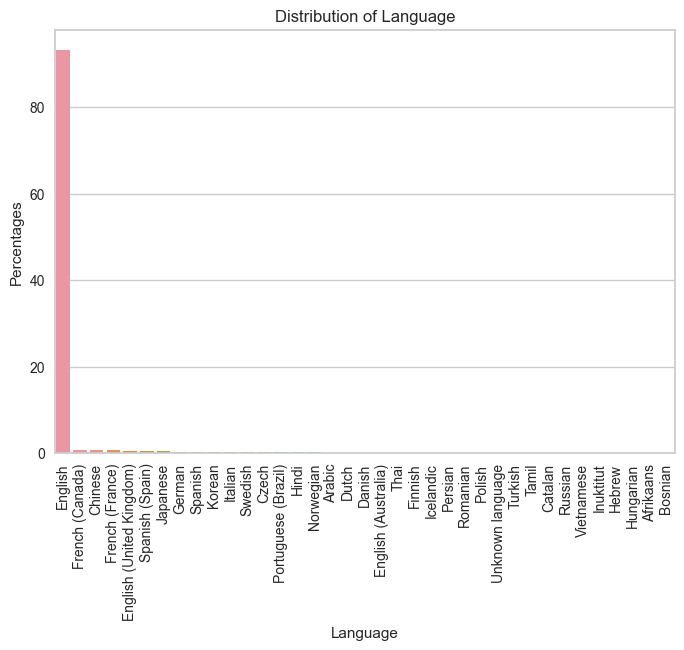

In [148]:
counts = data['originalLanguage'].value_counts()

percentage = (counts / counts.sum()) * 100

for language, language_perc in percentage.items():
    print(f"{language}: {language_perc:.2f}%")
    
sns.barplot(x=percentage.index, y=percentage.values)

plt.title('Distribution of Language')
plt.xlabel('Language')
plt.ylabel('Percentages')

plt.xticks(rotation=90) 
plt.show()


In [149]:
top5_language = data['originalLanguage'].value_counts().head(5)
print(top5_language)

originalLanguage
English                     2894
French (Canada)               23
Chinese                       22
French (France)               20
English (United Kingdom)      15
Name: count, dtype: int64


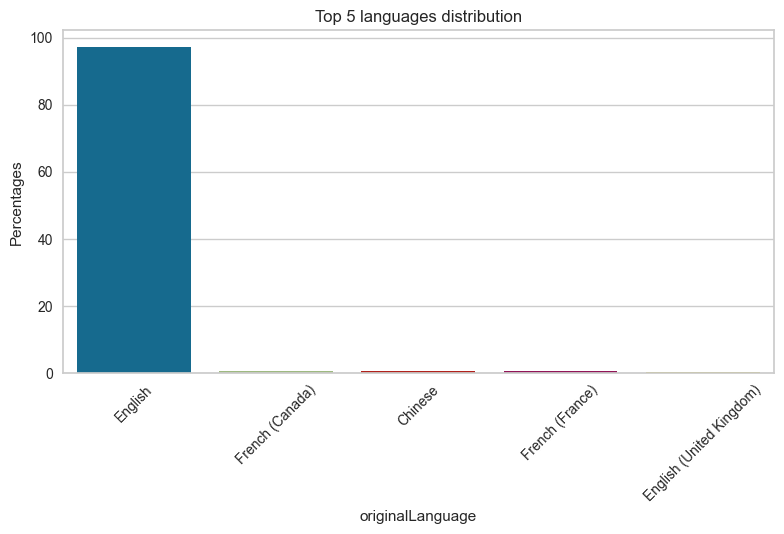

In [150]:
counts = data['originalLanguage'].value_counts().head(5)
language_perc = (counts / counts.sum()) * 100

sns.barplot(x=language_perc.index, y=language_perc.values)

plt.title('Top 5 languages distribution')
plt.ylabel('Percentages')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

rating
R        1451
PG-13    1204
PG        444
NC-17       4
TVPG        1
Name: count, dtype: int64


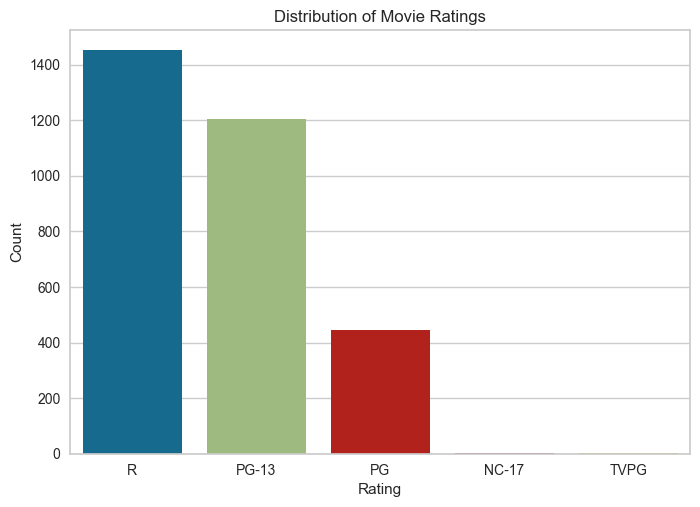

In [151]:
data.rating.value_counts()
counts = data['rating'].value_counts()

print(counts)

sns.barplot(x=counts.index, y=counts.values)

plt.title('Distribution of Movie Ratings')
plt.xlabel('Rating')
plt.ylabel('Count')

plt.show()


R: 46.75%
PG-13: 38.79%
PG: 14.30%
NC-17: 0.13%
TVPG: 0.03%


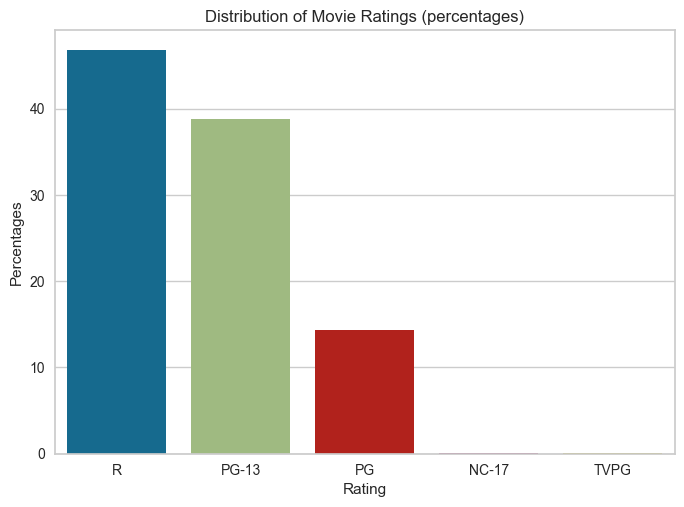

In [152]:
rating_counts = data['rating'].value_counts()
rating_percentages = rating_counts / rating_counts.sum() * 100

for rating, percentage in rating_percentages.items():
    print(f"{rating}: {percentage:.2f}%")

#print("Distribution of Movie Ratings:")
#print(rating_percentages)

sns.barplot(x=rating_percentages.index, y=rating_percentages.values)
plt.title('Distribution of Movie Ratings (percentages)')
plt.xlabel('Rating')
plt.ylabel('Percentages')
plt.show()

In [153]:
data['releaseDateStreaming'] = pd.to_datetime(data['releaseDateStreaming'])
data['releaseDateTheaters'] = pd.to_datetime(data['releaseDateTheaters'])
data['time_diff'] = data['releaseDateStreaming'] - data['releaseDateTheaters']

max_time_diff_idx = data['time_diff'].idxmax()
min_time_diff_idx = data['time_diff'].idxmin()

max_time_diff_movie = data.loc[max_time_diff_idx, 'title']
max_time_diff = data.loc[max_time_diff_idx, 'time_diff']
min_time_diff_movie = data.loc[min_time_diff_idx, 'title']
min_time_diff = data.loc[min_time_diff_idx, 'time_diff']

print("Difference release Date Streaming and release Date Theaters:\n\n")
print(f'The movie with the maximum time difference is "{max_time_diff_movie}" with  {max_time_diff.days} days.')
print(f'The movie with the minimum time difference is "{min_time_diff_movie}" with  {min_time_diff.days} days.')

Difference release Date Streaming and release Date Theaters:


The movie with the maximum time difference is "Tristana" with  15689 days.
The movie with the minimum time difference is "After the Sunset" with  -12619 days.


In [154]:
print(data['genre'].dtype)

object


In [155]:
data['genre'] = data['genre'].astype(str)

In [156]:
most_common_genres = data['genre'].value_counts().head(5)
print(most_common_genres)

genre
['Drama']                           360
['Comedy']                          331
['Comedy', 'Drama']                 184
['Romance', 'Comedy']               152
['Horror', 'Mystery & thriller']    114
Name: count, dtype: int64


In [157]:
# Convert lists in the 'genre' column to tuples
df['genre'] = df['genre'].apply(tuple)

unique_genre = df['genre'].unique()
term_counts = {}

for rating in unique_genre:
    terms = rating  # Directly use the tuple of terms for this rating
    for term in terms:
        if term not in term_counts:
            term_counts[term] = 0
        term_counts[term] += 1

print("Counts for each descriptive term in the 'genre', across all ratings, sorted bydescending order:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    print(term, count)

Counts for each descriptive term in the 'genre', across all ratings, sorted bydescending order:

Drama 206
Adventure 184
Comedy 165
Action 154
Fantasy 132
Mystery & thriller 121
Sci-fi 96
Kids & family 85
Romance 66
Horror 62
Animation 48
Biography 43
History 40
Musical 37
War 30
Crime 29
Holiday 23
Lgbtq+ 18
Music 13
Western 13
Documentary 7
Anime 6


In [158]:
total_entries = len(df)

print("Percentage of each genre in the dataset:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    percentage = (count / total_entries) * 100
    print(f"{term}: {percentage:.2f}%")

Percentage of each genre in the dataset:

Drama: 6.64%
Adventure: 5.93%
Comedy: 5.32%
Action: 4.96%
Fantasy: 4.25%
Mystery & thriller: 3.90%
Sci-fi: 3.09%
Kids & family: 2.74%
Romance: 2.13%
Horror: 2.00%
Animation: 1.55%
Biography: 1.39%
History: 1.29%
Musical: 1.19%
War: 0.97%
Crime: 0.93%
Holiday: 0.74%
Lgbtq+: 0.58%
Music: 0.42%
Western: 0.42%
Documentary: 0.23%
Anime: 0.19%


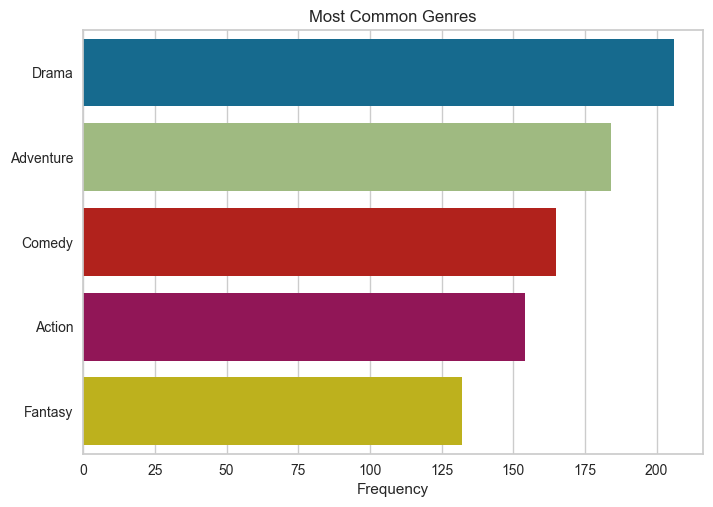

In [159]:
num_top_genres = 5

# dictionary with the top genres
top_genres = dict(sorted(term_counts.items(), key=lambda x: x[1], reverse=True)[:num_top_genres])

# Plot the frequency counts
sns.barplot(x=list(top_genres.values()), y=list(top_genres.keys()), orient='h')

plt.title('Most Common Genres')
plt.xlabel('Frequency')
#plt.ylabel('Genres')

plt.show()

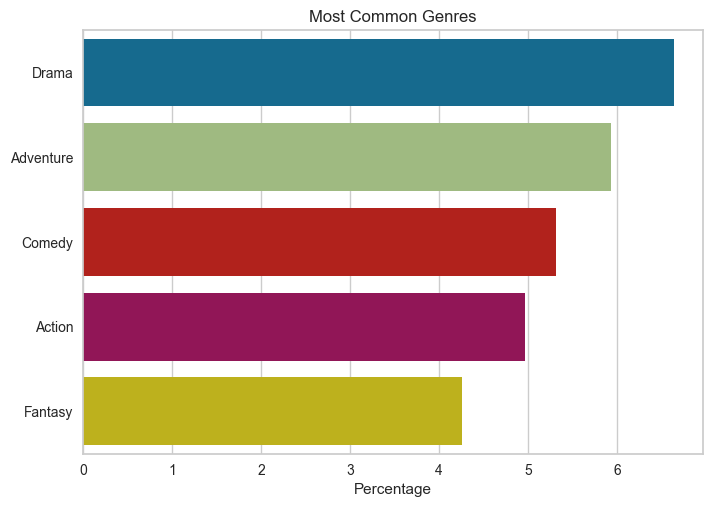

In [160]:
total_entries = len(df)

#print("Percentage of each genre in the dataset:\n")
#for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
#    percentage = (count / total_entries) * 100
#    print(f"{term}: {percentage:.2f}%")

num_top_genres = 5

# Create a dictionary
top_genres = dict(sorted(term_counts.items(), key=lambda x: x[1], reverse=True)[:num_top_genres])

# Calculate the percentages
top_genres_percentages = {genre: (count / total_entries) * 100 for genre, count in top_genres.items()}

# Plot
sns.barplot(x=list(top_genres_percentages.values()), y=list(top_genres_percentages.keys()), orient='h')

plt.title('Most Common Genres')
plt.xlabel('Percentage')
#plt.ylabel('Genres')

plt.show()

In [161]:
print(data['writer'].dtype)

object


In [162]:
# Convert lists to tuples
df['writer'] = df['writer'].apply(tuple)

unique_writer = df['writer'].unique()
term_counts = {}

for writer in unique_writer:
    terms = writer  # Directly use the tuple of terms for this rating
    for term in terms:
        if term not in term_counts:
            term_counts[term] = 0
        term_counts[term] += 1

print("Counts for each descriptive term in the 'writer', across all ratings, sorted by descending order:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    print(term, count)

Counts for each descriptive term in the 'writer', across all ratings, sorted by descending order:

Peter Tolan 11
Akiva Goldsman 11
John Logan 9
David Koepp 9
Billy Ray 8
Neal Purvis 8
Robert Wade 8
Nicholas Stoller 8
Tony Gilroy 8
Jay Scherick 8
David Ronn 8
Peter Farrelly 7
David S. Goyer 7
Guillermo del Toro 7
Joel Coen 7
Ethan Coen 7
Edgar Wright 7
Leslie Dixon 7
Zak Penn 7
James V. Hart 7
Chris Weitz 7
Luc Besson 7
Michael McCullers 7
Todd Phillips 7
Scot Armstrong 6
Christopher Landon 6
Ehren Kruger 6
Allan Loeb 6
Lawrence Konner 6
James Vanderbilt 6
Stuart Beattie 6
Danny McBride 6
Robert Farrelly 6
Christopher McQuarrie 6
Jez Butterworth 6
Ice Cube 6
Evan Goldberg 6
Simon Kinberg 6
Kurt Wimmer 6
Scott Frank 6
Craig Mazin 6
James Gunn 6
Hossein Amini 6
Charles Leavitt 6
Eric Roth 6
Peter Jackson 6
Roberto Orci 6
Michael Crichton 6
Cormac Wibberley 6
George Gallo 6
M. Night Shyamalan 5
Shane Salerno 5
Michael Green 5
Stephen King 5
Robert Nelson Jacobs 5
Alexander Payne 5
David G

In [163]:
total_entries = len(df)

print("Percentage of each writer in the dataset:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    percentage = (count / total_entries) * 100
    print(f"{term}: {percentage:.2f}%")

Percentage of each writer in the dataset:

Peter Tolan: 0.35%
Akiva Goldsman: 0.35%
John Logan: 0.29%
David Koepp: 0.29%
Billy Ray: 0.26%
Neal Purvis: 0.26%
Robert Wade: 0.26%
Nicholas Stoller: 0.26%
Tony Gilroy: 0.26%
Jay Scherick: 0.26%
David Ronn: 0.26%
Peter Farrelly: 0.23%
David S. Goyer: 0.23%
Guillermo del Toro: 0.23%
Joel Coen: 0.23%
Ethan Coen: 0.23%
Edgar Wright: 0.23%
Leslie Dixon: 0.23%
Zak Penn: 0.23%
James V. Hart: 0.23%
Chris Weitz: 0.23%
Luc Besson: 0.23%
Michael McCullers: 0.23%
Todd Phillips: 0.23%
Scot Armstrong: 0.19%
Christopher Landon: 0.19%
Ehren Kruger: 0.19%
Allan Loeb: 0.19%
Lawrence Konner: 0.19%
James Vanderbilt: 0.19%
Stuart Beattie: 0.19%
Danny McBride: 0.19%
Robert Farrelly: 0.19%
Christopher McQuarrie: 0.19%
Jez Butterworth: 0.19%
Ice Cube: 0.19%
Evan Goldberg: 0.19%
Simon Kinberg: 0.19%
Kurt Wimmer: 0.19%
Scott Frank: 0.19%
Craig Mazin: 0.19%
James Gunn: 0.19%
Hossein Amini: 0.19%
Charles Leavitt: 0.19%
Eric Roth: 0.19%
Peter Jackson: 0.19%
Roberto Orci

In [164]:
# Choose the number of top genres to display
#num_top_writer = 5

# Create a dictionary with the top genres
#top_writer = dict(sorted(term_counts.items(), key=lambda x: x[1], reverse=True)[:num_top_genres])

# Plot the frequency counts of the most common genres
#sns.barplot(x=list(top_writer.values()), y=list(top_writer.keys()), orient='h')

#plt.title('Most Common Writers')
#plt.xlabel('Frequency')
#plt.ylabel('Genres')

#plt.show()

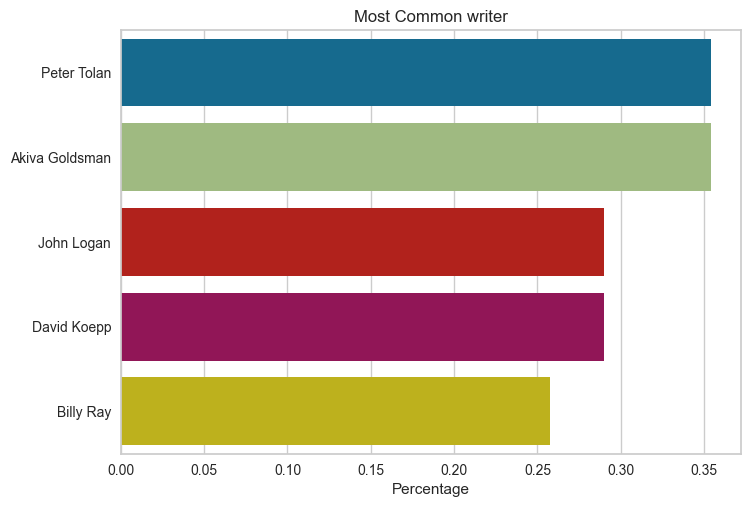

In [165]:
total_entries = len(df)

num_top_writer = 5

# Create a dictionary
top_writer = dict(sorted(term_counts.items(), key=lambda x: x[1], reverse=True)[:num_top_writer])

# Calculate the percentages
top_writer_percentages = {writer: (count / total_entries) * 100 for writer, count in top_writer.items()}

# Plot 
sns.barplot(x=list(top_writer_percentages.values()), y=list(top_writer_percentages.keys()), orient='h')

plt.title('Most Common writer')
plt.xlabel('Percentage')

plt.show()

In [166]:
# Convert lists to tuples
df['director'] = df['director'].apply(tuple)

unique_director = df['director'].unique()
term_counts = {}

for director in unique_director:
    terms = director  # Directly use the tuple of terms for this rating
    for term in terms:
        if term not in term_counts:
            term_counts[term] = 0
        term_counts[term] += 1

print("Counts for each descriptive term in the 'director', across all ratings, sorted by descending order:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    print(term, count)

Counts for each descriptive term in the 'director', across all ratings, sorted by descending order:

Robert Rodriguez 4
Peter Farrelly 4
Allen Hughes 4
Mike Mitchell 3
Chris Weitz 3
Lana Wachowski 3
Don Hall 3
Tim Johnson 3
Paul Weitz 3
Wayne Wang 3
Albert Hughes 3
Andrew Adamson 3
Byron Howard 3
Tim Burton 2
Mark Neveldine 2
Lasse Hallström 2
Jon Erwin 2
Andrew Erwin 2
Robert Farrelly 2
David Bowers 2
Bibo Bergeron 2
David Silverman 2
Jonathan Dayton 2
Valerie Faris 2
Rob Letterman 2
Joel Coen 2
James Gunn 2
Joe Johnston 2
Michael Apted 2
John Landis 2
Oxide Chun Pang 2
Danny Pang 2
Karey Kirkpatrick 2
Kyle Balda 2
Steven Brill 2
Brett Ratner 2
Rob Minkoff 2
Chris Renaud 2
Pierre Coffin 2
Anna Boden 2
Ryan Fleck 2
Chris Kentis 2
Nicholas Stoller 2
Lilly Wachowski 2
Nanette Burstein 2
Dan Kwan 2
Daniel Scheinert 2
Rich Moore 2
Tim Story 2
Vicky Jenson 2
Kelly Asbury 2
Curtis Hanson 2
Steve Carr 2
Robert Ben Garant 2
Dinesh D'Souza 2
Dean DeBlois 2
Tom Tykwer 2
Chris Miller 2
Simon J. S

In [167]:
total_entries = len(df)

print("Percentage of each director in the dataset:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    percentage = (count / total_entries) * 100
    print(f"{term}: {percentage:.2f}%")

Percentage of each director in the dataset:

Robert Rodriguez: 0.13%
Peter Farrelly: 0.13%
Allen Hughes: 0.13%
Mike Mitchell: 0.10%
Chris Weitz: 0.10%
Lana Wachowski: 0.10%
Don Hall: 0.10%
Tim Johnson: 0.10%
Paul Weitz: 0.10%
Wayne Wang: 0.10%
Albert Hughes: 0.10%
Andrew Adamson: 0.10%
Byron Howard: 0.10%
Tim Burton: 0.06%
Mark Neveldine: 0.06%
Lasse Hallström: 0.06%
Jon Erwin: 0.06%
Andrew Erwin: 0.06%
Robert Farrelly: 0.06%
David Bowers: 0.06%
Bibo Bergeron: 0.06%
David Silverman: 0.06%
Jonathan Dayton: 0.06%
Valerie Faris: 0.06%
Rob Letterman: 0.06%
Joel Coen: 0.06%
James Gunn: 0.06%
Joe Johnston: 0.06%
Michael Apted: 0.06%
John Landis: 0.06%
Oxide Chun Pang: 0.06%
Danny Pang: 0.06%
Karey Kirkpatrick: 0.06%
Kyle Balda: 0.06%
Steven Brill: 0.06%
Brett Ratner: 0.06%
Rob Minkoff: 0.06%
Chris Renaud: 0.06%
Pierre Coffin: 0.06%
Anna Boden: 0.06%
Ryan Fleck: 0.06%
Chris Kentis: 0.06%
Nicholas Stoller: 0.06%
Lilly Wachowski: 0.06%
Nanette Burstein: 0.06%
Dan Kwan: 0.06%
Daniel Scheinert: 0

In [168]:
# Choose the number of top genres to display
#num_top_director = 5

# Create a dictionary with the top genres
#top_director = dict(sorted(term_counts.items(), key=lambda x: x[1], reverse=True)[:num_top_director])

# Plot the frequency counts of the most common genres
#sns.barplot(x=list(top_director.values()), y=list(top_director.keys()), orient='h')

#plt.title('Most Common directors')
#plt.xlabel('Frequency')
#plt.ylabel('Genres')

#plt.show()

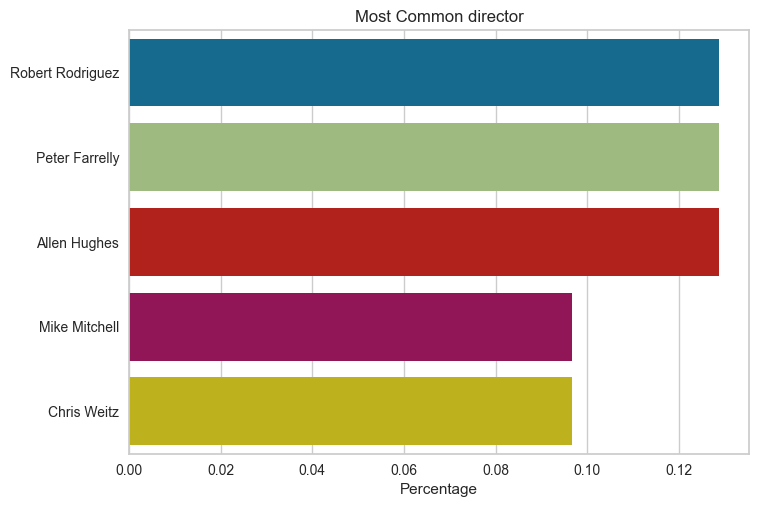

In [169]:
total_entries = len(df)

num_top_director = 5

# Create a dictionary
top_director = dict(sorted(term_counts.items(), key=lambda x: x[1], reverse=True)[:num_top_director])

# percentages for the top genres
top_director_percentages = {director: (count / total_entries) * 100 for director, count in top_director.items()}

# Plot
sns.barplot(x=list(top_director_percentages.values()), y=list(top_director_percentages.keys()), orient='h')

plt.title('Most Common director')
plt.xlabel('Percentage')

plt.show()

In [170]:
# Convert lists to tuples
df['distributor'] = df['distributor'].apply(tuple)

unique_distributor= df['distributor'].unique()
term_counts = {}

for distributor in unique_distributor:
    terms = distributor  # Directly use the tuple of terms for this rating
    for term in terms:
        if term not in term_counts:
            term_counts[term] = 0
        term_counts[term] += 1

print("Counts for each descriptive term in the 'distributor', across all ratings, sorted by descending order:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    print(term, count)

Counts for each descriptive term in the 'distributor', across all ratings, sorted by descending order:

Lionsgate Films 20
Sony Pictures Entertainment 20
Universal Pictures 18
Miramax Films 16
Buena Vista Pictures 15
Paramount Pictures 14
20th Century Fox 14
DreamWorks SKG 13
New Line Cinema 11
Columbia Pictures 10
Columbia TriStar Home Video 10
Warner Bros. 9
Screen Gems 9
Columbia Tristar 9
Sony Pictures Classics 8
Metro-Goldwyn-Mayer 8
Warner Bros. Pictures 7
Focus Features 7
Touchstone Pictures 7
IFC Films 7
United Artists 6
Roadside Attractions 6
Artisan Entertainment 6
Amazon Studios 6
TriStar Pictures 6
Warner Home Vídeo 6
Criterion Collection 6
USA Films 5
Samuel Goldwyn Company 5
Buena Vista International [us] 5
Summit Entertainment 5
New Line Home Video [us] 5
Fox 4
Fine Line Features 4
Walt Disney Pictures 4
here! Films 4
Gativideo 4
Argentina Video Home 4
MCA/Universal Pictures [us] 4
Alliance Atlantis Communications Inc. 4
Metro-Goldwyn-Mayer Distributing Corp. 3
Bleecker 

In [171]:
total_entries = len(df)

print("Percentage of each director in the distribution:\n")
for term, count in sorted(term_counts.items(), key=lambda x: x[1], reverse=True):
    percentage = (count / total_entries) * 100
    print(f"{term}: {percentage:.2f}%")

Percentage of each director in the distribution:

Lionsgate Films: 0.64%
Sony Pictures Entertainment: 0.64%
Universal Pictures: 0.58%
Miramax Films: 0.52%
Buena Vista Pictures: 0.48%
Paramount Pictures: 0.45%
20th Century Fox: 0.45%
DreamWorks SKG: 0.42%
New Line Cinema: 0.35%
Columbia Pictures: 0.32%
Columbia TriStar Home Video: 0.32%
Warner Bros.: 0.29%
Screen Gems: 0.29%
Columbia Tristar: 0.29%
Sony Pictures Classics: 0.26%
Metro-Goldwyn-Mayer: 0.26%
Warner Bros. Pictures: 0.23%
Focus Features: 0.23%
Touchstone Pictures: 0.23%
IFC Films: 0.23%
United Artists: 0.19%
Roadside Attractions: 0.19%
Artisan Entertainment: 0.19%
Amazon Studios: 0.19%
TriStar Pictures: 0.19%
Warner Home Vídeo: 0.19%
Criterion Collection: 0.19%
USA Films: 0.16%
Samuel Goldwyn Company: 0.16%
Buena Vista International [us]: 0.16%
Summit Entertainment: 0.16%
New Line Home Video [us]: 0.16%
Fox: 0.13%
Fine Line Features: 0.13%
Walt Disney Pictures: 0.13%
here! Films: 0.13%
Gativideo: 0.13%
Argentina Video Home: 0

In [172]:
# Choose the number of top genres to display
#num_top_distributor = 5

# Create a dictionary with the top genres
#distributor = dict(sorted(term_counts.items(), key=lambda x: x[1], reverse=True)[:num_top_genres])

# Plot the frequency counts of the most common genres
#sns.barplot(x=list(distributor.values()), y=list(distributor.keys()), orient='h')

#plt.title('Most Common distributor')
#plt.xlabel('Frequency')
#plt.ylabel('Genres')

#plt.show()

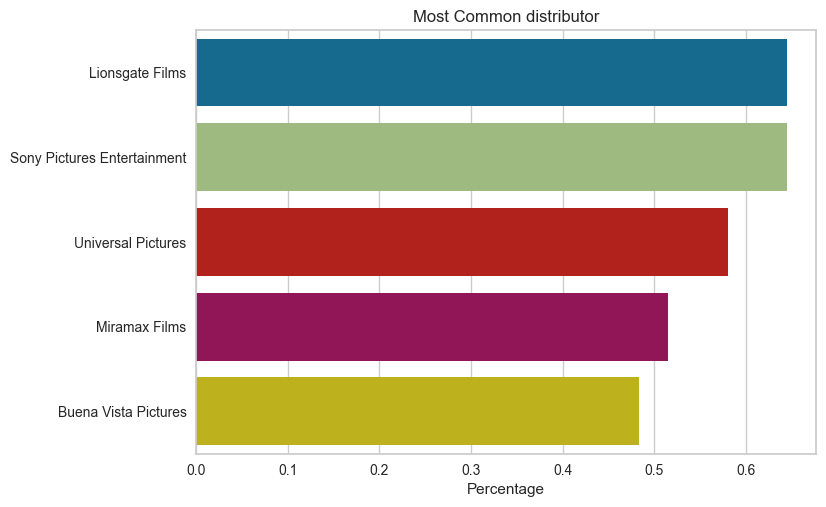

In [173]:
total_entries = len(df)

num_top_distributor = 5

# Create a dictionary
top_distributor = dict(sorted(term_counts.items(), key=lambda x: x[1], reverse=True)[:num_top_distributor])

# percentages
top_distributor_percentages = {distributor: (count / total_entries) * 100 for distributor, count in top_distributor.items()}

# Plot
sns.barplot(x=list(top_distributor_percentages.values()), y=list(top_distributor_percentages.keys()), orient='h')

plt.title('Most Common distributor')
plt.xlabel('Percentage')

plt.show()

In [174]:
df.to_csv('cleaned_rotten_tomatoes_movies3.csv', index=False)

# OUTLIERS

In [175]:
df = pd.read_csv("cleaned_rotten_tomatoes_movies3.csv")

In [176]:
#df.head(2)

In [177]:
runtimeMinutes_stats = df['runtimeMinutes'].describe()

# Get the lower and upper quartiles and the interquartile range (IQR)
Q1 = runtimeMinutes_stats['25%']
Q3 = runtimeMinutes_stats['75%']
IQR = Q3 - Q1

# Compute the lower and upper whiskers
lower_whisker = Q1 - 1.5 * IQR
upper_whisker = Q3 + 1.5 * IQR

print("Lower whisker: ", lower_whisker)
print("Upper whisker: ", upper_whisker)

# Filter the data based on the upper whisker
filtered_df = df[df['runtimeMinutes'] <= upper_whisker]

print("Number of rows before filtering: ", len(df))
print("Number of rows after filtering: ", len(filtered_df))

Lower whisker:  62.375
Upper whisker:  151.375
Number of rows before filtering:  3104
Number of rows after filtering:  3018


In [178]:
releaseTheatersYears_stats = df['releaseTheatersYears'].describe()

# Get the lower and upper quartiles and the interquartile range (IQR)
Q1 = releaseTheatersYears_stats['25%']
Q3 = releaseTheatersYears_stats['75%']
IQR = Q3 - Q1

lower_whisker = Q1 - 1.5 * IQR
upper_whisker = Q3 + 1.5 * IQR

print("Lower whisker: ", lower_whisker)
print("Upper whisker: ", upper_whisker)

Lower whisker:  1984.0
Upper whisker:  2032.0


In [179]:
daysBetween_stats = df['releaseStreamingYears'].describe()

# Get the lower and upper quartiles and the interquartile range (IQR)
Q1 = daysBetween_stats['25%']
Q3 = daysBetween_stats['75%']
IQR = Q3 - Q1

lower_whisker = Q1 - 1.5 * IQR
upper_whisker = Q3 + 1.5 * IQR

print("Lower whisker: ", lower_whisker)
print("Upper whisker: ", upper_whisker)

Lower whisker:  1989.0
Upper whisker:  2029.0


<AxesSubplot: xlabel='runtimeMinutes'>

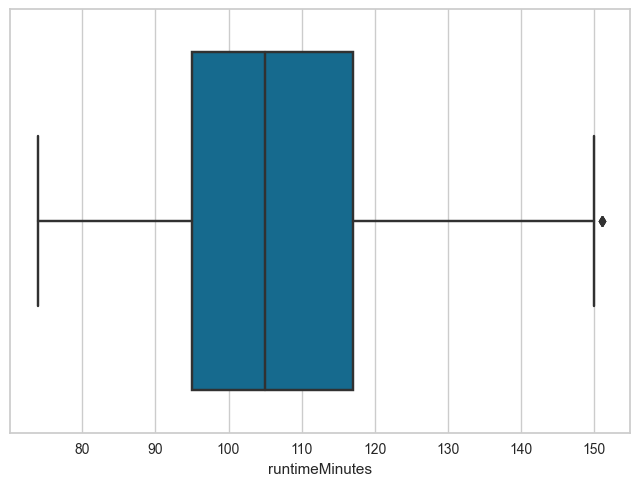

In [180]:
sns.boxplot(x=filtered_df['runtimeMinutes'])

<AxesSubplot: xlabel='releaseTheatersYears'>

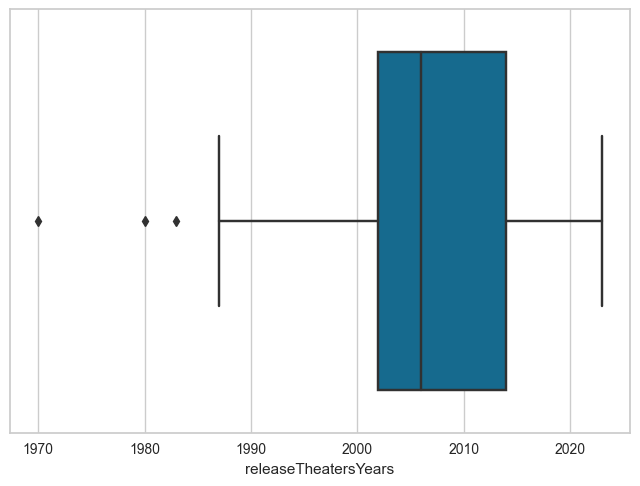

In [181]:
sns.boxplot(x=filtered_df['releaseTheatersYears'])

<AxesSubplot: xlabel='releaseStreamingYears'>

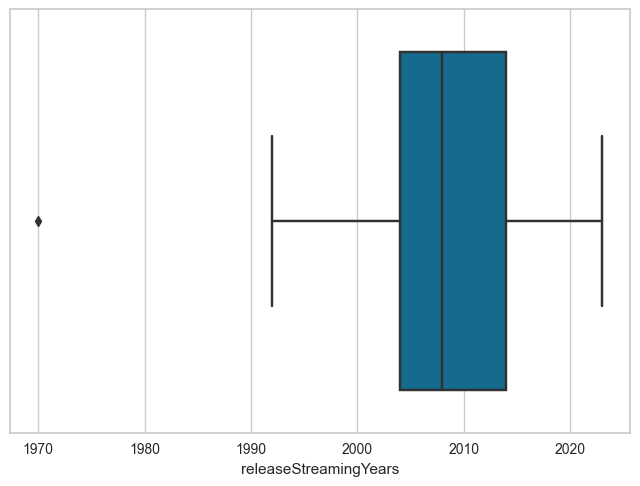

In [182]:
sns.boxplot(x=filtered_df['releaseStreamingYears'])

In [183]:
filtered_df = filtered_df[filtered_df['runtimeMinutes'] <= 150]
filtered_df = filtered_df[filtered_df['releaseTheatersYears'] >= 1984]
filtered_df = filtered_df[filtered_df['releaseStreamingYears'] >= 1971]

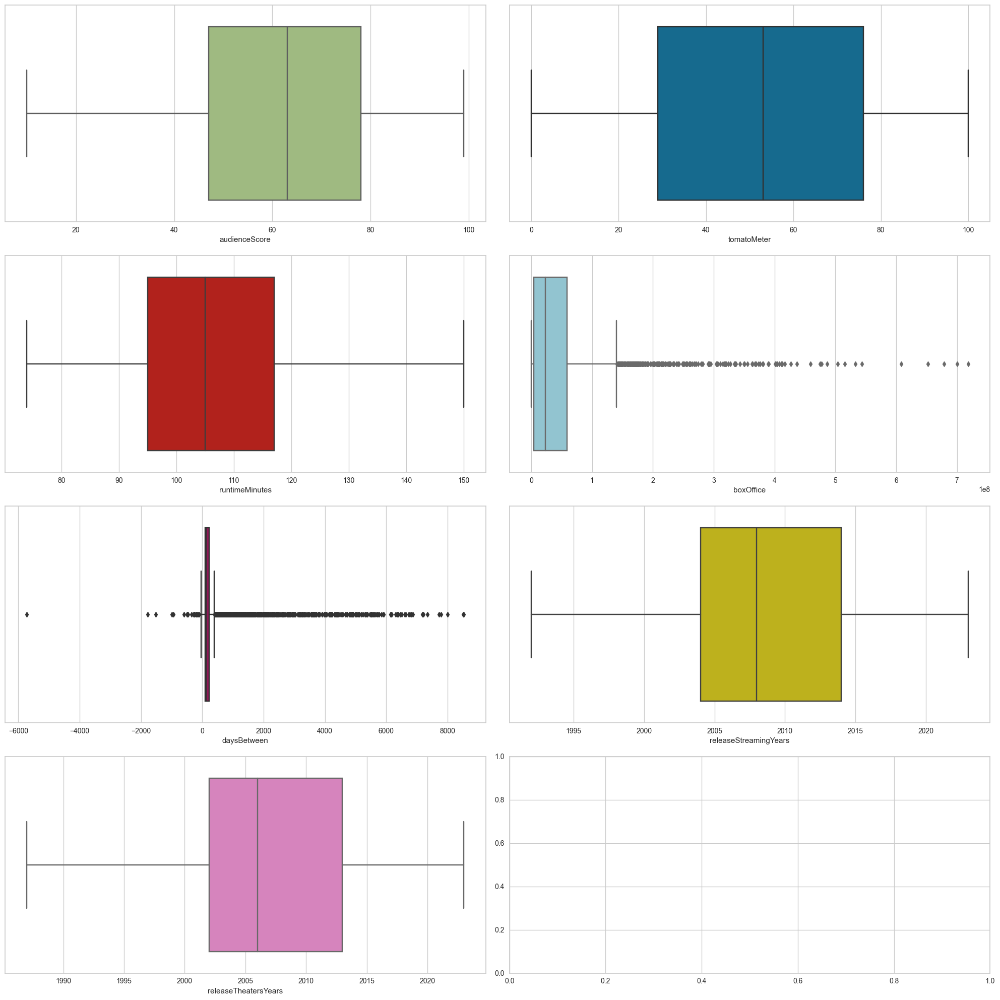

In [184]:
numerical_columns = ['audienceScore', 'tomatoMeter', 'runtimeMinutes', 'boxOffice', 'daysBetween','releaseStreamingYears','releaseTheatersYears']

colors = ['g', 'b', 'r', 'c', 'm', 'y', '#e377c2']
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(20,20))

for i, var in enumerate(numerical_columns):
    sns.boxplot(x=var, data=filtered_df, color=colors[i % len(colors)], ax=axs[i // 2, i % 2])

fig.tight_layout()
plt.show()

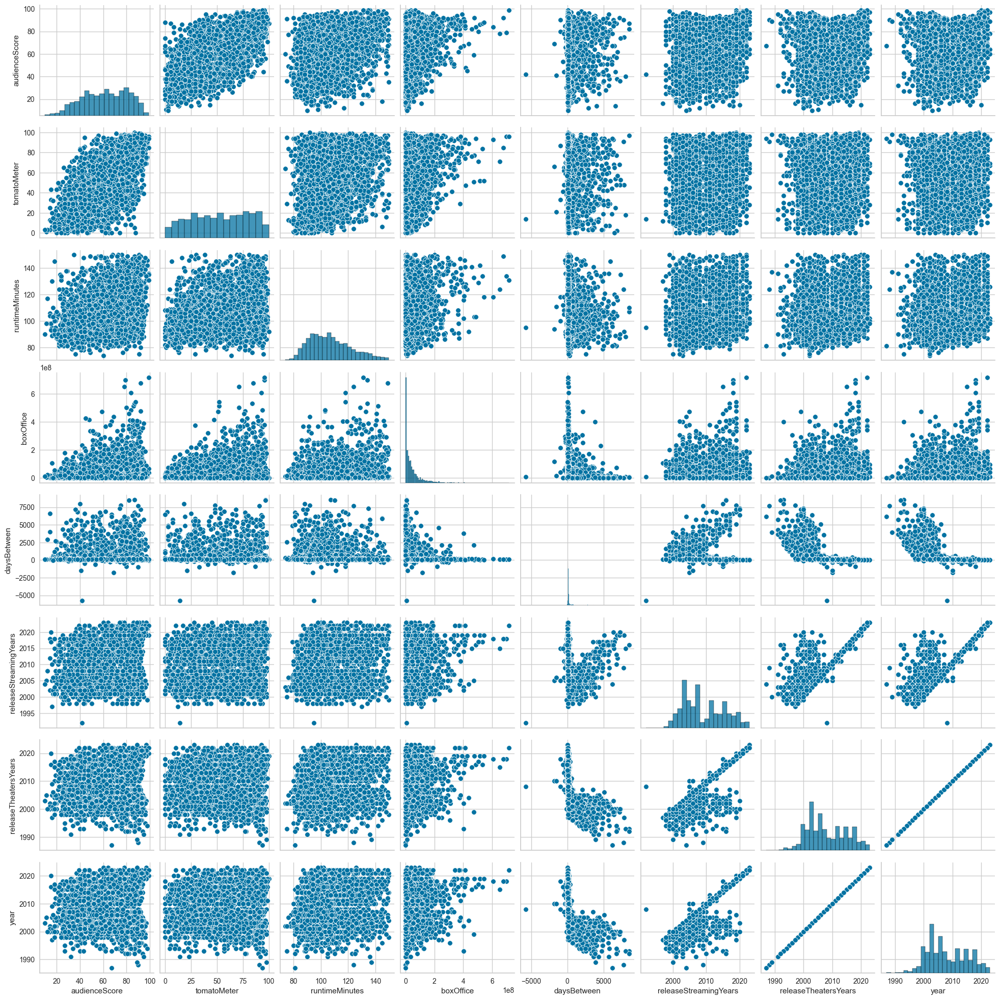

In [185]:
sns.pairplot(filtered_df)

In [186]:
filtered_df=filtered_df.drop(["daysBetween"], axis=1)

In [187]:
filtered_df=filtered_df.drop(["releaseDateTheaters"], axis=1)

In [188]:
filtered_df=filtered_df.drop(["releaseDateStreaming"], axis=1)

In [189]:
filtered_df.head(2)

,title,audienceScore,tomatoMeter,rating,ratingContents,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix,releaseStreamingYears,releaseTheatersYears,year
0,Monsoon Wedding,87.0,95.0,R,"['Some Sex Related Dialogue', 'Language']",100.0,"('Comedy', 'Drama')",English,"('Mira Nair',)","('Sabrina Dhawan',)",13900000.0,"('USA Films',)","['Dolby Stereo', 'Dolby Digital', 'Dolby A', '...",2002,2002,2002
1,Robin Hood,40.0,15.0,PG-13,"['Extended Sequences of Violence', 'Action', '...",118.0,"('Action', 'Adventure')",English,"('Otto Bathurst',)","('Ben Chandler', 'David James Kelly')",30800000.0,"('Lionsgate Films',)",['Dolby Atmos'],2019,2018,2018


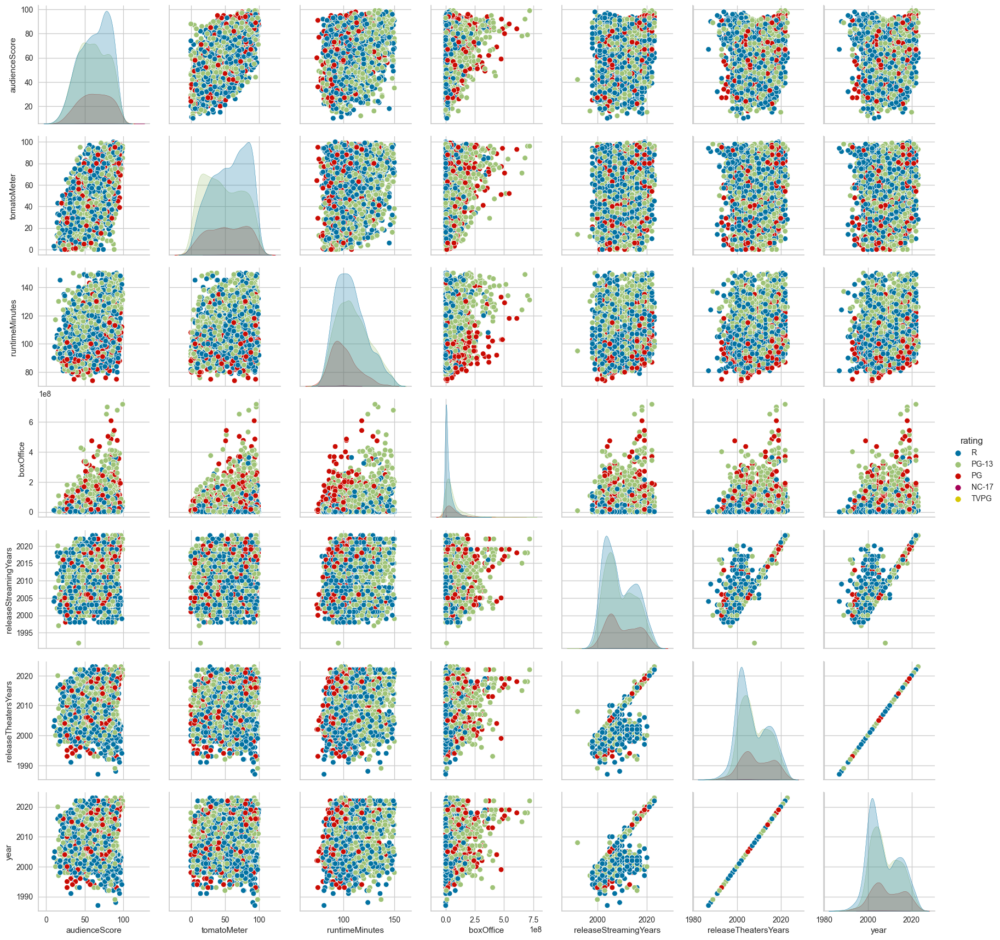

In [190]:
import seaborn as sns

sns.pairplot(filtered_df, hue='rating')

In [191]:
#sns.pairplot(filtered_df, hue='genre')

In [192]:
filtered_df.to_csv('cleaned_rotten_tomatoes_movies4.csv', index=False)

# DENDOGRAMAS

In [193]:
df = pd.read_csv("cleaned_rotten_tomatoes_movies4.csv")

In [194]:
df.head(2)

,title,audienceScore,tomatoMeter,rating,ratingContents,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix,releaseStreamingYears,releaseTheatersYears,year
0,Monsoon Wedding,87.0,95.0,R,"['Some Sex Related Dialogue', 'Language']",100.0,"('Comedy', 'Drama')",English,"('Mira Nair',)","('Sabrina Dhawan',)",13900000.0,"('USA Films',)","['Dolby Stereo', 'Dolby Digital', 'Dolby A', '...",2002,2002,2002
1,Robin Hood,40.0,15.0,PG-13,"['Extended Sequences of Violence', 'Action', '...",118.0,"('Action', 'Adventure')",English,"('Otto Bathurst',)","('Ben Chandler', 'David James Kelly')",30800000.0,"('Lionsgate Films',)",['Dolby Atmos'],2019,2018,2018


In [195]:
#df=df.drop(["daysBetween"], axis=1)

In [196]:
#df=df.drop(["releaseDateTheaters"], axis=1)

In [197]:
#df=df.drop(["releaseDateStreaming"], axis=1)

In [198]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd

# create an instance of LabelEncoder
le = LabelEncoder()

# encode the categorical columns
df['title'] = le.fit_transform(df['title'])
df['rating'] = le.fit_transform(df['rating'])
df['ratingContents'] = le.fit_transform(df['ratingContents'])
df['genre'] = le.fit_transform(df['genre'])
df['originalLanguage'] = le.fit_transform(df['originalLanguage'])
df['director'] = le.fit_transform(df['director'])
df['writer'] = le.fit_transform(df['writer'])
df['distributor'] = le.fit_transform(df['distributor'])
df['soundMix'] = le.fit_transform(df['soundMix'])

# display the encoded DataFrame
df.head()

,title,audienceScore,tomatoMeter,rating,ratingContents,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix,releaseStreamingYears,releaseTheatersYears,year
0,1492,87.0,95.0,3,1820,100.0,120,8,1078,2125,13900000.0,295,180,2002,2002,2002
1,1824,40.0,15.0,2,283,118.0,0,8,1147,217,30800000.0,149,70,2019,2018,2018
2,1533,25.0,21.0,1,2265,103.0,120,8,1037,234,8000000.0,55,249,1998,1998,1998
3,2986,69.0,71.0,3,830,118.0,205,8,1152,1844,2700000.0,105,70,2016,2015,2015
4,1147,69.0,86.0,3,1417,103.0,205,12,1154,1336,2100000.0,206,307,2004,2004,2004


In [199]:
from sklearn.preprocessing import StandardScaler

# Scaling the numerical features
scaler = StandardScaler()
num_cols = ['audienceScore', 'tomatoMeter', 'runtimeMinutes', 'boxOffice', 'releaseStreamingYears','releaseTheatersYears']
df[num_cols] = scaler.fit_transform(df[num_cols])

scaler.fit(df)
scaled_df = pd.DataFrame(scaler.transform(df),columns= df.columns )
print("All features are now scaled")

# Displaying the scaled DataFrame
scaled_df.head()

All features are now scaled


,title,audienceScore,tomatoMeter,rating,ratingContents,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix,releaseStreamingYears,releaseTheatersYears,year
0,-0.003755,1.313269,1.562337,0.948752,0.886829,-0.468285,-0.814735,-0.171942,0.556251,1.154739,-0.468566,0.938445,0.209728,-1.184968,-0.845820,-0.845820
1,0.380098,-1.135655,-1.385945,-0.442474,-1.407575,0.705722,-1.751546,-0.171942,0.704892,-1.440601,-0.238090,-0.445404,-1.037917,1.613493,1.499463,1.499463
2,0.043649,-1.917227,-1.164823,-1.833699,1.551116,-0.272617,-0.814735,-0.171942,0.467929,-1.417477,-0.549028,-1.336375,0.992341,-1.843429,-1.432140,-1.432140
3,1.723582,0.375383,0.677852,0.948752,-0.591024,0.705722,-0.151161,-0.171942,0.715663,0.772511,-0.621307,-0.862454,-1.037917,1.119647,1.059723,1.059723
4,-0.402638,0.375383,1.230655,0.948752,0.285238,-0.272617,-0.151161,1.178019,0.719971,0.081509,-0.629490,0.094866,1.650190,-0.855737,-0.552659,-0.552659


In [200]:
!pip install scikit-learn-extra


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


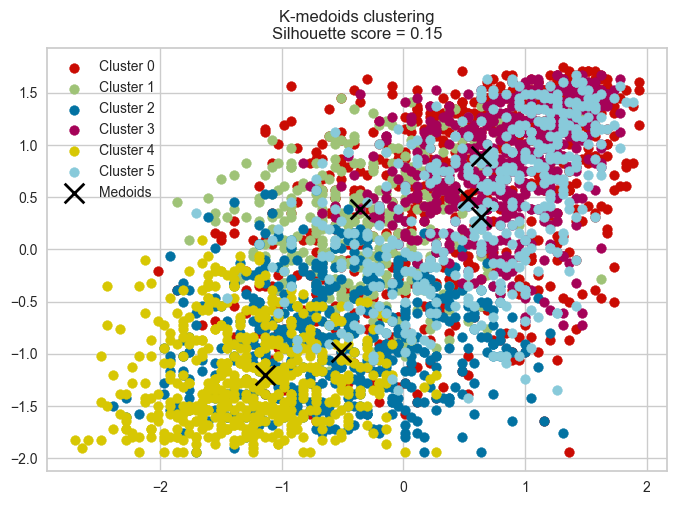

In [201]:
import numpy as np
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score

# select the numerical columns for clustering
num_cols = ['audienceScore', 'tomatoMeter', 'runtimeMinutes', 'boxOffice', 'releaseStreamingYears','releaseTheatersYears']
X = scaled_df[num_cols].values

# perform K-medoids clustering
k = 6
kmedoids = KMedoids(n_clusters=k, metric='euclidean', random_state=42).fit(X)

# get the cluster labels and medoids
labels = kmedoids.labels_
medoids = kmedoids.cluster_centers_

#silhouette score
silhouette = silhouette_score(X, labels)

# add the cluster labels to the DataFrame
scaled_df['cluster'] = labels

# plot
colors = ['r', 'g', 'b', 'm','y','c']
for i in range(k):
    plt.scatter(X[labels == i, 0], X[labels == i, 1], c=colors[i], label='Cluster {}'.format(i))
plt.scatter(medoids[:, 0], medoids[:, 1], marker='x', c='black', s=200, linewidths=2, label='Medoids')
plt.title('K-medoids clustering\nSilhouette score = {:.2f}'.format(silhouette))
plt.legend()
plt.show()

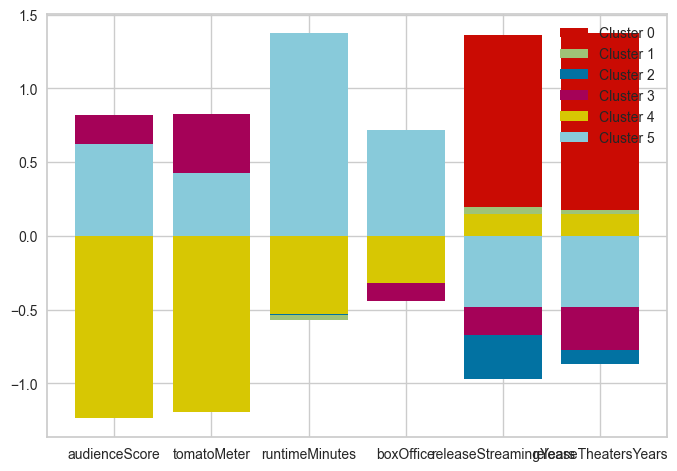

In [202]:
# group the data by cluster and calculate the mean of each feature for each cluster
cluster_means = scaled_df.groupby('cluster')[num_cols].mean()

# plot a bar plot for each cluster
for i in range(k):
    plt.bar(num_cols, cluster_means.loc[i], color=colors[i], label='Cluster {}'.format(i))
plt.legend()
plt.show()

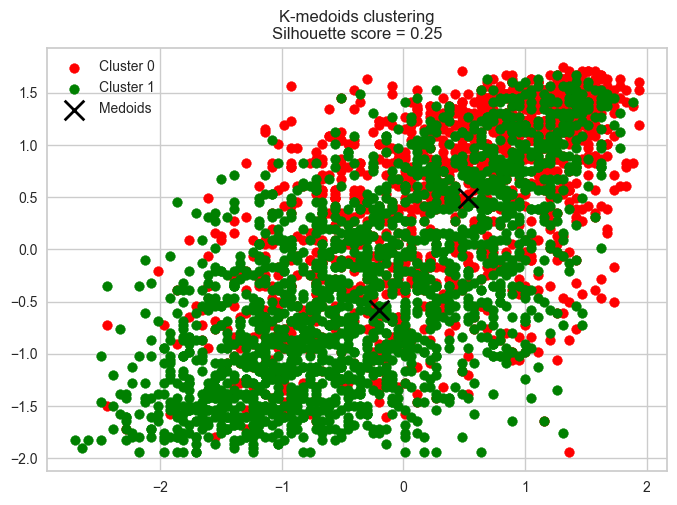

In [203]:
import numpy as np
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score

# select the numerical columns for clustering
num_cols = ['audienceScore', 'tomatoMeter', 'runtimeMinutes', 'boxOffice', 'releaseStreamingYears','releaseTheatersYears']
X = scaled_df[num_cols].values

# perform K-medoids clustering
k = 2
kmedoids = KMedoids(n_clusters=k, metric='euclidean', random_state=42).fit(X)

# get the cluster labels and medoids
labels = kmedoids.labels_
medoids = kmedoids.cluster_centers_

# compute the silhouette score
silhouette = silhouette_score(X, labels)

# add the cluster labels to the DataFrame
scaled_df['cluster'] = labels

# plot the results
colors = ['red', 'green']
for i in range(k):
    plt.scatter(X[labels == i, 0], X[labels == i, 1], c=colors[i], label='Cluster {}'.format(i))
plt.scatter(medoids[:, 0], medoids[:, 1], marker='x', c='black', s=200, linewidths=2, label='Medoids')
plt.title('K-medoids clustering\nSilhouette score = {:.2f}'.format(silhouette))
plt.legend()
plt.show()

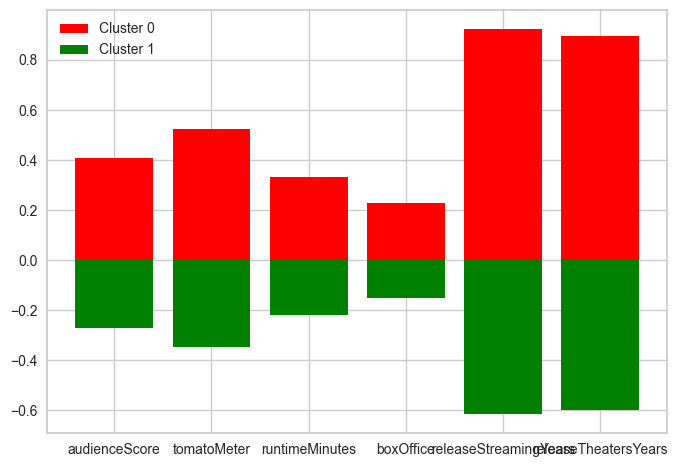

In [204]:
# group the data by cluster and calculate the mean of each feature for each cluster
cluster_means = scaled_df.groupby('cluster')[num_cols].mean()

# plot a bar plot for each cluster
for i in range(k):
    plt.bar(num_cols, cluster_means.loc[i], color=colors[i], label='Cluster {}'.format(i))
plt.legend()
plt.show()

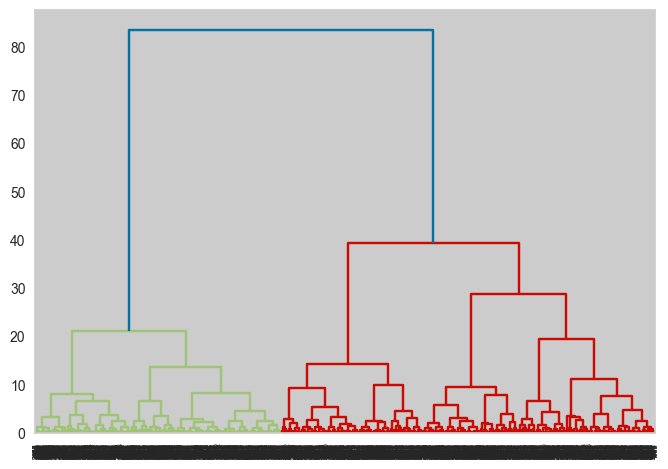

In [205]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram

x = scaled_df['audienceScore']
y = scaled_df['tomatoMeter']

scaled_df = list(zip(x, y))

linkage_data = linkage(scaled_df, method='ward', metric='euclidean')
dendrogram(linkage_data)

plt.show()

#plt.savefig("name.png")

# REMOVE ALL OUTLIERS

In [206]:
df = pd.read_csv("cleaned_rotten_tomatoes_movies4.csv")

In [207]:
df.head(2)

,title,audienceScore,tomatoMeter,rating,ratingContents,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix,releaseStreamingYears,releaseTheatersYears,year
0,Monsoon Wedding,87.0,95.0,R,"['Some Sex Related Dialogue', 'Language']",100.0,"('Comedy', 'Drama')",English,"('Mira Nair',)","('Sabrina Dhawan',)",13900000.0,"('USA Films',)","['Dolby Stereo', 'Dolby Digital', 'Dolby A', '...",2002,2002,2002
1,Robin Hood,40.0,15.0,PG-13,"['Extended Sequences of Violence', 'Action', '...",118.0,"('Action', 'Adventure')",English,"('Otto Bathurst',)","('Ben Chandler', 'David James Kelly')",30800000.0,"('Lionsgate Films',)",['Dolby Atmos'],2019,2018,2018


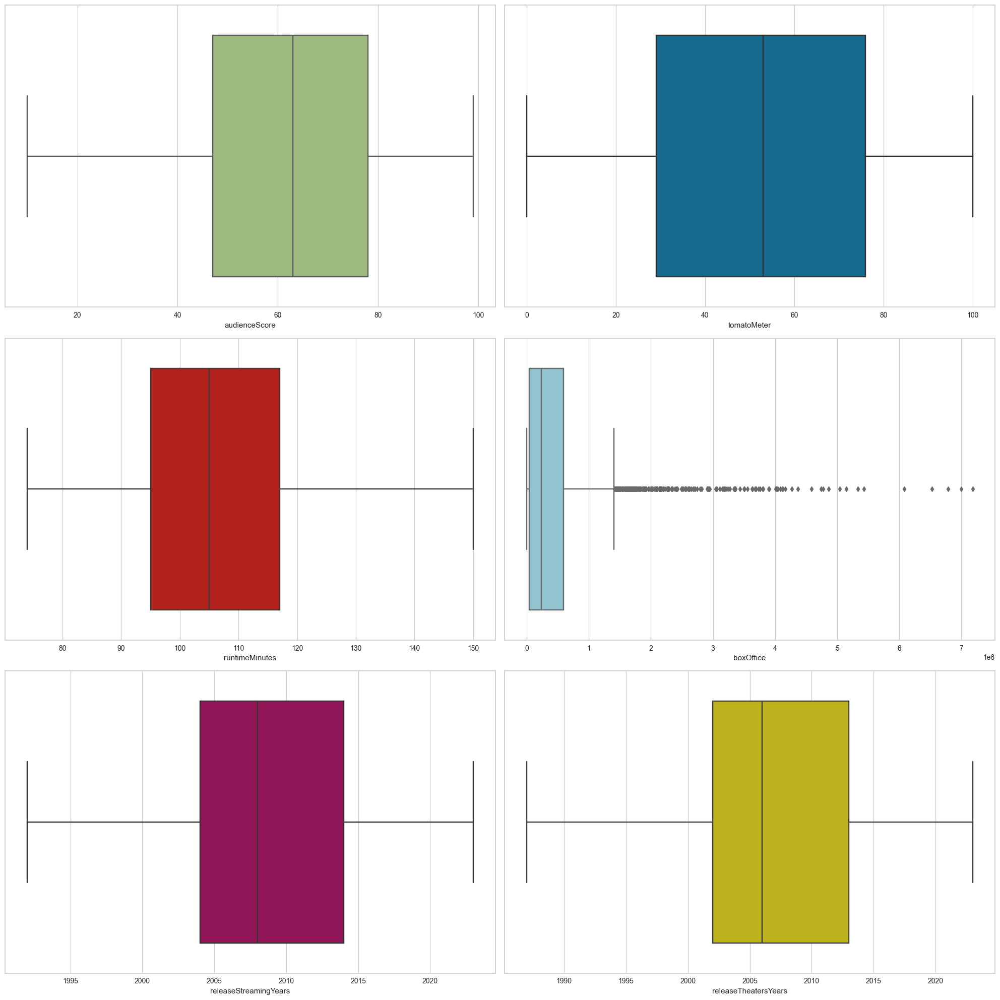

In [208]:
numerical_columns = ['audienceScore', 'tomatoMeter', 'runtimeMinutes', 'boxOffice','releaseStreamingYears','releaseTheatersYears']

colors = ['g', 'b', 'r', 'c', 'm', 'y', '#e377c2']
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(20,20))

for i, var in enumerate(numerical_columns):
    sns.boxplot(x=var, data=df, color=colors[i % len(colors)], ax=axs[i // 2, i % 2])

fig.tight_layout()
plt.show()

In [209]:
boxOffice_stats = df['boxOffice'].describe()

# Get the lower and upper quartiles and the interquartile range (IQR)
Q1 = boxOffice_stats['25%']
Q3 = boxOffice_stats['75%']
IQR = Q3 - Q1

lower_whisker = Q1 - 1.5 * IQR
upper_whisker = Q3 + 1.5 * IQR

print("Lower whisker: ", lower_whisker)
print("Upper whisker: ", upper_whisker)

Lower whisker:  -78100000.0
Upper whisker:  141100000.0


In [210]:
df = df[df['boxOffice'] <= 105000000.0]

In [211]:
#numerical_columns = ['audienceScore', 'tomatoMeter', 'runtimeMinutes', 'boxOffice','releaseStreamingYears','releaseTheatersYears']

#colors = ['g', 'b', 'r', 'c', 'm', 'y', '#e377c2']
#fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(20,20))

#for i, var in enumerate(numerical_columns):
#    sns.boxplot(x=var, data=df, color=colors[i % len(colors)], ax=axs[i // 2, i % 2])

#fig.tight_layout()
#plt.show()

In [212]:
boxOffice_stats = df['boxOffice'].describe()

# Get the lower and upper quartiles and the interquartile range (IQR)
Q1 = boxOffice_stats['25%']
Q3 = boxOffice_stats['75%']
IQR = Q3 - Q1

lower_whisker = Q1 - 1.5 * IQR
upper_whisker = Q3 + 1.5 * IQR

print("Lower whisker: ", lower_whisker)
print("Upper whisker: ", upper_whisker)

Lower whisker:  -55987500.0
Upper whisker:  100512500.0


In [213]:
df = df[df['boxOffice'] <= 94500000.0]

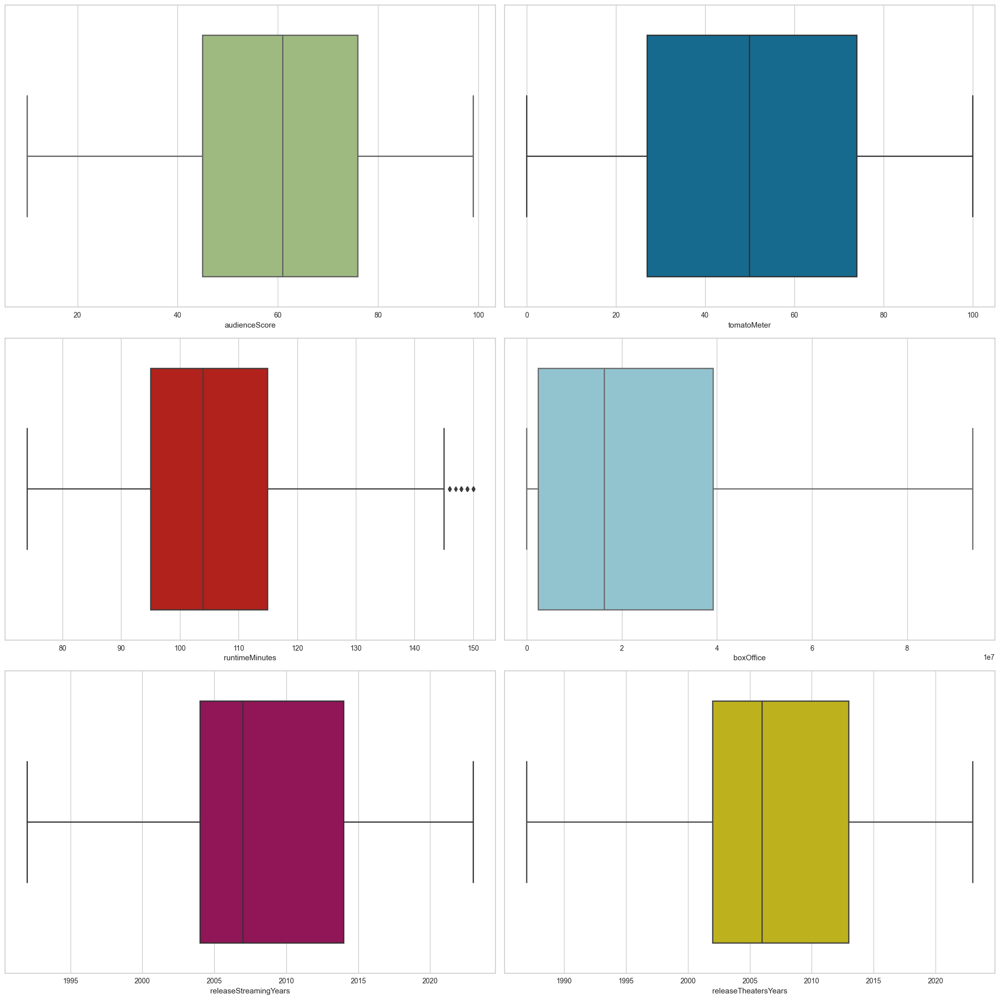

In [214]:
numerical_columns = ['audienceScore', 'tomatoMeter', 'runtimeMinutes', 'boxOffice','releaseStreamingYears','releaseTheatersYears']

colors = ['g', 'b', 'r', 'c', 'm', 'y', '#e377c2']
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(20,20))

for i, var in enumerate(numerical_columns):
    sns.boxplot(x=var, data=df, color=colors[i % len(colors)], ax=axs[i // 2, i % 2])

fig.tight_layout()
plt.show()

In [215]:
runtimeMinutes_stats = df['runtimeMinutes'].describe()

# Get the lower and upper quartiles and the interquartile range (IQR)
Q1 = runtimeMinutes_stats['25%']
Q3 = runtimeMinutes_stats['75%']
IQR = Q3 - Q1

lower_whisker = Q1 - 1.5 * IQR
upper_whisker = Q3 + 1.5 * IQR

print("Lower whisker: ", lower_whisker)
print("Upper whisker: ", upper_whisker)

Lower whisker:  65.0
Upper whisker:  145.0


In [216]:
df = df[df['runtimeMinutes'] <= 144.0]

<AxesSubplot: xlabel='runtimeMinutes'>

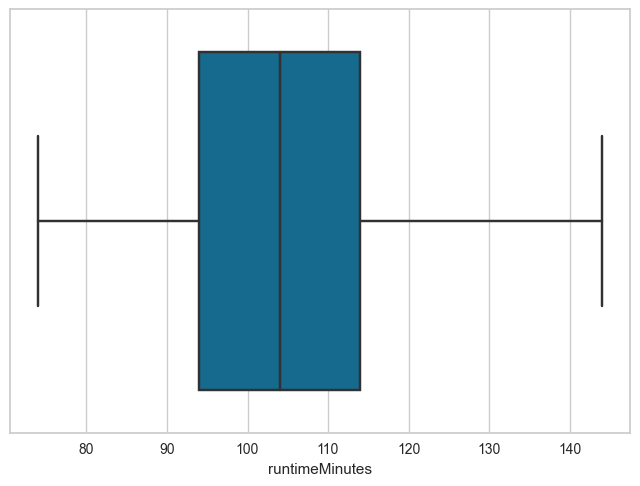

In [217]:
sns.boxplot(x=df['runtimeMinutes'])

In [218]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
import pandas as pd

# create an instance of LabelEncoder
le = LabelEncoder()

# encode the categorical columns
df['title'] = le.fit_transform(df['title'])
df['rating'] = le.fit_transform(df['rating'])
df['ratingContents'] = le.fit_transform(df['ratingContents'])
df['genre'] = le.fit_transform(df['genre'])
df['originalLanguage'] = le.fit_transform(df['originalLanguage'])
df['director'] = le.fit_transform(df['director'])
df['writer'] = le.fit_transform(df['writer'])
df['distributor'] = le.fit_transform(df['distributor'])
df['soundMix'] = le.fit_transform(df['soundMix'])
df['releaseStreamingYears'] = le.fit_transform(df['releaseStreamingYears'])
df['releaseTheatersYears'] = le.fit_transform(df['releaseTheatersYears'])

# display the encoded DataFrame
df.head()


,title,audienceScore,tomatoMeter,rating,ratingContents,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix,releaseStreamingYears,releaseTheatersYears,year
0,1249,87.0,95.0,3,1511,100.0,103,8,1021,1839,13900000.0,281,150,5,14,2002
1,1535,40.0,15.0,2,234,118.0,0,8,1087,187,30800000.0,138,50,22,30,2018
2,1283,25.0,21.0,1,1903,103.0,103,8,982,203,8000000.0,52,212,1,10,1998
3,2520,69.0,71.0,3,670,118.0,186,8,1092,1603,2700000.0,96,50,19,27,2015
4,967,69.0,86.0,3,1165,103.0,186,12,1094,1149,2100000.0,192,264,7,16,2004


In [219]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
num_cols = ['audienceScore', 'tomatoMeter', 'runtimeMinutes', 'boxOffice', 'releaseStreamingYears','releaseTheatersYears']
df[num_cols] = scaler.fit_transform(df[num_cols])

scaler.fit(df)
scaled_df = pd.DataFrame(scaler.transform(df),columns= df.columns )
print("All features are now scaled")

# Displaying the scaled DataFrame
print("Dataframe to be used for further modelling:")
scaled_df.head()

All features are now scaled
Dataframe to be used for further modelling:


,title,audienceScore,tomatoMeter,rating,ratingContents,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix,releaseStreamingYears,releaseTheatersYears,year
0,-0.019165,1.394393,1.641119,0.876314,0.861046,-0.372630,-0.899093,-0.187503,0.558417,1.143908,-0.419152,1.021840,0.133161,-1.152271,-0.794024,-0.793452
1,0.372487,-1.053476,-1.300371,-0.528447,-1.412400,0.920694,-1.854371,-0.187503,0.708654,-1.450575,0.263955,-0.443447,-1.160005,1.704518,1.600144,1.599524
2,0.027395,-1.834711,-1.079759,-1.933209,1.558924,-0.157076,-0.899093,-0.187503,0.469640,-1.425447,-0.657633,-1.324668,0.934924,-1.824456,-1.392566,-1.391696
3,1.721358,0.456912,0.758672,0.876314,-0.636188,0.920694,-0.129306,-0.187503,0.720036,0.773268,-0.871862,-0.873811,-1.160005,1.200378,1.151237,1.150841
4,-0.405339,0.456912,1.310201,0.876314,0.245061,-0.157076,-0.129306,1.059731,0.724588,0.060256,-0.896114,0.109878,1.607371,-0.816178,-0.494753,-0.494330


# DIMENSIONALITY REDUCTION

The first step is to initialize the PCA object and set the number of components to be extracted. Here, n_components is
set to 2, which means the data will be transformed into a 2-dimensional space.

In [220]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

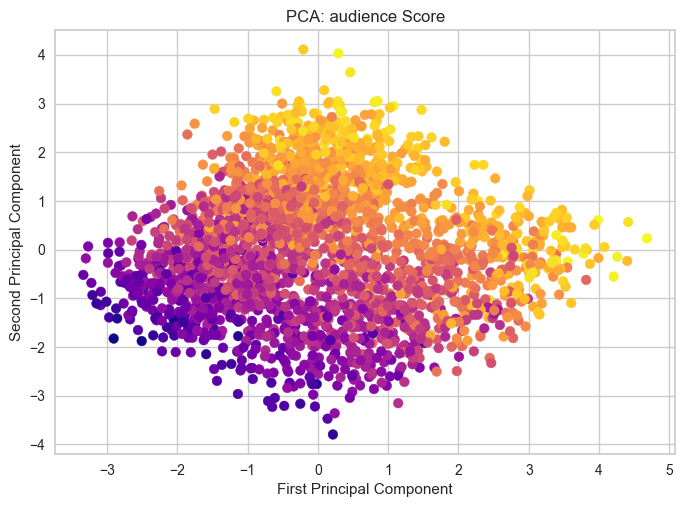

In [221]:
# select the numerical columns for PCA
num_cols = ['audienceScore', 'tomatoMeter', 'runtimeMinutes', 'boxOffice', 'releaseStreamingYears', 'releaseTheatersYears']
X = scaled_df[num_cols].values

# perform PCA on the dataset
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# plot the results
#plt.scatter(X_pca[:, 0], X_pca[:, 1],c=scaled_df['audienceScore'], cmap='viridis')
plt.scatter(X_pca[:, 0], X_pca[:, 1],c=scaled_df['audienceScore'], cmap='plasma')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA: audience Score')
plt.show()

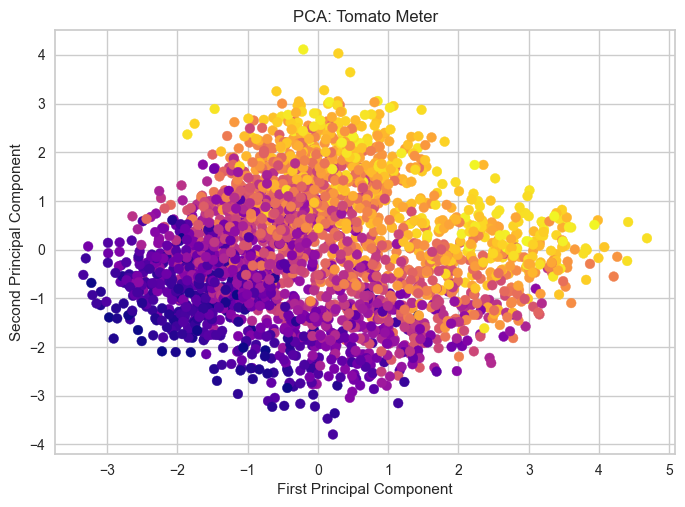

In [222]:
# plot the results for tomatoMeter
plt.scatter(X_pca[:, 0], X_pca[:, 1],c=scaled_df['tomatoMeter'], cmap='plasma')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA: Tomato Meter')
plt.show()

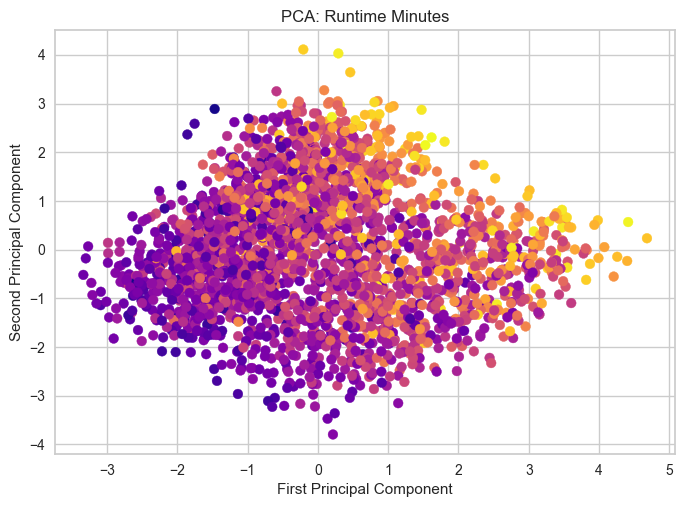

In [223]:
# plot the results for runtimeMinutes
plt.scatter(X_pca[:, 0], X_pca[:, 1],c=scaled_df['runtimeMinutes'], cmap='plasma')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA: Runtime Minutes')
plt.show()

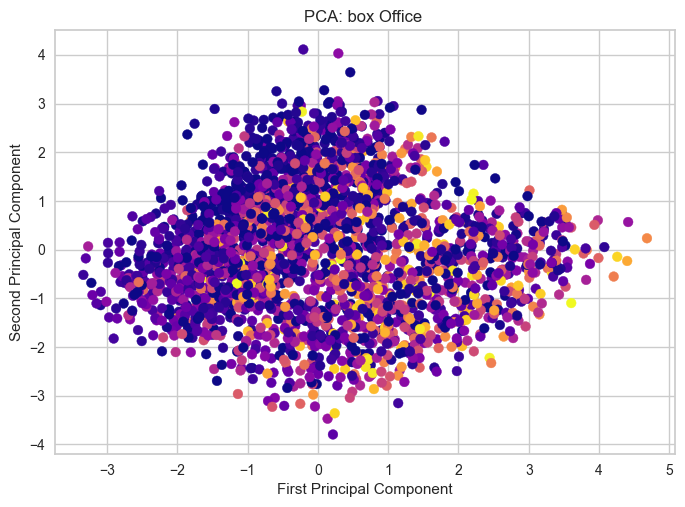

In [225]:
# plot the results for runtimeMinutes
plt.scatter(X_pca[:, 0], X_pca[:, 1],c=scaled_df['boxOffice'], cmap='plasma')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA: box Office ')
plt.show()

In [226]:
pca.fit(scaled_df)
PCA_df = pd.DataFrame(pca.transform(scaled_df), columns=["col1","col2"])
PCA_df.describe().T

,count,mean,std,min,25%,50%,75%,max
col1,2536.0,3.362190e-17,1.816695,-4.163410,-1.443663,-0.410651,1.503458,4.580173
col2,2536.0,6.654334e-18,1.415651,-3.688481,-1.086548,-0.032219,1.039781,4.498200


In [227]:
pca = PCA(n_components=3)
pca.fit(scaled_df)
PCA_df = pd.DataFrame(pca.transform(scaled_df), columns=(["col1","col2", "col3"]))
PCA_df.describe().T

,count,mean,std,min,25%,50%,75%,max
col1,2536.0,4.903193e-17,1.816695,-4.163405,-1.443668,-0.410645,1.503407,4.580200
col2,2536.0,-2.381551e-17,1.415651,-3.688691,-1.086432,-0.032170,1.040282,4.496942
col3,2536.0,8.405474e-18,1.162834,-2.771971,-0.842277,0.002656,0.844704,2.976136


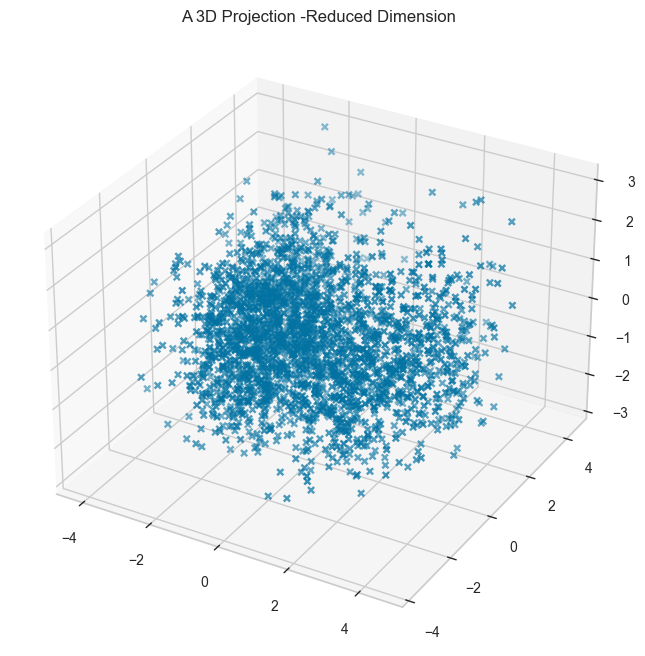

In [228]:
x =PCA_df["col1"]
y =PCA_df["col2"]
z =PCA_df["col3"]

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, marker="x" )
ax.set_title("A 3D Projection -Reduced Dimension")
plt.show()

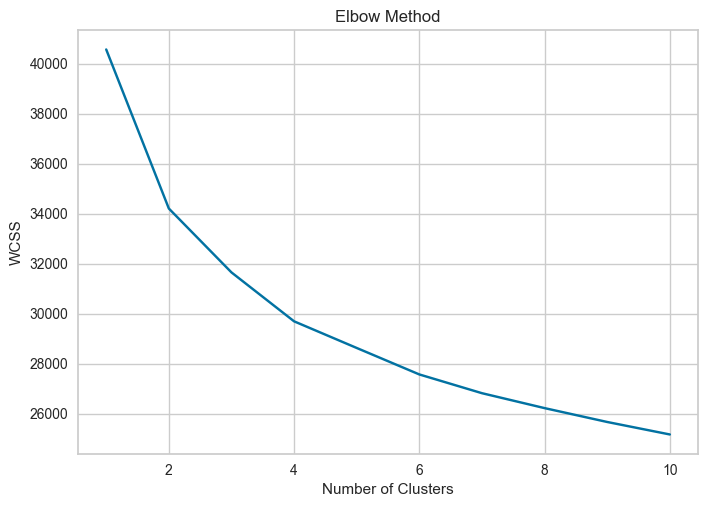

In [229]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Create a list to store WCSS values for each k
wcss = []

# Iterate over a range of k values
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(scaled_df)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

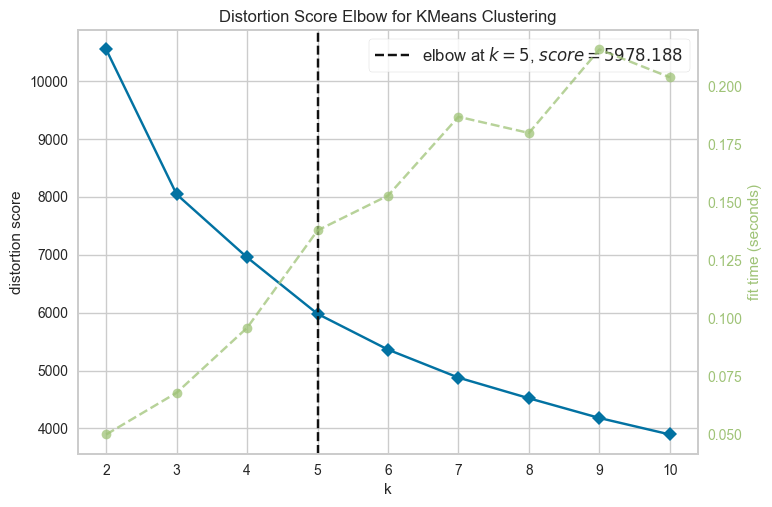

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [230]:
from yellowbrick.cluster import KElbowVisualizer

# Quick examination of elbow method to find numbers of clusters to make.
#print('Elbow Method to determine the number of clusters to be formed:')
Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(PCA_df)
Elbow_M.show()

In [231]:
from sklearn.cluster import AgglomerativeClustering

#Initiating the Agglomerative Clustering model 
AC = AgglomerativeClustering(n_clusters=5)

# fit model and predict clusters
yhat_AC = AC.fit_predict(PCA_df)
PCA_df["Clusters"] = yhat_AC
#Adding the Clusters feature to the orignal dataframe.
df["Clusters"]= yhat_AC

In [232]:
df.head()

,title,audienceScore,tomatoMeter,rating,ratingContents,runtimeMinutes,genre,originalLanguage,director,writer,boxOffice,distributor,soundMix,releaseStreamingYears,releaseTheatersYears,year,Clusters
0,1249,1.394393,1.641119,3,1511,-0.372630,103,8,1021,1839,-0.419152,281,150,-1.152271,-0.794024,2002,0
1,1535,-1.053476,-1.300371,2,234,0.920694,0,8,1087,187,0.263955,138,50,1.704518,1.600144,2018,1
2,1283,-1.834711,-1.079759,1,1903,-0.157076,103,8,982,203,-0.657633,52,212,-1.824456,-1.392566,1998,2
3,2520,0.456912,0.758672,3,670,0.920694,186,8,1092,1603,-0.871862,96,50,1.200378,1.151237,2015,1
4,967,0.456912,1.310201,3,1165,-0.157076,186,12,1094,1149,-0.896114,192,264,-0.816178,-0.494753,2004,0


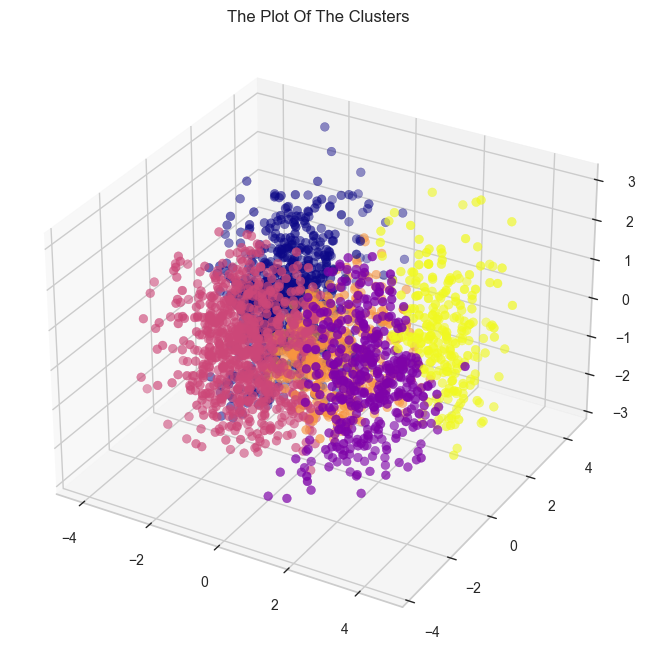

In [233]:
#Plotting the clusters
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111, projection='3d', label="bla")
ax.scatter(x, y, z, s=40, c=PCA_df["Clusters"], marker='o', cmap = 'plasma' )

ax.set_title("The Plot Of The Clusters")
plt.show()

# EVALUATING MODELS

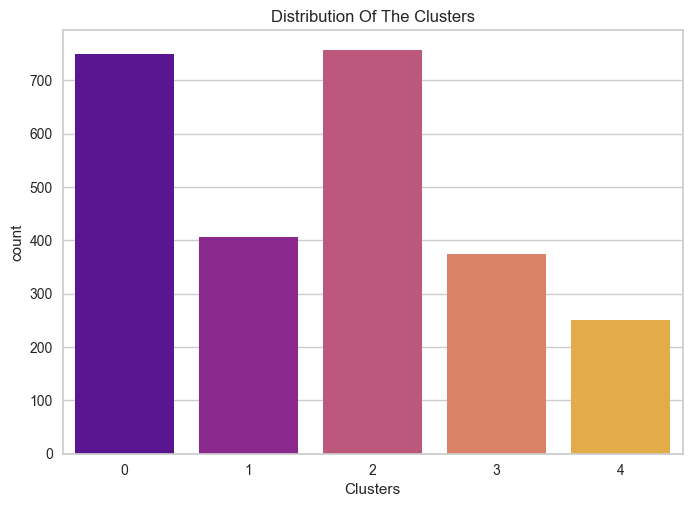

In [235]:
import seaborn as sns

# Generate a color palette
#viridis = sns.color_palette('viridis', n_colors=4)

# Plot
pl = sns.countplot(x=df["Clusters"], palette='plasma')
pl.set_title("Distribution Of The Clusters")
plt.show()


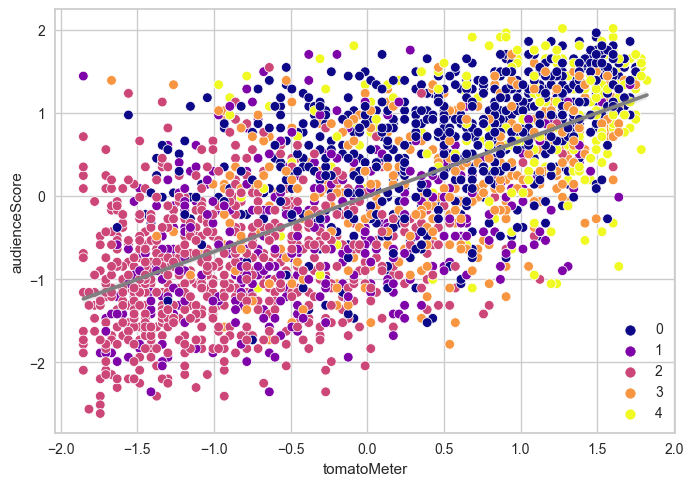

In [236]:
pl = sns.scatterplot(data = df,x=df["tomatoMeter"], y=df["audienceScore"],hue=df["Clusters"], palette='plasma')
sns.regplot(data=df, x="tomatoMeter", y="audienceScore", scatter=False, color='grey')
plt.legend()
plt.show()

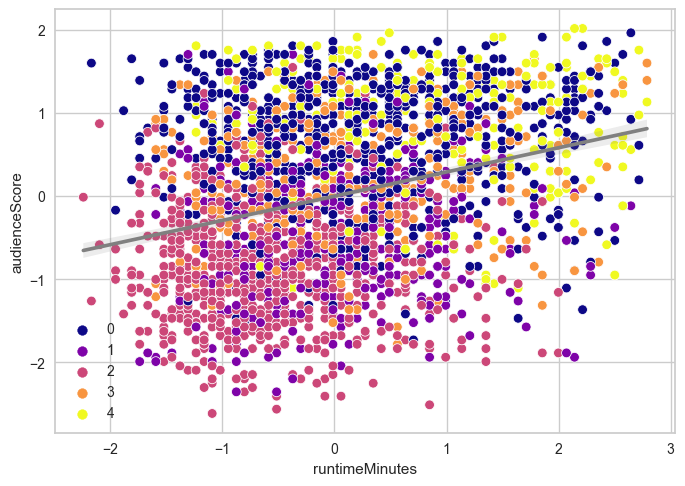

In [237]:
pl = sns.scatterplot(data = df,x=df["runtimeMinutes"], y=df["audienceScore"],hue=df["Clusters"], palette='plasma')
sns.regplot(data=df, x="runtimeMinutes", y="audienceScore", scatter=False, color='grey')
plt.legend()
plt.show()

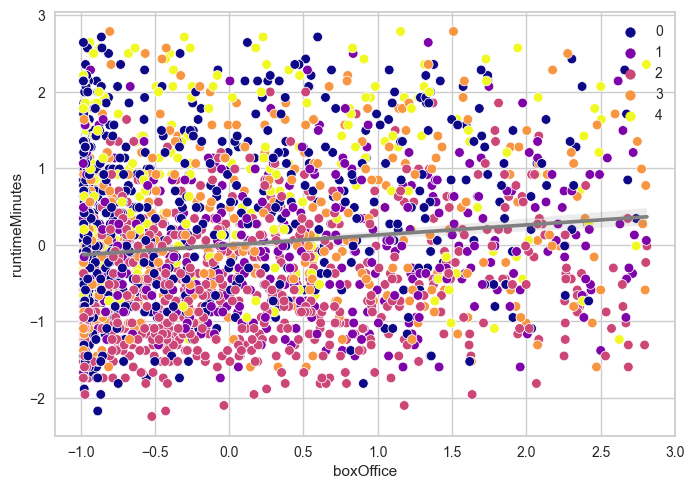

In [238]:
pl = sns.scatterplot(data = df,x=df["boxOffice"], y=df["runtimeMinutes"],hue=df["Clusters"], palette='plasma')
sns.regplot(data=df, x="boxOffice", y="runtimeMinutes", scatter=False, color='grey')
plt.legend()
plt.show()

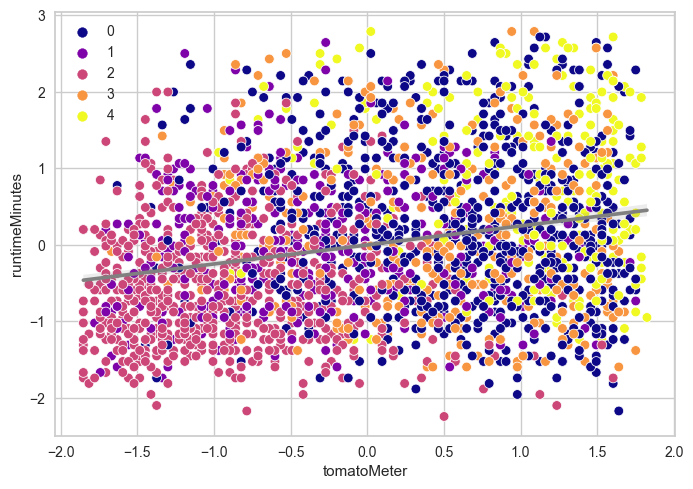

In [239]:
pl = sns.scatterplot(data = df,x=df["tomatoMeter"], y=df["runtimeMinutes"],hue=df["Clusters"], palette='plasma')
sns.regplot(data=df, x="tomatoMeter", y="runtimeMinutes", scatter=False, color='grey')
plt.legend()
plt.show()

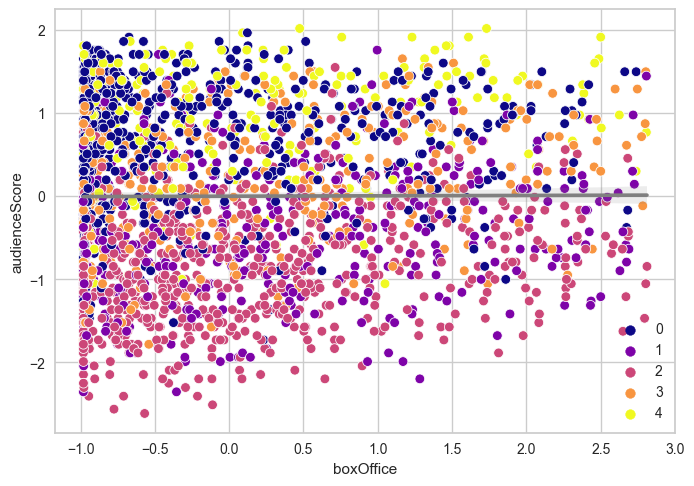

In [240]:
pl = sns.scatterplot(data = df,x=df["boxOffice"], y=df["audienceScore"],hue=df["Clusters"], palette='plasma')
sns.regplot(data=df, x="boxOffice", y="audienceScore", scatter=False, color='grey')
plt.legend()
plt.show()

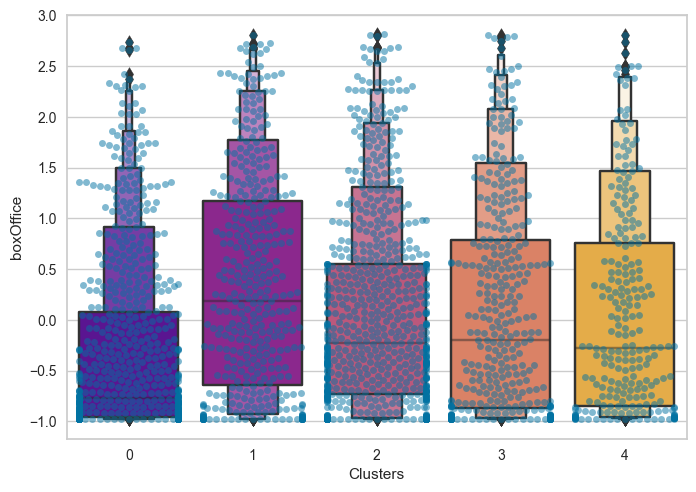

In [241]:
plt.figure()
pl=sns.swarmplot(x=df["Clusters"], y=df["boxOffice"], color= "b", alpha=0.5 )
pl=sns.boxenplot(x=df["Clusters"], y=df["boxOffice"], palette='plasma')
plt.show()

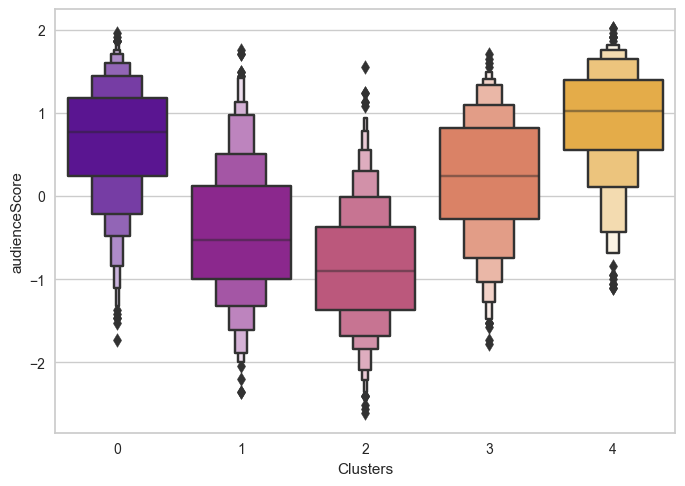

In [242]:
plt.figure()
#pl=sns.swarmplot(x=df["Clusters"], y=df["audienceScore"], color= "b", alpha=0.5 )
pl=sns.boxenplot(x=df["Clusters"], y=df["audienceScore"], palette='plasma')
plt.show()

In [267]:
df.to_csv('cleaned_rotten_tomatoes_movies5.csv', index=False)
df.to_excel('cleaned_rotten_tomatoes_movies5.xlsx', index=False)